### PCA Clustering for Kinematic Maps in MaNGA

This is the second notebook in the series for unsupervised learning.
This notebook will look at a CNN autoencoder, the purpose of which is to grab relevant information from kinematic maps and then the lower-dimensional parameter space can be used to do clustering.

In [4]:

import matplotlib.pyplot as plt
import numpy as np
import marvin
from marvin import config, marvindb
# Again, if this doesn't work, go read these instructions on setting it up - https://github.com/sdss/marvin
from marvin.tools.maps import Maps
import pyfits
import os
from marvin.tools.query import Query
from sh import gunzip
from marvin.utils.general import downloadList
import random
import re
from astropy.io import fits


%matplotlib inline

config.access = 'collab'#'collab' if collab
# Option to choose the data release you would like to use:
config.setRelease('MPL-7')#MPL-8 if public
print('Access is',config.access)

# Okay so now that you have downloaded everything it is time to search through your directory for maps
# and assembly a list of existing data in order to run an analysis



# You can also use os to get you the names of all directories in a folder
#print(os.listdir())
# This will yield a tuple for each subdirectory. Ths first entry in the 3-tuple is a directory name, so:

plates = [x[0] for x in os.walk('/Users/beckynevin/sas/mangawork/manga/spectro/analysis/v2_5_3/2.3.0/VOR10-MILESHC-MILESHC/')]




existing_plateifus=[]

for j in range(len(plates)):
    if re.split('/',plates[j])[-2]=='VOR10-MILESHC-MILESHC':# or re.split('/',plates[j])[-1] != '12701':
        continue
    else:
        existing_plateifus.append(str(re.split('/',plates[j])[-2])+'-'+str(re.split('/',plates[j])[-1]))
#print(existing_plateifus)
print('this is how many galaxies you are working with (that exist on your computer)', len(existing_plateifus))
# Now you need to construct plateifu names of what exists

[WARNING]: path /Users/beckynevin/sas/mangawork/manga/spectro/redux/v2_4_3/drpall-v2_4_3.fits cannot be found. Setting drpall to None. (MarvinUserWarning)
[WARNING]: path /Users/beckynevin/sas/mangawork/manga/spectro/analysis/v2_4_3/2.2.1/dapall-v2_4_3-2.2.1.fits cannot be found. Setting dapall to None. (MarvinUserWarning)


Access is collab
this is how many galaxies you are working with (that exist on your computer) 1128


In [5]:
# I'm running into a weird limit error code:
# OSError: [Errno 24] Too many open files
import resource
print(resource.getrlimit(resource.RLIMIT_NOFILE))
resource.setrlimit(resource.RLIMIT_NOFILE, (10000,-1))

(4096, 9223372036854775807)


This next section goes about building the map_array_ml, which contains all of the galaxies.

What if I instead want to play with existing kin maps (that I have de-rotated)?


[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8155-12701.fits' mode='rb' closefd=True> (ResourceWarning)


plates ['8155-12701.fits', '8997-12702.fits', '8328-12701.fits', '8600-12701.fits', '8456-3702.fits', '8555-12703.fits', '9186-12705.fits', '10221-12703.fits', '8597-12704.fits', '8341-12703.fits', '7962-12701.fits', '8566-1902.fits', '8625-12702.fits', '8458-12702.fits', '8985-12701.fits', '8147-12702.fits', '8937-3702.fits', '8988-3704.fits', '8946-12703.fits', '8601-12704.fits', '8329-12704.fits', '8945-6104.fits', '7815-12704.fits', '9509-12704.fits', '8722-12704.fits', '8466-9101.fits', '9034-3701.fits', '10496-3701.fits', '9024-1902.fits', '8980-1901.fits', '8139-12702.fits', '9183-12704.fits', '9000-12703.fits', '8486-12705.fits', '8250-12702.fits', '9869-12705.fits', '8456-12701.fits', '8592-6102.fits', '8326-12702.fits', '8249-12703.fits', '8999-12701.fits', '9870-12704.fits', '8992-12703.fits', '8949-12705.fits', '9485-12705.fits', '8550-12702.fits', '7975-12703.fits', '8078-12702.fits', '9496-12703.fits', '8651-12705.fits', '8335-9101.fits', '8932-9101.fits', '8148-12704.fit

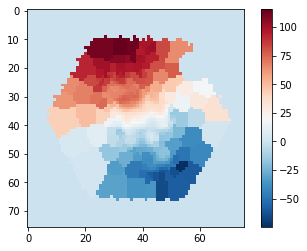

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8155-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8997-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8997-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8328-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8328-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8600-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_m

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9509-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9509-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8722-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8722-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8466-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8466-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8550-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7975-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/7975-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8078-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8078-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9496-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_m

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8243-9102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8243-9102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8615-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8615-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9029-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9029-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9494-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9514-6103.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9514-6103.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8462-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8462-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7815-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8994-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8994-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8979-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8979-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8603-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8603-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/10215-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8134-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8134-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9512-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9512-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8720-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9885-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9885-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8606-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8606-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8991-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8991-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/10508-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8252-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8252-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9185-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9185-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8944-6103.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8550-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8550-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8726-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8726-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7975-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/7975-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_m

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8452-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9501-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9501-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9041-1902.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9041-1902.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9489-6103.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9186-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9186-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9874-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9874-6104.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9499-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9499-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9488-6102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8567-3704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8567-3704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7977-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/7977-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9494-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/10514-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/10514-12703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8995-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8995-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8158-6102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8158-6102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_m

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9888-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8588-3703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8588-3703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8986-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8986-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8320-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8996-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8996-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8154-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8154-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9863-3704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9863-3704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9181-3703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9870-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9870-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8942-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8942-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8249-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_ma

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9047-9102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9047-9102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8141-6102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8141-6102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7495-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/7495-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8550-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9485-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9485-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8156-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8156-6101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7975-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7968-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/7968-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9038-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9038-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8082-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8082-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_m

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9186-12702.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/10215-3703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/10215-3703.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8549-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8549-9101.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8455-6102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9088-9102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9088-9102.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8595-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8595-12705.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9184-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9184-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/9510-3704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/7964-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/7964-12704.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/8591-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/8591-12701.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/9095-1901.fits' mode='rb' closefd=True> (ResourceWarning)
[WARNING]: unclosed file <_io.FileIO name='/Users/beckynevin/CfA_Code/Kinematic_ML/kin_map

IndexError: list index out of range

In [6]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import pyfits
# There has gotta be a faster way to just reload a couple of galaxies
# This will yield a tuple for each subdirectory. Ths first entry in the 3-tuple is a directory name, so:

plates = os.listdir('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/')
#plates_e = os.listdir('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/')

#[x[0] for x in os.walk('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/')]
print('plates',plates)



# import test to get shape
im = pyfits.open('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/'+str(plates[0]))[1].data
plt.clf()
plt.imshow(im, cmap='RdBu_r')
plt.colorbar()
plt.show()

shape = np.shape(im)[0]
map_array_ml = np.zeros((len(plates),shape**2))#np.zeros((len(plateifu_list),74**2))
map_array_ml_e = np.zeros((len(plates),shape**2))#np.zeros((len(plateifu_list),74**2))

ifu_name=[]

counter=0


r_eff_list=[]

for j in range(len(plates)):
    #initial_split = str((re.split('_',plates[j]))[2])
    ifu_1 = re.split('-',(plates[j]))[0]
    
    ifu_2_split = re.split('-',(plates[j]))[1]
    ifu_2 = re.split('.f',(ifu_2_split))[0]
    
    ifu_name.append(str(ifu_1)+'-'+str(ifu_2))
    
    mapit = pyfits.open('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/'+str(plates[j]))[1].data
    map_array_ml[j,:] = np.reshape(mapit,(shape**2))
    
    mapit_e = pyfits.open('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps_e/'+str(plates[j]))[1].data
    map_array_ml_e[j,:] = np.reshape(mapit_e,(shape**2))
    # I think 'reff' is actually in arcsec 0.5"/pixel
    
    r_eff_list.append(2*float(pyfits.open('/Users/beckynevin/CfA_Code/Kinematic_ML/kin_maps/'+str(plates[j]))[0].header['REFF']))
    #existing_plateifus.append(str(re.split('/',plates[j])[-2])+'-'+str(re.split('/',plates[j])[-1]))
print(ifu_name)

['8155-12701', '8997-12702', '8328-12701', '8600-12701', '8456-3702', '8555-12703', '9186-12705', '10221-12703', '8597-12704', '8341-12703', '7962-12701', '8566-1902', '8625-12702', '8458-12702', '8985-12701', '8147-12702', '8937-3702', '8988-3704', '8946-12703', '8601-12704', '8329-12704', '8945-6104', '7815-12704', '9509-12704', '8722-12704', '8466-9101', '9034-3701', '10496-3701', '9024-1902', '8980-1901', '8139-12702', '9183-12704', '9000-12703', '8486-12705', '8250-12702', '9869-12705', '8456-12701', '8592-6102', '8326-12702', '8249-12703', '8999-12701', '9870-12704', '8992-12703', '8949-12705', '9485-12705', '8550-12702', '7975-12703', '8078-12702', '9496-12703', '8651-12705', '8335-9101', '8932-9101', '8148-12704', '8603-9102', '8243-12704', '8948-9101', '8998-12704', '8141-6104', '7993-12702', '9883-3701', '8938-12703', '8079-6101', '9001-6104', '8146-6103', '8977-6103', '8145-3704', '8084-12701', '9507-3701', '8243-9102', '8615-12705', '9029-6101', '10508-12705', '8252-12704',

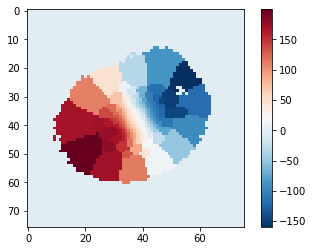

In [7]:
# This is how many galaxies you have in your map_array_ml cube
print(ifu_name)
print(len(ifu_name))


# To prepare the map cube (map_array_ml) for ML algorithms,
# it is necessary to first cut off all the empty rows.

# Removing all rows that were not filled (above)
data = map_array_ml[~np.all(map_array_ml == 0, axis=1)]
#print(np.shape(data))
plt.imshow(np.reshape(data[60], (76,76)), cmap='RdBu_r')
plt.colorbar()
plt.show()
data_length = np.shape(data)[0]
map_array_ml = data

size = int(np.sqrt(np.shape(map_array_ml[0])[0]))
map_array_ml = data
#map_array_ml = np.ma.masked_where(data==0., data)

###  De-rotate

In [8]:
import matplotlib
class MidpointNormalize(matplotlib.colors.Normalize):
    """
    Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

    e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
    """
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        matplotlib.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))
    #elev_min=-150
    #elev_max=3000
def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- Numpy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values-average)**2, weights=weights)
    return (average, math.sqrt(variance))
def minimize_left_right(vel, vel_e, verbose):
    # This is a different way to rotate, where I sum up the left and right side sum, 
    # but it needs to 1) only count once for binned data and 2) take the error into account possibly
    
    
    
    if verbose=='yes':
        plt.imshow(vel)
        plt.colorbar()
        plt.show()
        plt.imshow(vel_e)
        plt.colorbar()
        plt.show()

    # First to delete all repeat indices use this:
    
    # To do this put into list form
    vel_list = list(np.reshape(vel, np.shape(vel)[0]**2))
    vel_list_e = list(np.reshape(vel_e, np.shape(vel_e)[0]**2))
    indices=[] # Your output list  
    
    for elem in set(vel_list):
        indices.append(vel_list.index(elem))
    
    vel_norep=[]
    vel_e_norep=[]
    index=0
    for j in vel_list:
        if j == 0.0:
            vel_norep.append(0.0)
            vel_e_norep.append(0.0)
            index +=1
            continue
        #print('this is the velocity associated with that', j)
        
        #if vel_list.index(elem) exists in the index list then keep it the same, otherwise make it into a zero
        counter=0
        if index in indices:
            vel_norep.append(j)
            vel_e_norep.append(vel_list_e[index])
            index +=1
        else:
            vel_norep.append(0.0)
            vel_e_norep.append(0.0)
            index +=1
       
                
        
                
        
    vel_norep = np.reshape(vel_norep, (np.shape(vel)[0], np.shape(vel)[0]))
    vel_e_norep = np.reshape(vel_e_norep, (np.shape(vel)[0], np.shape(vel)[0]))
    
  
    
    shift_y, shift_x = np.array(tester_gal.shape[:2]) / 2.
    
    
    
    tf_shift = transform.SimilarityTransform(translation=[-shift_x, -shift_y])
    tf_shift_inv = transform.SimilarityTransform(translation=[shift_x, shift_y])

    
    testing=np.linspace(0,360, 60)
    
    total_sum=[]
    
    for j in range(len(testing)):
        tf_rotate = transform.SimilarityTransform(rotation=np.deg2rad(testing[j]))
        rot = transform.warp(vel_norep, (tf_shift + (tf_rotate + tf_shift_inv)).inverse)
        rot = np.ma.masked_where(rot==0, rot)
        if verbose=='yes':
            plt.clf()
            plt.imshow(rot, cmap='RdBu_r')
            plt.colorbar()
            plt.title('Rotated = '+str(testing[j]))
        
        
        left_sum = np.sum(rot[:,0:int(np.shape(rot)[0]/2)])
        right_sum = np.sum(rot[:,int(np.shape(rot)[0]/2):])
        total_sum.append(right_sum-left_sum)
        if verbose=='yes':
            plt.annotate('Sum = '+str(round(right_sum-left_sum, 1)), xy=(0.1,0.1), xycoords='axes fraction')
            plt.show()
    import operator
    index, value = max(enumerate(total_sum), key=operator.itemgetter(1))
    if verbose=='yes':
        print('index, value', index, value)  
        print('minimized at this rot ', testing[index])
    
    tf_rotate = transform.SimilarityTransform(rotation=np.deg2rad(testing[index]))
    rot = transform.warp(vel_norep, (tf_shift + (tf_rotate + tf_shift_inv)).inverse)
    rot = np.ma.masked_where(rot==0, rot)
    rot_e = transform.warp(vel_e_norep, (tf_shift + (tf_rotate + tf_shift_inv)).inverse)
    rot_e = np.ma.masked_where(rot_e==0, rot_e)
    rot_vor = transform.warp(vel, (tf_shift + (tf_rotate + tf_shift_inv)).inverse)
    rot_vor = np.ma.masked_where(rot_vor==0, rot_vor)
    return testing[index], rot, rot_vor, rot_e, value
print('Compiled and ready to run')

Compiled and ready to run


[WARNING]: unclosed file <_io.TextIOWrapper name='/Users/beckynevin/anaconda3/lib/python3.7/site-packages/pytest.py' mode='r' encoding='utf-8'> (ResourceWarning)
[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)


/Users/beckynevin/CfA_Code/Kinematic_ML
(503, 5776)
503


<Figure size 432x288 with 0 Axes>

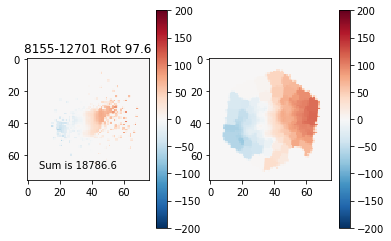

<Figure size 432x288 with 0 Axes>

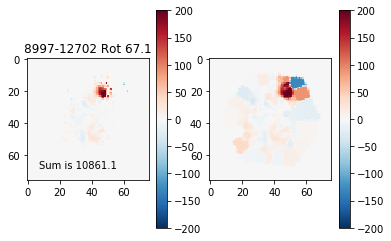

<Figure size 432x288 with 0 Axes>

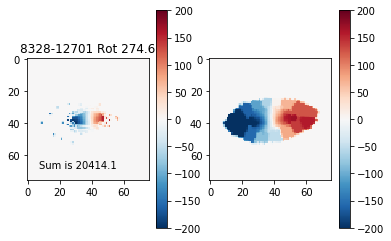

<Figure size 432x288 with 0 Axes>

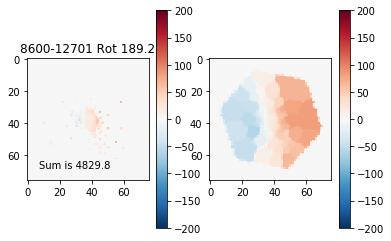

<Figure size 432x288 with 0 Axes>

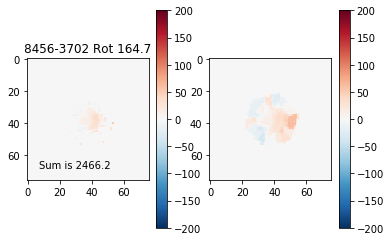

<Figure size 432x288 with 0 Axes>

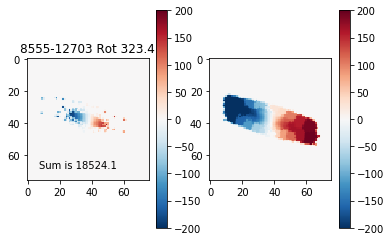

<Figure size 432x288 with 0 Axes>

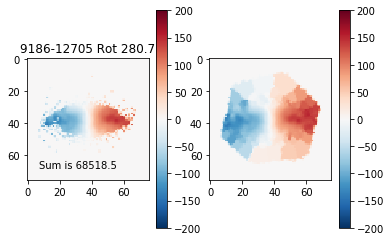

<Figure size 432x288 with 0 Axes>

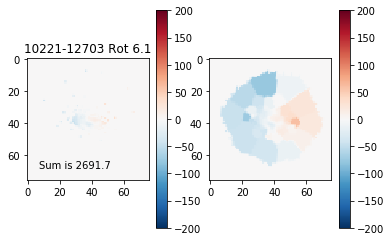

<Figure size 432x288 with 0 Axes>

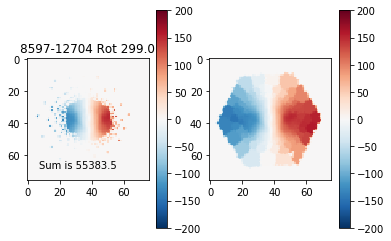

<Figure size 432x288 with 0 Axes>

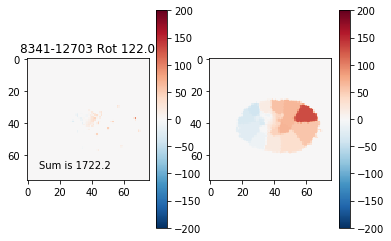

<Figure size 432x288 with 0 Axes>

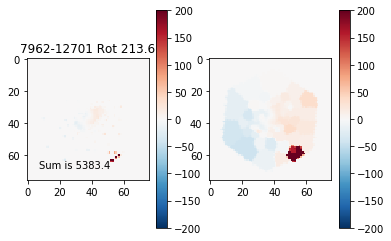

<Figure size 432x288 with 0 Axes>

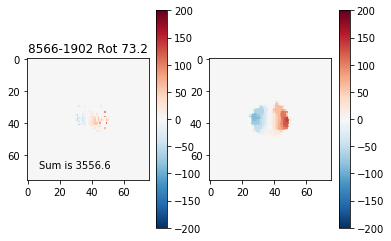

<Figure size 432x288 with 0 Axes>

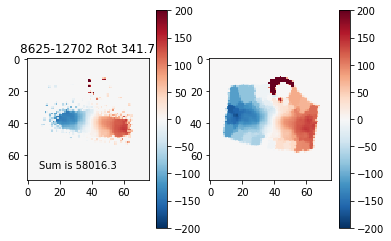

<Figure size 432x288 with 0 Axes>

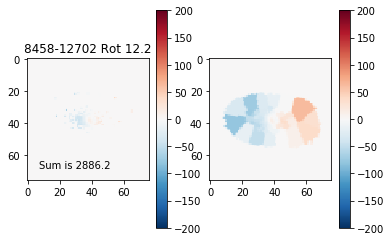

<Figure size 432x288 with 0 Axes>

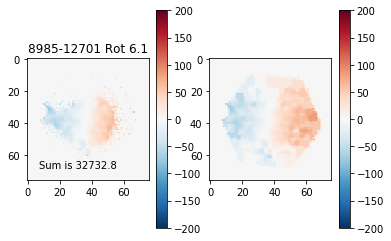

<Figure size 432x288 with 0 Axes>

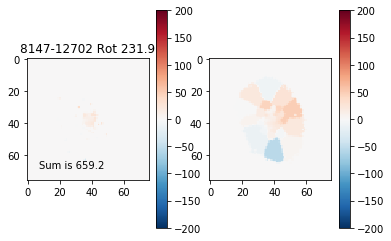

<Figure size 432x288 with 0 Axes>

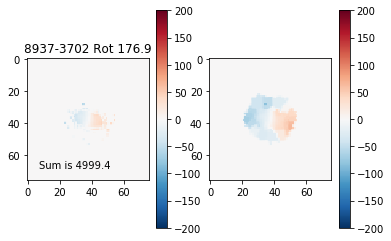

<Figure size 432x288 with 0 Axes>

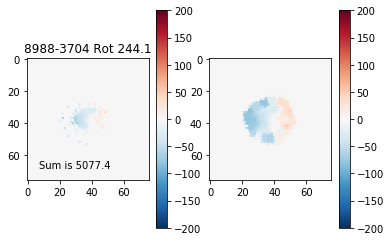

<Figure size 432x288 with 0 Axes>

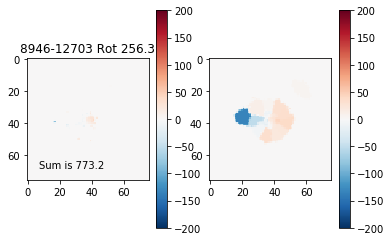

<Figure size 432x288 with 0 Axes>

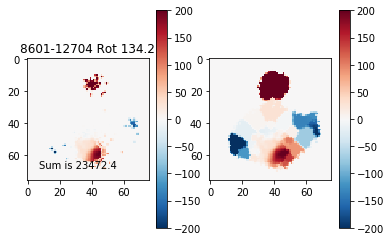

<Figure size 432x288 with 0 Axes>

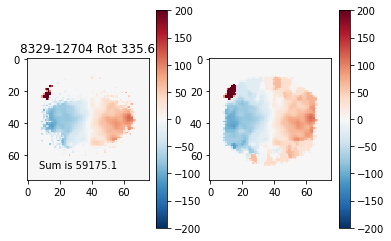

<Figure size 432x288 with 0 Axes>

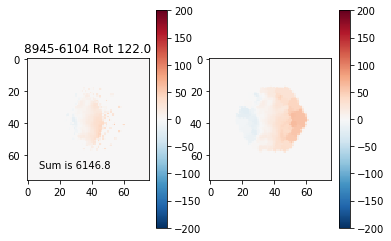

<Figure size 432x288 with 0 Axes>

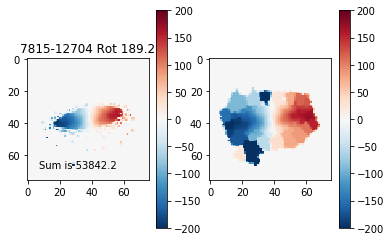

<Figure size 432x288 with 0 Axes>

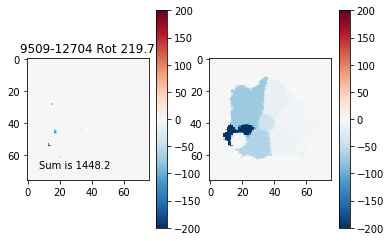

<Figure size 432x288 with 0 Axes>

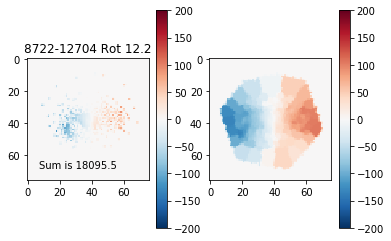

<Figure size 432x288 with 0 Axes>

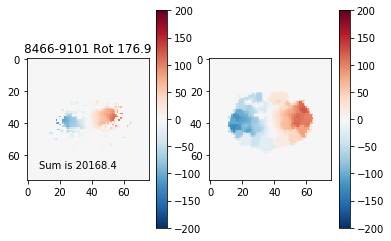

<Figure size 432x288 with 0 Axes>

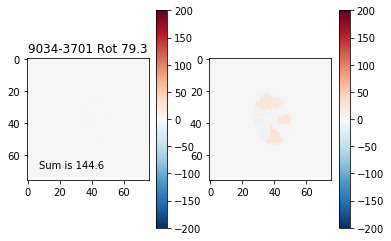

<Figure size 432x288 with 0 Axes>

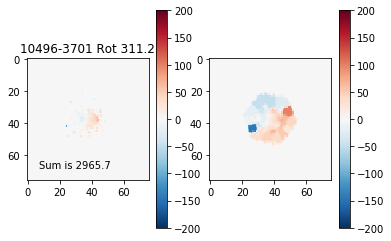

<Figure size 432x288 with 0 Axes>

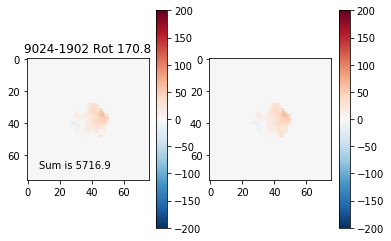

<Figure size 432x288 with 0 Axes>

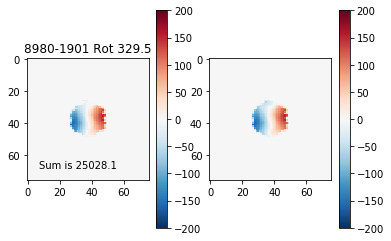

<Figure size 432x288 with 0 Axes>

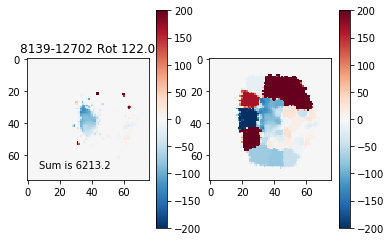

<Figure size 432x288 with 0 Axes>

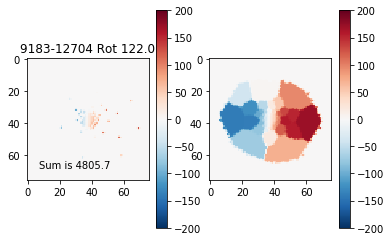

<Figure size 432x288 with 0 Axes>

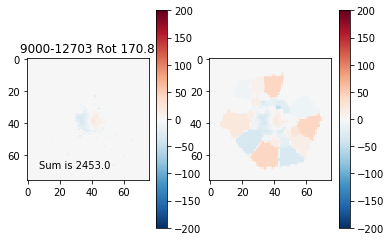

<Figure size 432x288 with 0 Axes>

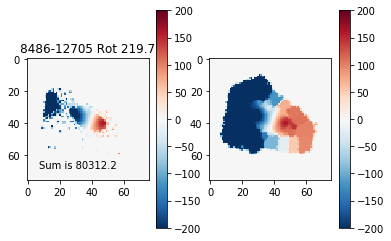

<Figure size 432x288 with 0 Axes>

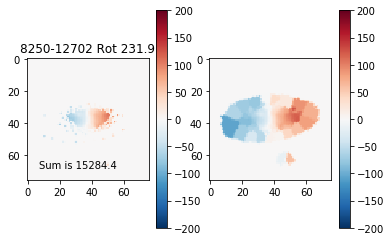

<Figure size 432x288 with 0 Axes>

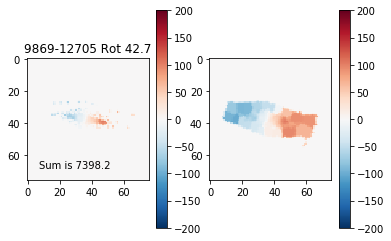

<Figure size 432x288 with 0 Axes>

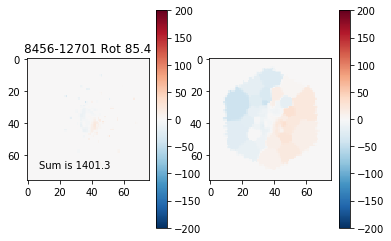

<Figure size 432x288 with 0 Axes>

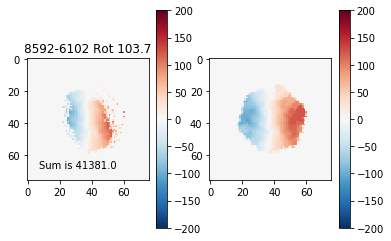

<Figure size 432x288 with 0 Axes>

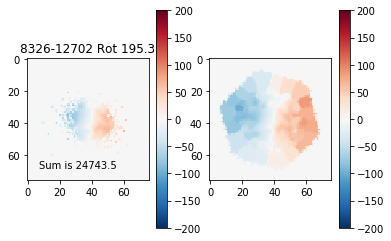

<Figure size 432x288 with 0 Axes>

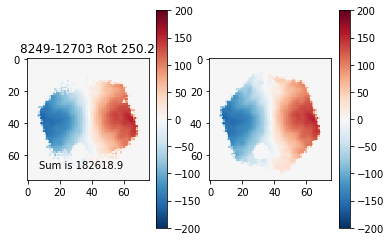

<Figure size 432x288 with 0 Axes>

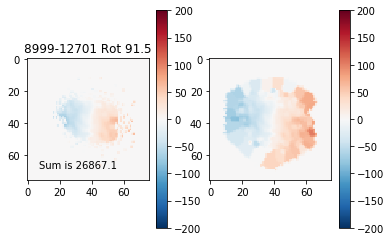

<Figure size 432x288 with 0 Axes>

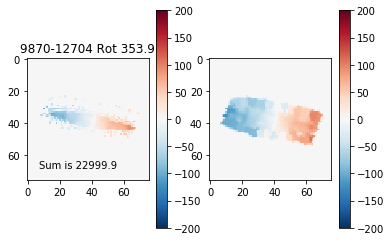

<Figure size 432x288 with 0 Axes>

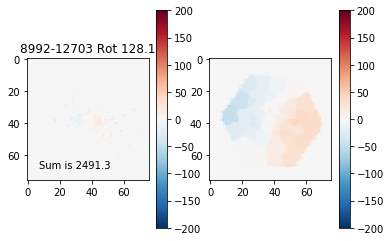

<Figure size 432x288 with 0 Axes>

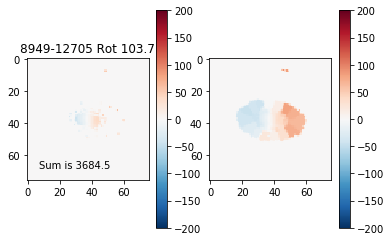

<Figure size 432x288 with 0 Axes>

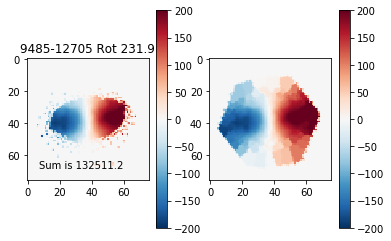

<Figure size 432x288 with 0 Axes>

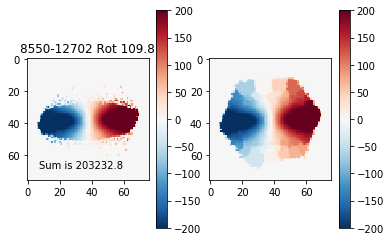

<Figure size 432x288 with 0 Axes>

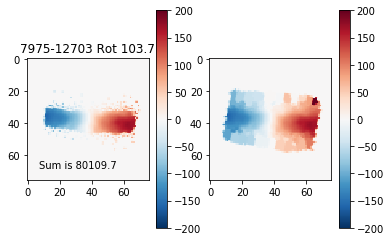

<Figure size 432x288 with 0 Axes>

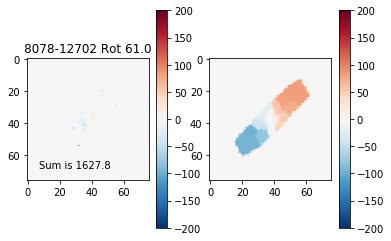

<Figure size 432x288 with 0 Axes>

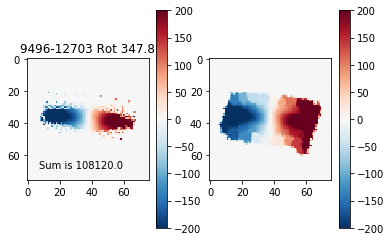

<Figure size 432x288 with 0 Axes>

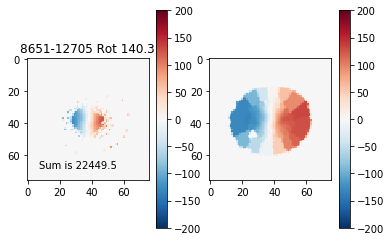

<Figure size 432x288 with 0 Axes>

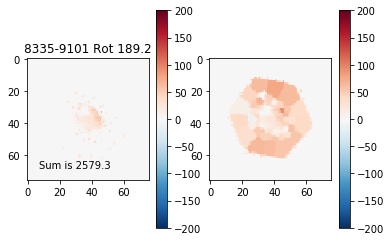

<Figure size 432x288 with 0 Axes>

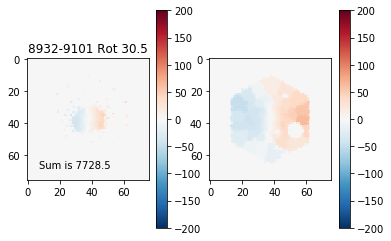

<Figure size 432x288 with 0 Axes>

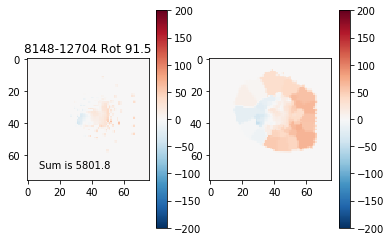

<Figure size 432x288 with 0 Axes>

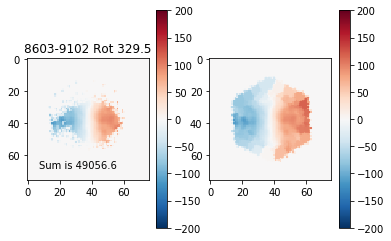

<Figure size 432x288 with 0 Axes>

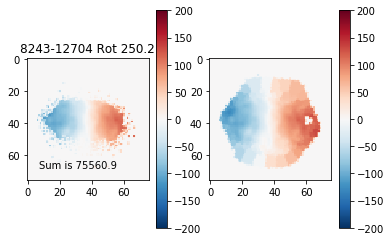

<Figure size 432x288 with 0 Axes>

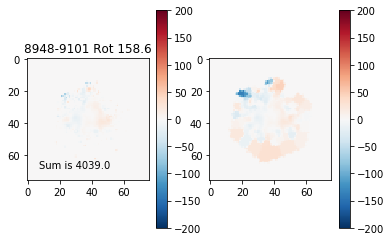

<Figure size 432x288 with 0 Axes>

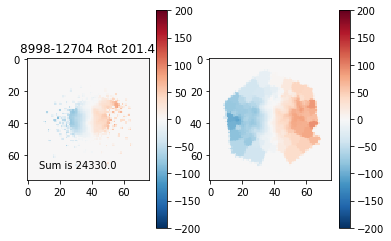

<Figure size 432x288 with 0 Axes>

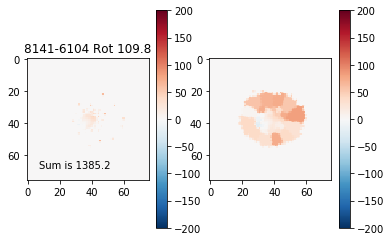

<Figure size 432x288 with 0 Axes>

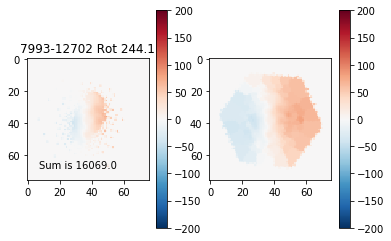

<Figure size 432x288 with 0 Axes>

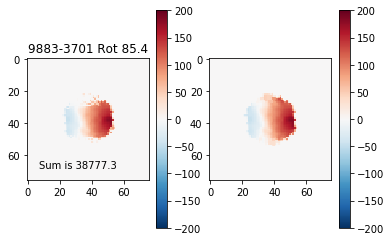

<Figure size 432x288 with 0 Axes>

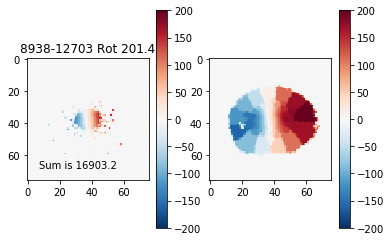

<Figure size 432x288 with 0 Axes>

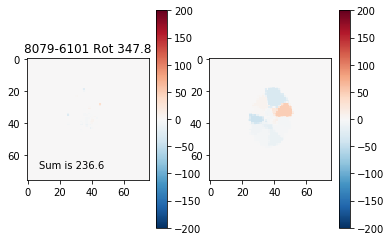

<Figure size 432x288 with 0 Axes>

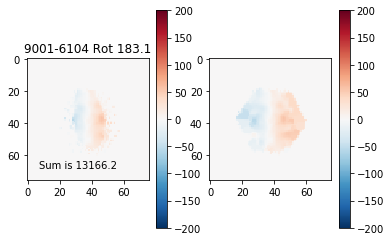

<Figure size 432x288 with 0 Axes>

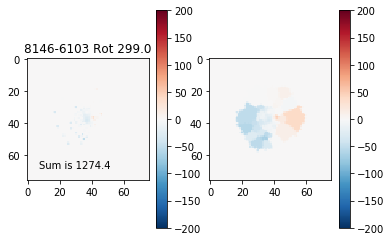

<Figure size 432x288 with 0 Axes>

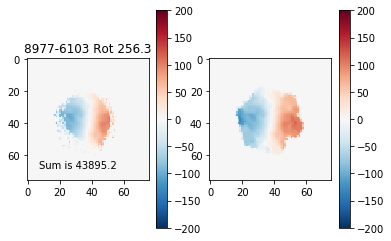

<Figure size 432x288 with 0 Axes>

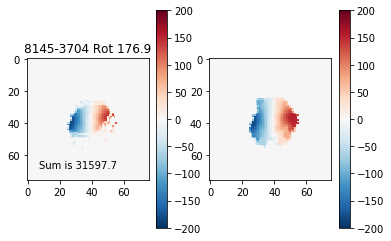

<Figure size 432x288 with 0 Axes>

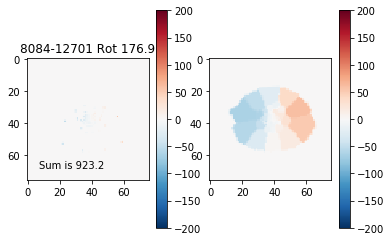

<Figure size 432x288 with 0 Axes>

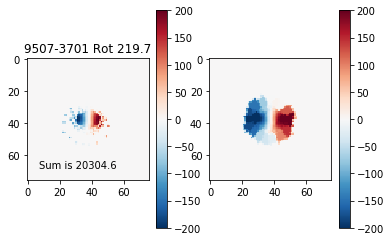

<Figure size 432x288 with 0 Axes>

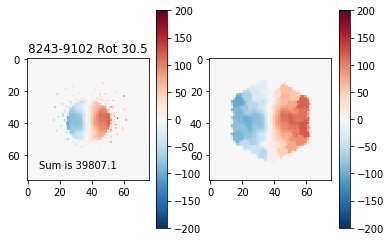

<Figure size 432x288 with 0 Axes>

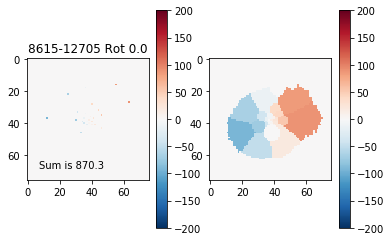

<Figure size 432x288 with 0 Axes>

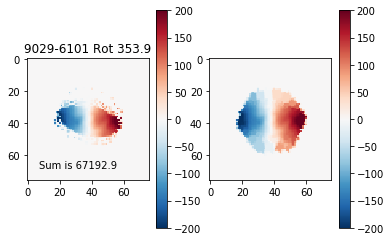

<Figure size 432x288 with 0 Axes>

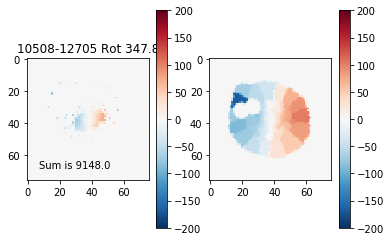

<Figure size 432x288 with 0 Axes>

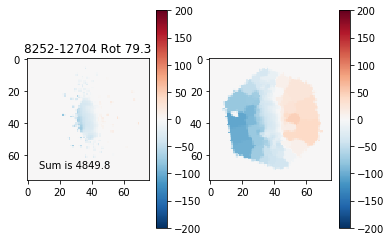

<Figure size 432x288 with 0 Axes>

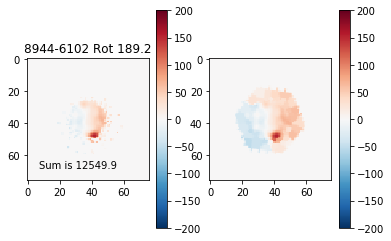

<Figure size 432x288 with 0 Axes>

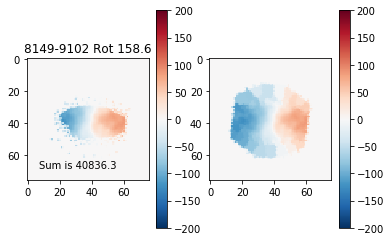

<Figure size 432x288 with 0 Axes>

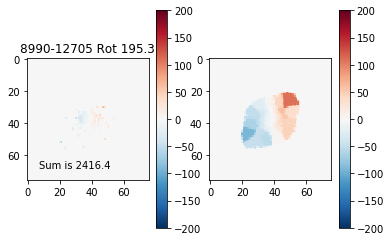

<Figure size 432x288 with 0 Axes>

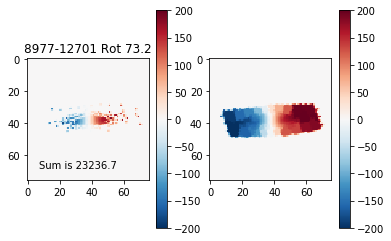

<Figure size 432x288 with 0 Axes>

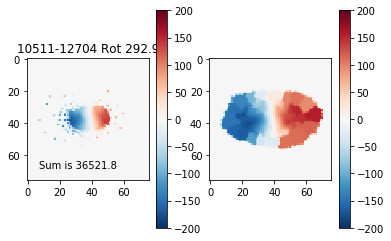

<Figure size 432x288 with 0 Axes>

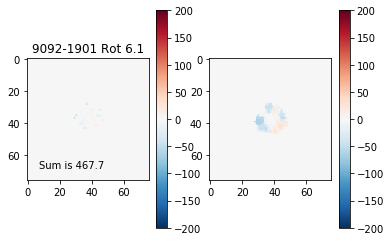

<Figure size 432x288 with 0 Axes>

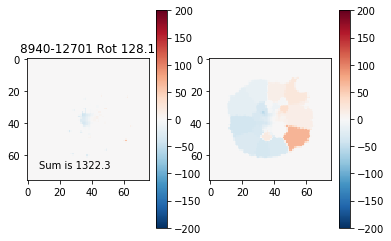

<Figure size 432x288 with 0 Axes>

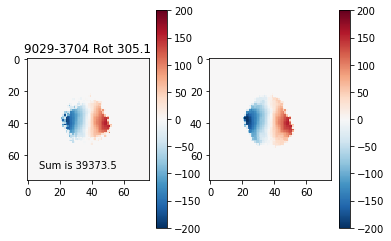

<Figure size 432x288 with 0 Axes>

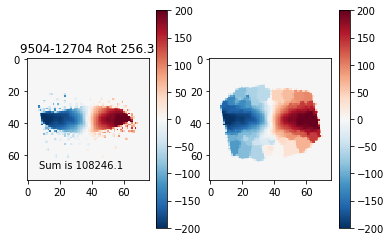

<Figure size 432x288 with 0 Axes>

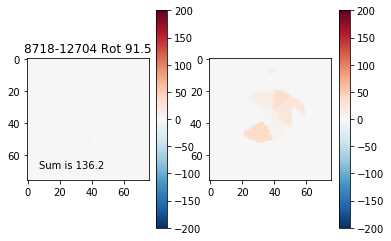

<Figure size 432x288 with 0 Axes>

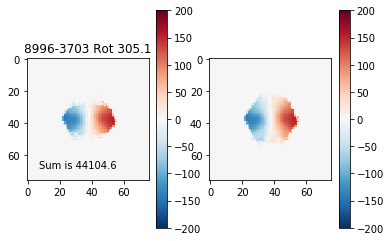

<Figure size 432x288 with 0 Axes>

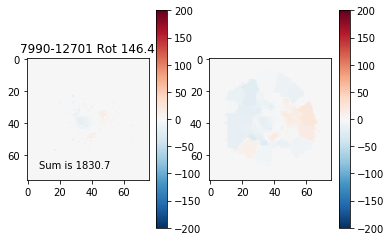

<Figure size 432x288 with 0 Axes>

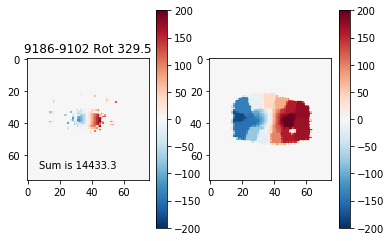

<Figure size 432x288 with 0 Axes>

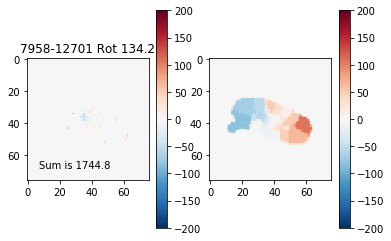

<Figure size 432x288 with 0 Axes>

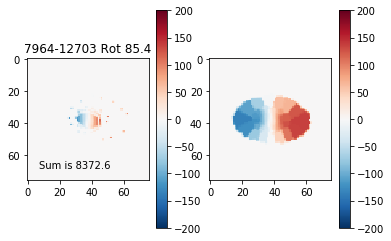

<Figure size 432x288 with 0 Axes>

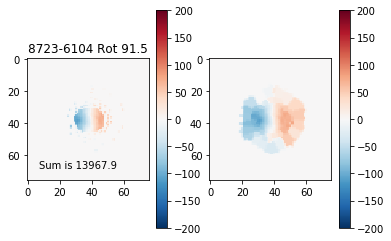

<Figure size 432x288 with 0 Axes>

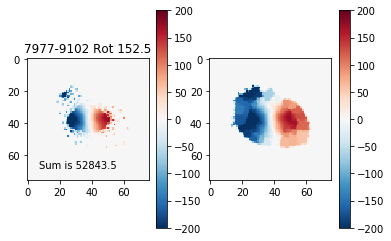

<Figure size 432x288 with 0 Axes>

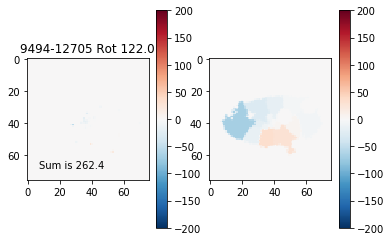

<Figure size 432x288 with 0 Axes>

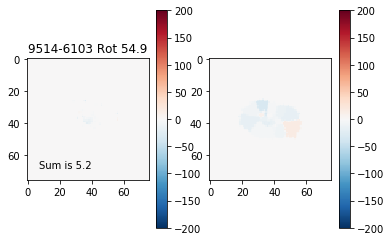

<Figure size 432x288 with 0 Axes>

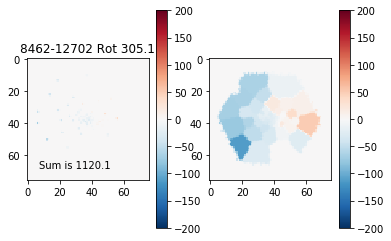

<Figure size 432x288 with 0 Axes>

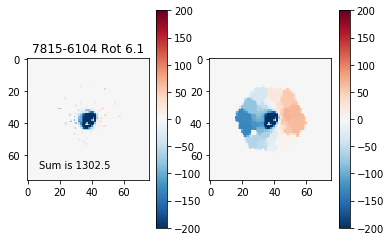

<Figure size 432x288 with 0 Axes>

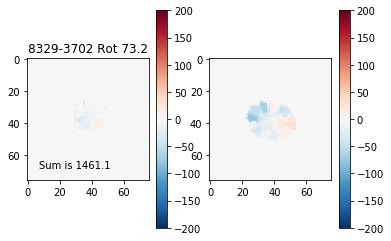

<Figure size 432x288 with 0 Axes>

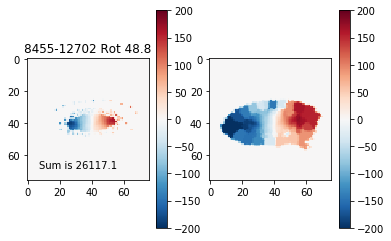

<Figure size 432x288 with 0 Axes>

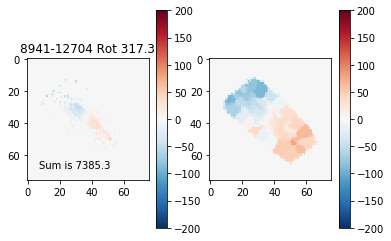

<Figure size 432x288 with 0 Axes>

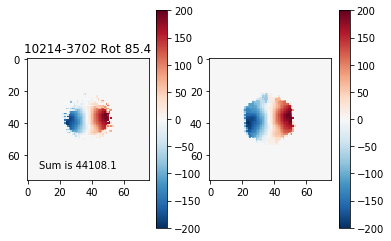

<Figure size 432x288 with 0 Axes>

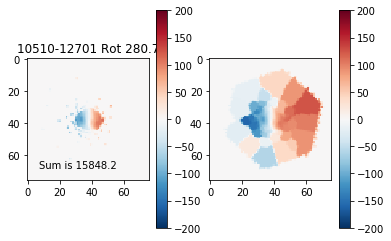

<Figure size 432x288 with 0 Axes>

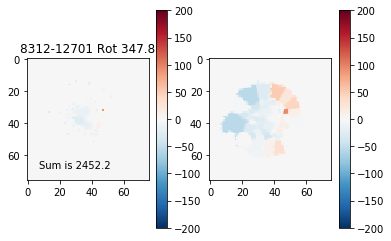

<Figure size 432x288 with 0 Axes>

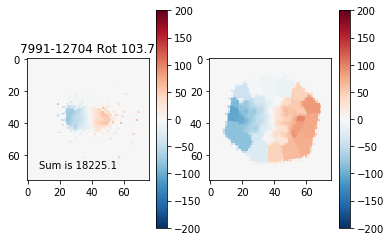

<Figure size 432x288 with 0 Axes>

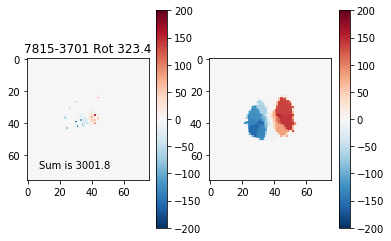

<Figure size 432x288 with 0 Axes>

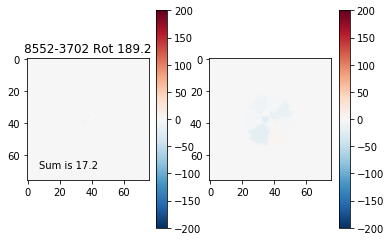

<Figure size 432x288 with 0 Axes>

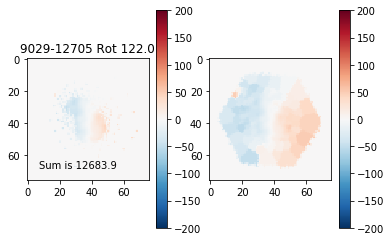

<Figure size 432x288 with 0 Axes>

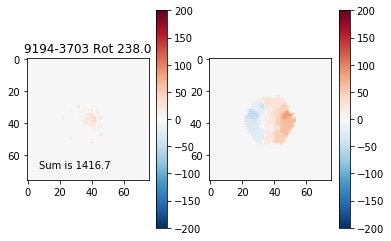

<Figure size 432x288 with 0 Axes>

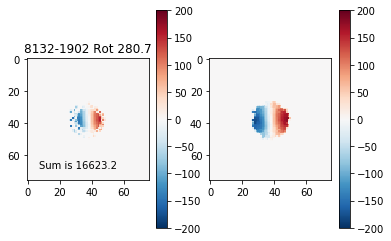

<Figure size 432x288 with 0 Axes>

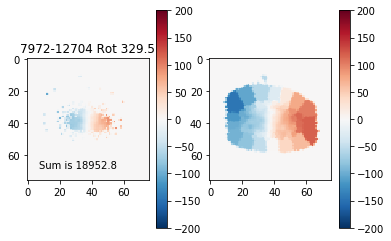

<Figure size 432x288 with 0 Axes>

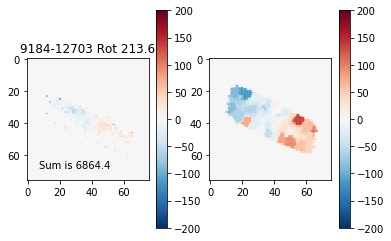

<Figure size 432x288 with 0 Axes>

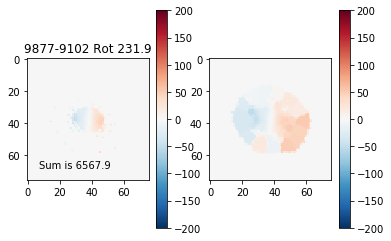

<Figure size 432x288 with 0 Axes>

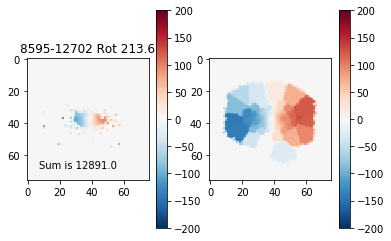

<Figure size 432x288 with 0 Axes>

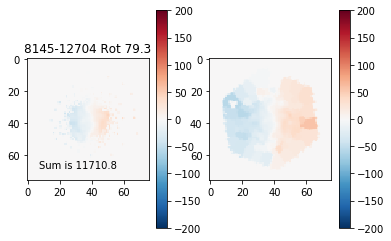

<Figure size 432x288 with 0 Axes>

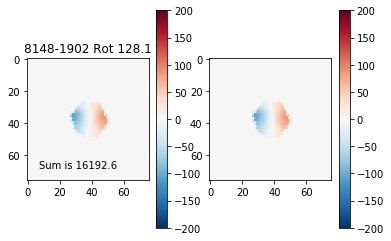

<Figure size 432x288 with 0 Axes>

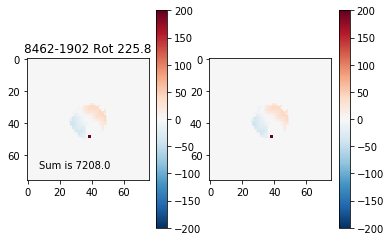

<Figure size 432x288 with 0 Axes>

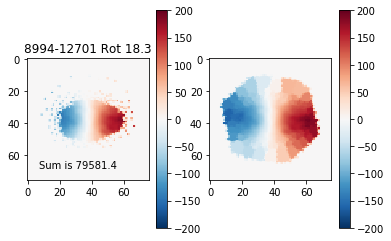

<Figure size 432x288 with 0 Axes>

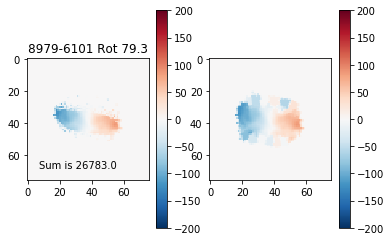

<Figure size 432x288 with 0 Axes>

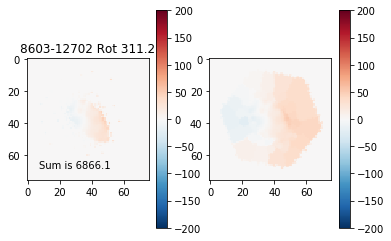

<Figure size 432x288 with 0 Axes>

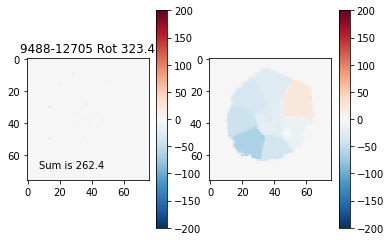

<Figure size 432x288 with 0 Axes>

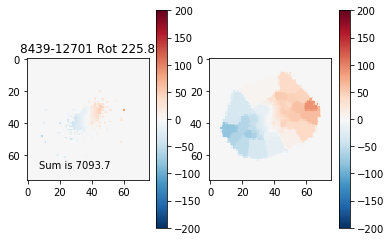

<Figure size 432x288 with 0 Axes>

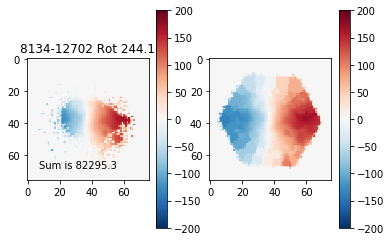

<Figure size 432x288 with 0 Axes>

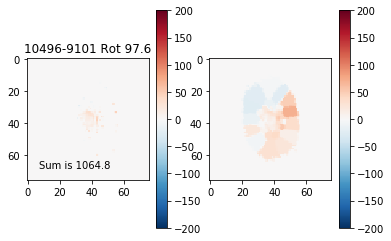

<Figure size 432x288 with 0 Axes>

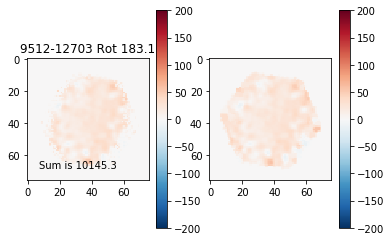

<Figure size 432x288 with 0 Axes>

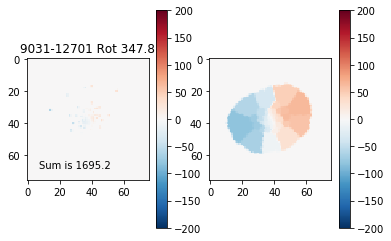

<Figure size 432x288 with 0 Axes>

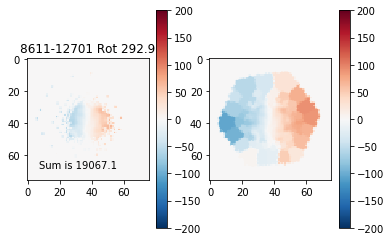

<Figure size 432x288 with 0 Axes>

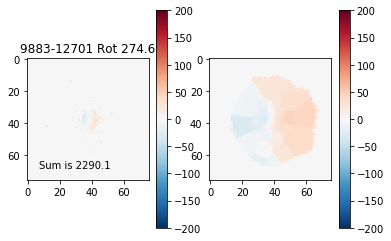

<Figure size 432x288 with 0 Axes>

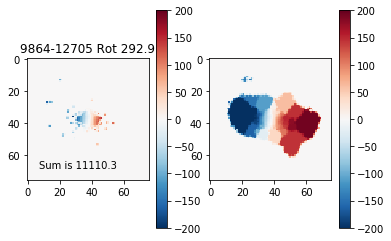

<Figure size 432x288 with 0 Axes>

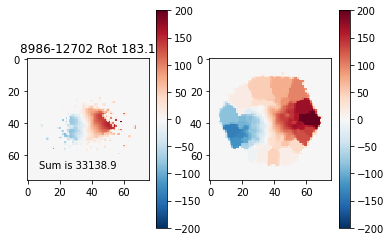

<Figure size 432x288 with 0 Axes>

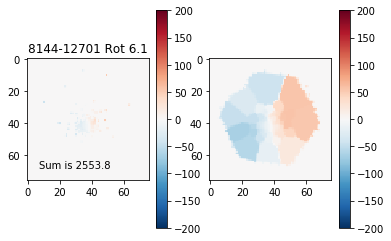

<Figure size 432x288 with 0 Axes>

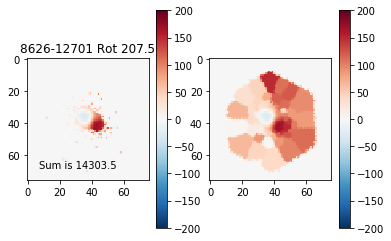

<Figure size 432x288 with 0 Axes>

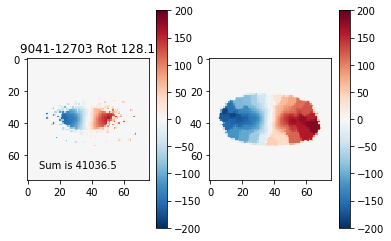

<Figure size 432x288 with 0 Axes>

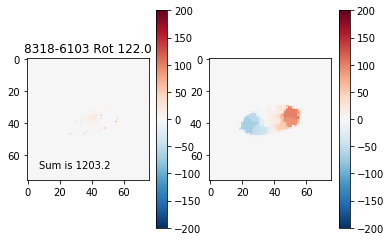

<Figure size 432x288 with 0 Axes>

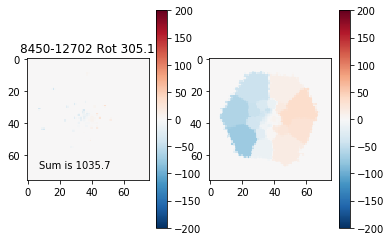

<Figure size 432x288 with 0 Axes>

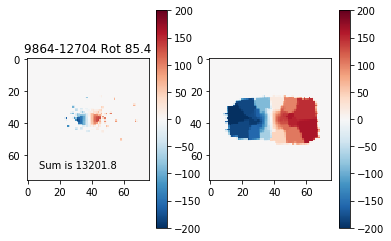

<Figure size 432x288 with 0 Axes>

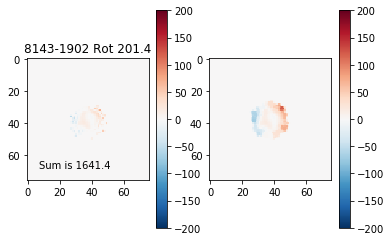

<Figure size 432x288 with 0 Axes>

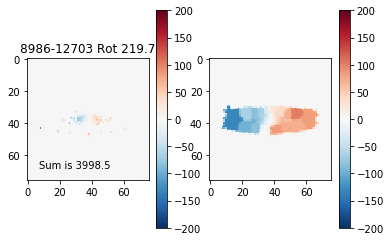

<Figure size 432x288 with 0 Axes>

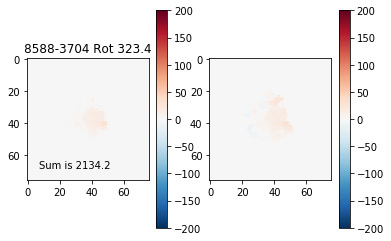

<Figure size 432x288 with 0 Axes>

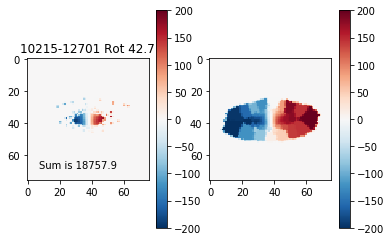

<Figure size 432x288 with 0 Axes>

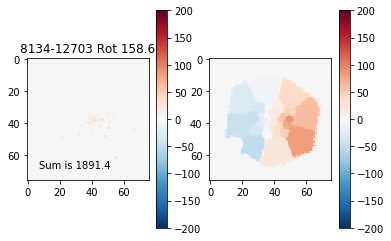

<Figure size 432x288 with 0 Axes>

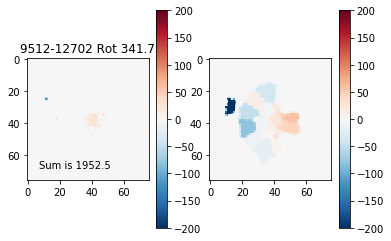

<Figure size 432x288 with 0 Axes>

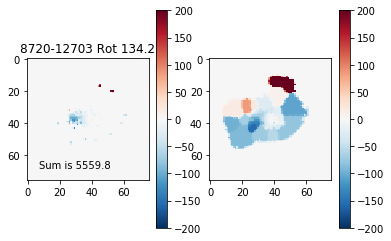

<Figure size 432x288 with 0 Axes>

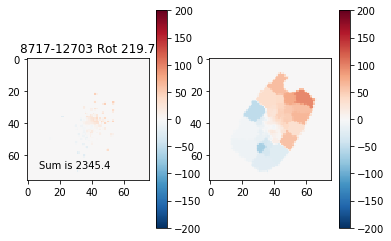

<Figure size 432x288 with 0 Axes>

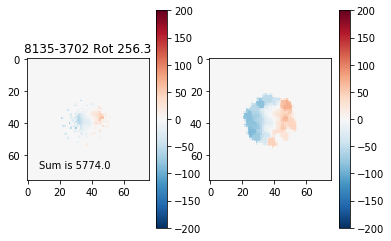

<Figure size 432x288 with 0 Axes>

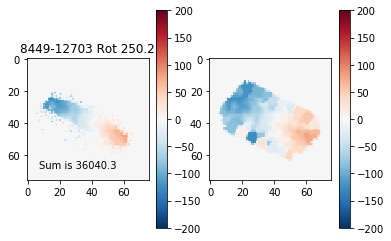

<Figure size 432x288 with 0 Axes>

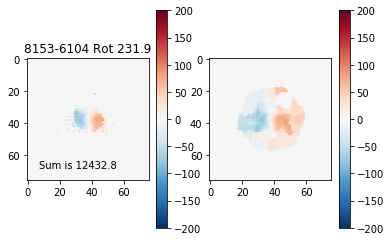

<Figure size 432x288 with 0 Axes>

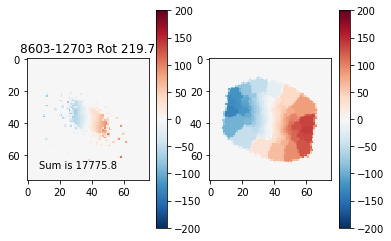

<Figure size 432x288 with 0 Axes>

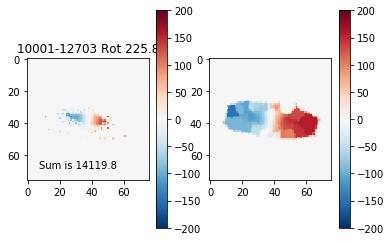

<Figure size 432x288 with 0 Axes>

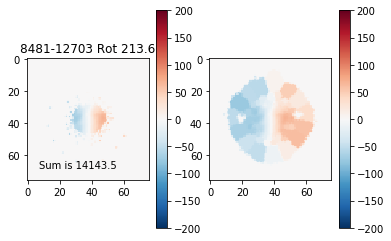

<Figure size 432x288 with 0 Axes>

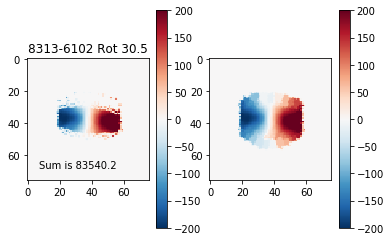

<Figure size 432x288 with 0 Axes>

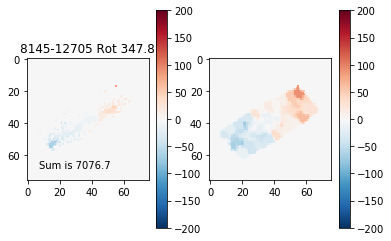

<Figure size 432x288 with 0 Axes>

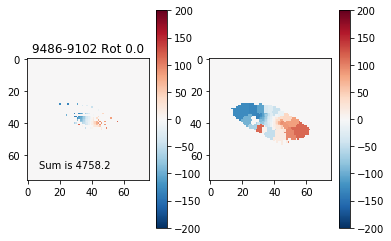

<Figure size 432x288 with 0 Axes>

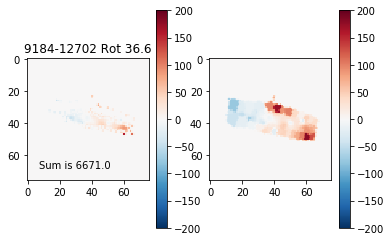

<Figure size 432x288 with 0 Axes>

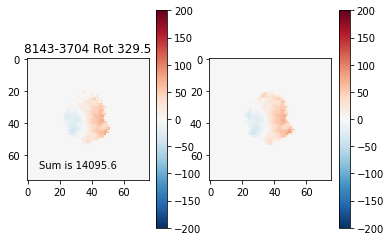

<Figure size 432x288 with 0 Axes>

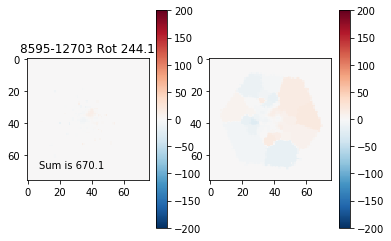

<Figure size 432x288 with 0 Axes>

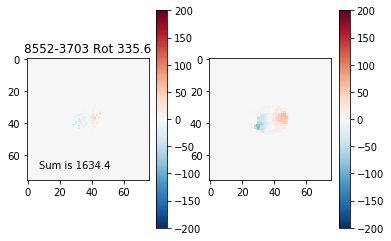

<Figure size 432x288 with 0 Axes>

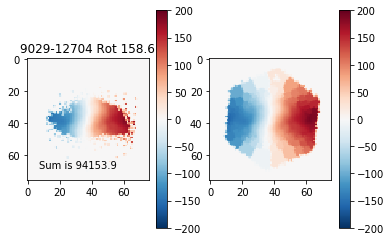

<Figure size 432x288 with 0 Axes>

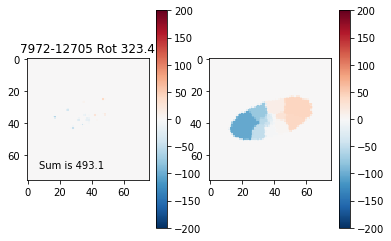

<Figure size 432x288 with 0 Axes>

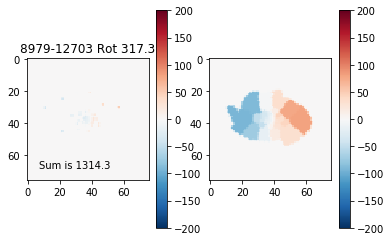

<Figure size 432x288 with 0 Axes>

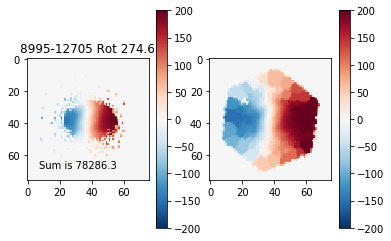

<Figure size 432x288 with 0 Axes>

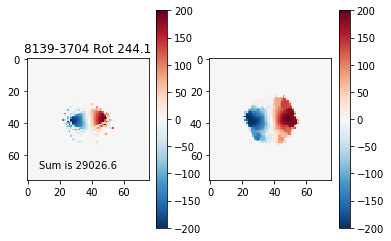

<Figure size 432x288 with 0 Axes>

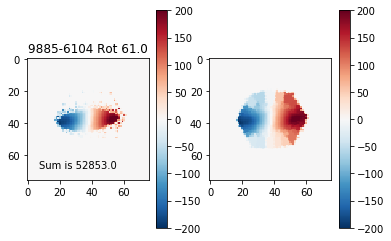

<Figure size 432x288 with 0 Axes>

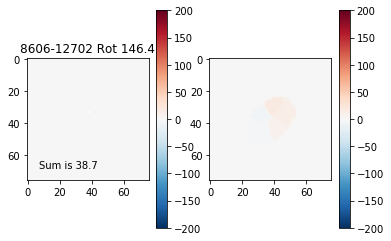

<Figure size 432x288 with 0 Axes>

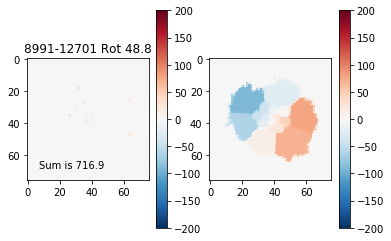

<Figure size 432x288 with 0 Axes>

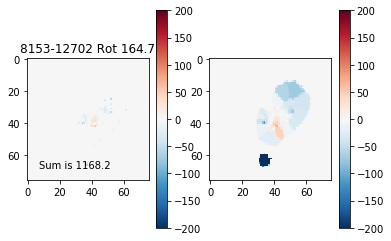

<Figure size 432x288 with 0 Axes>

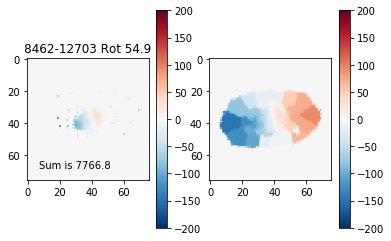

<Figure size 432x288 with 0 Axes>

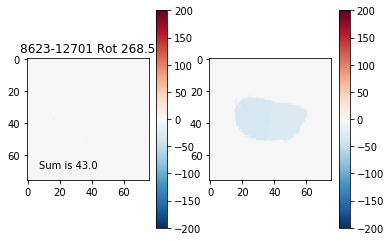

<Figure size 432x288 with 0 Axes>

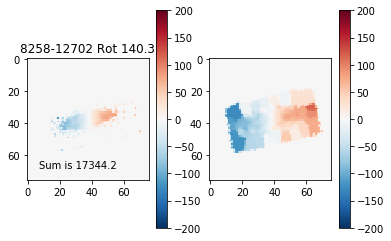

<Figure size 432x288 with 0 Axes>

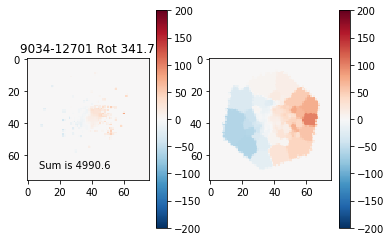

<Figure size 432x288 with 0 Axes>

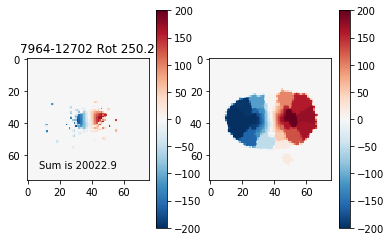

<Figure size 432x288 with 0 Axes>

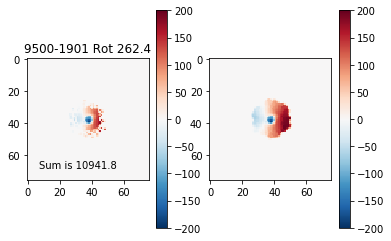

<Figure size 432x288 with 0 Axes>

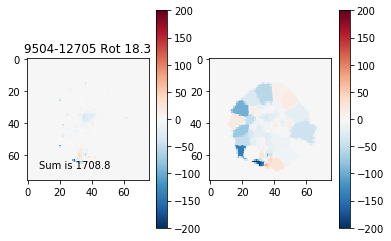

<Figure size 432x288 with 0 Axes>

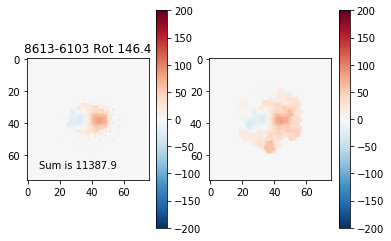

<Figure size 432x288 with 0 Axes>

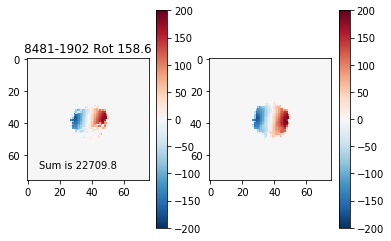

<Figure size 432x288 with 0 Axes>

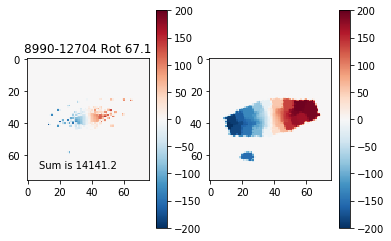

<Figure size 432x288 with 0 Axes>

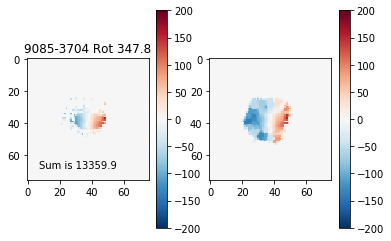

<Figure size 432x288 with 0 Axes>

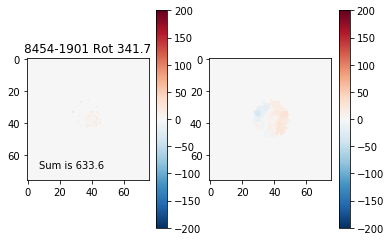

<Figure size 432x288 with 0 Axes>

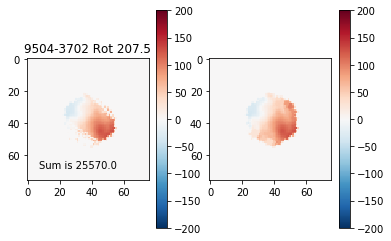

<Figure size 432x288 with 0 Axes>

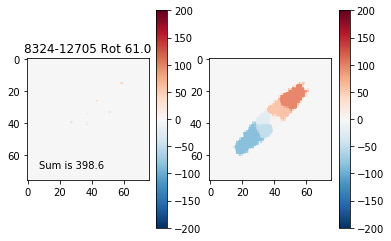

<Figure size 432x288 with 0 Axes>

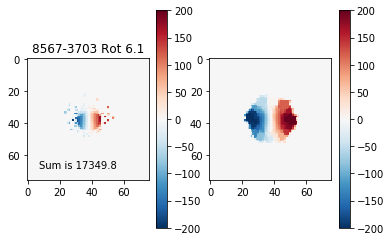

<Figure size 432x288 with 0 Axes>

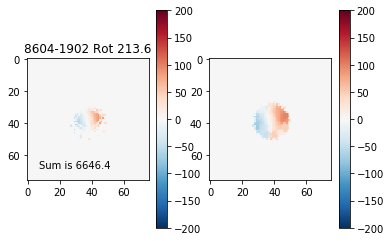

<Figure size 432x288 with 0 Axes>

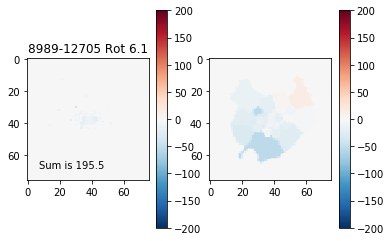

<Figure size 432x288 with 0 Axes>

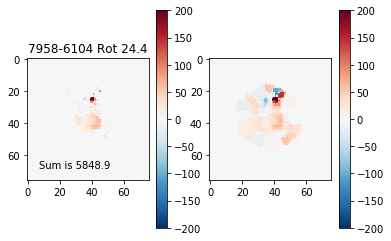

<Figure size 432x288 with 0 Axes>

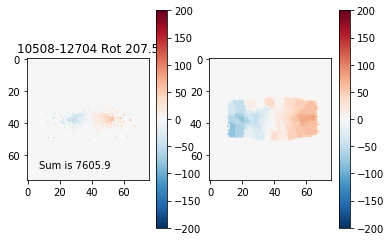

<Figure size 432x288 with 0 Axes>

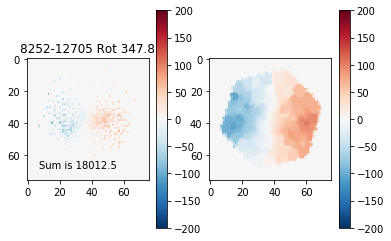

<Figure size 432x288 with 0 Axes>

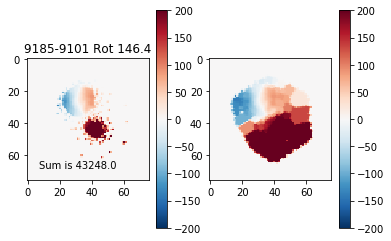

<Figure size 432x288 with 0 Axes>

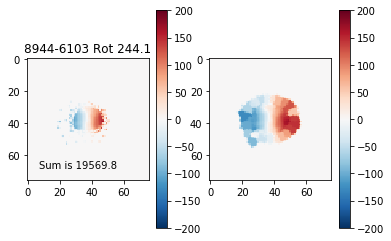

<Figure size 432x288 with 0 Axes>

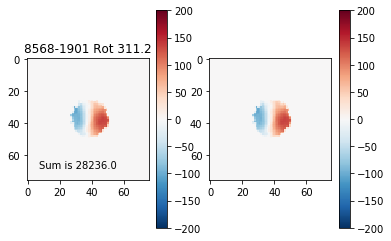

<Figure size 432x288 with 0 Axes>

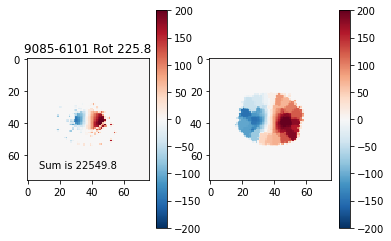

<Figure size 432x288 with 0 Axes>

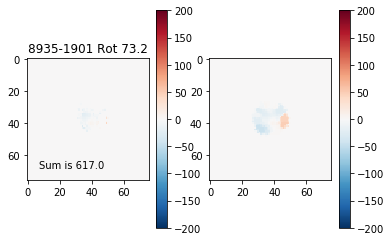

<Figure size 432x288 with 0 Axes>

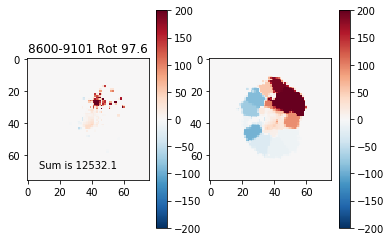

<Figure size 432x288 with 0 Axes>

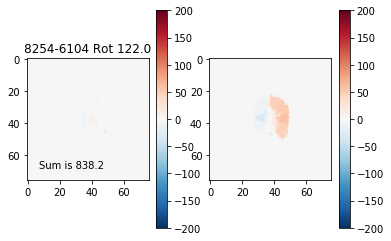

<Figure size 432x288 with 0 Axes>

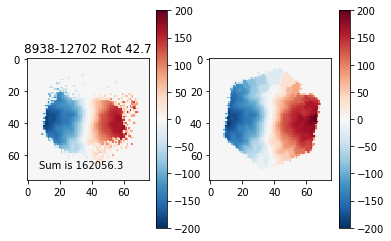

<Figure size 432x288 with 0 Axes>

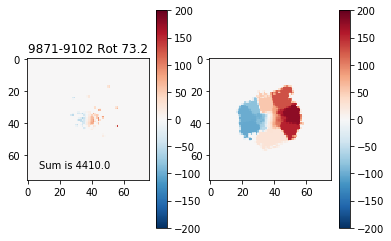

<Figure size 432x288 with 0 Axes>

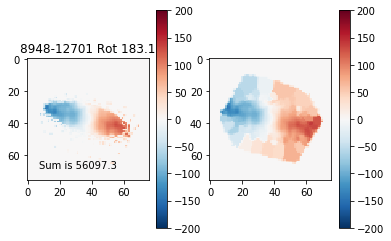

<Figure size 432x288 with 0 Axes>

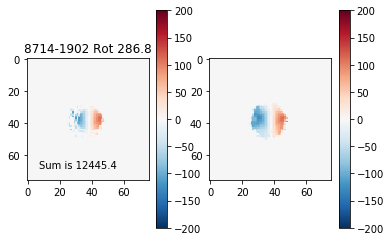

<Figure size 432x288 with 0 Axes>

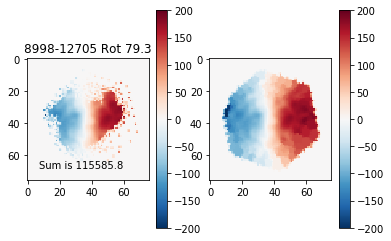

<Figure size 432x288 with 0 Axes>

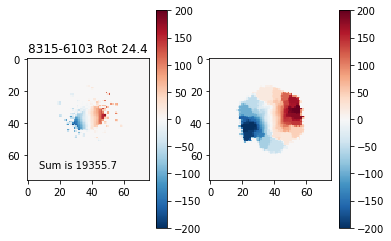

<Figure size 432x288 with 0 Axes>

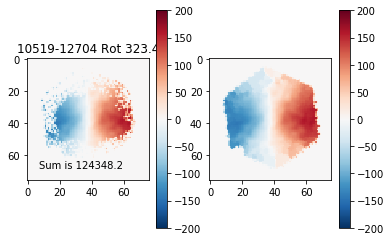

<Figure size 432x288 with 0 Axes>

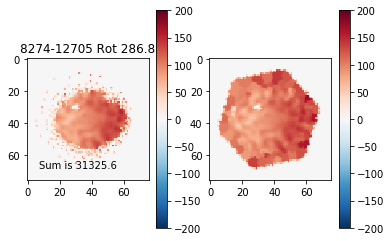

<Figure size 432x288 with 0 Axes>

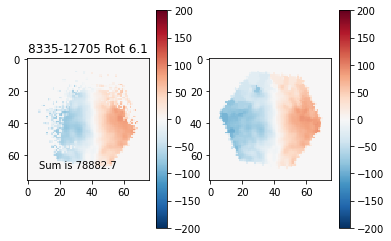

<Figure size 432x288 with 0 Axes>

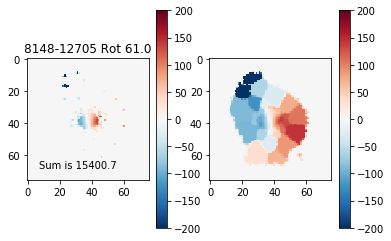

<Figure size 432x288 with 0 Axes>

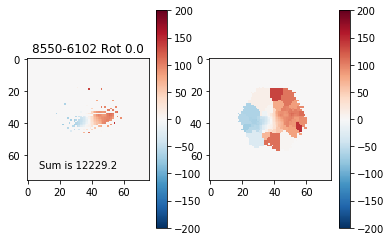

<Figure size 432x288 with 0 Axes>

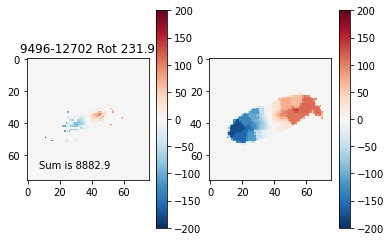

<Figure size 432x288 with 0 Axes>

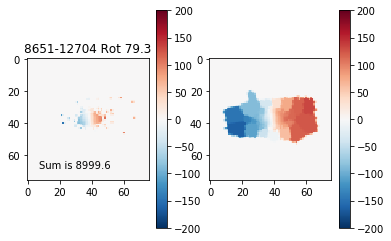

<Figure size 432x288 with 0 Axes>

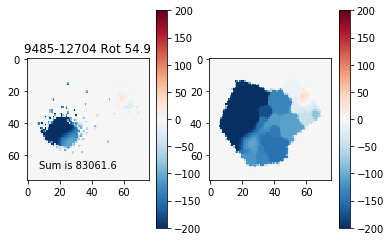

<Figure size 432x288 with 0 Axes>

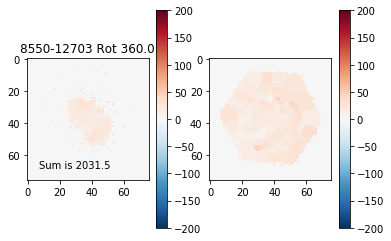

<Figure size 432x288 with 0 Axes>

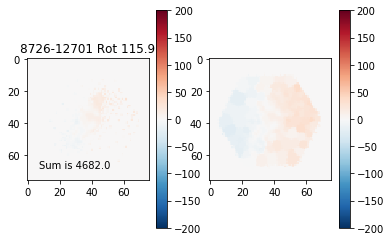

<Figure size 432x288 with 0 Axes>

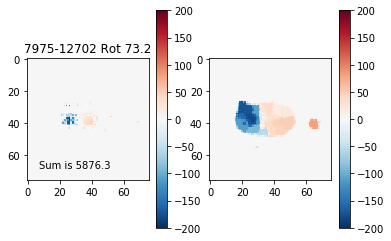

<Figure size 432x288 with 0 Axes>

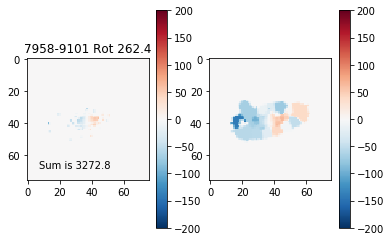

<Figure size 432x288 with 0 Axes>

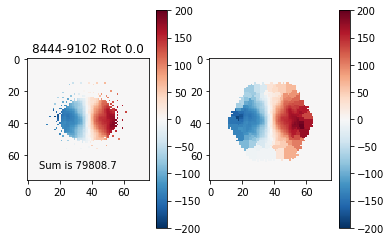

<Figure size 432x288 with 0 Axes>

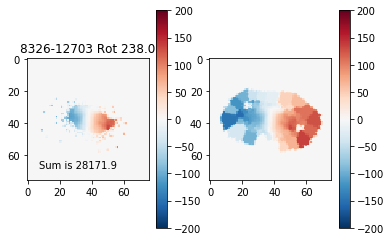

<Figure size 432x288 with 0 Axes>

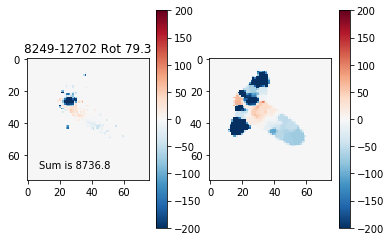

<Figure size 432x288 with 0 Axes>

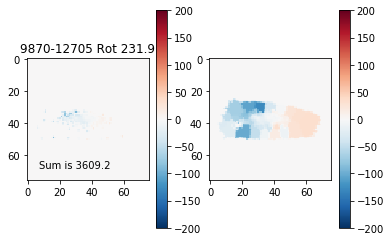

<Figure size 432x288 with 0 Axes>

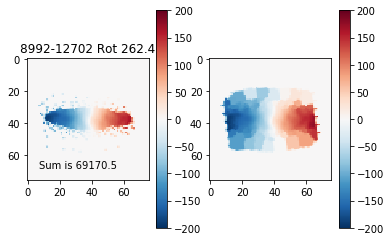

<Figure size 432x288 with 0 Axes>

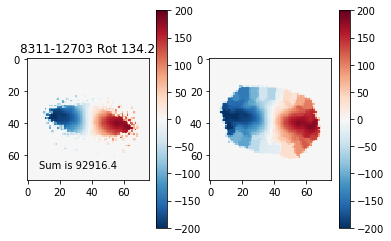

<Figure size 432x288 with 0 Axes>

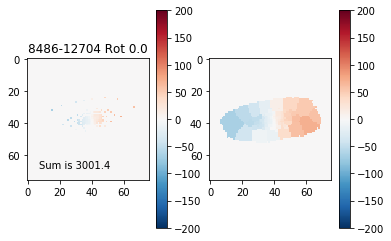

<Figure size 432x288 with 0 Axes>

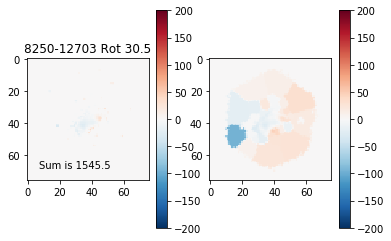

<Figure size 432x288 with 0 Axes>

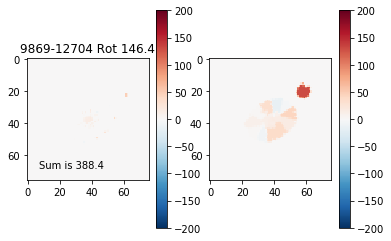

<Figure size 432x288 with 0 Axes>

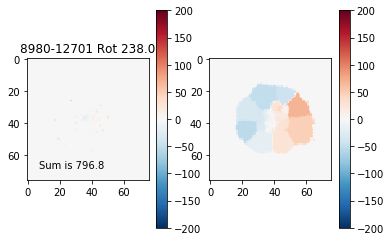

<Figure size 432x288 with 0 Axes>

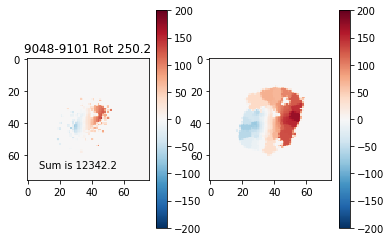

<Figure size 432x288 with 0 Axes>

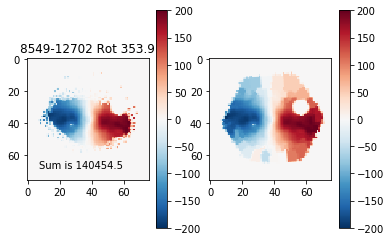

<Figure size 432x288 with 0 Axes>

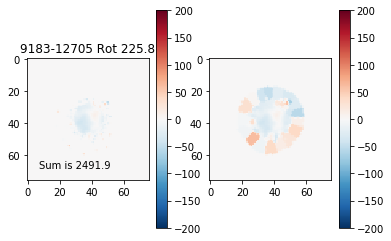

<Figure size 432x288 with 0 Axes>

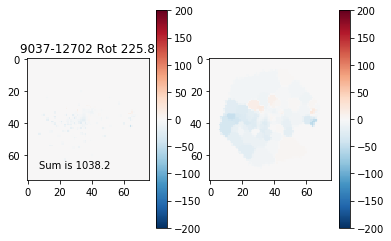

<Figure size 432x288 with 0 Axes>

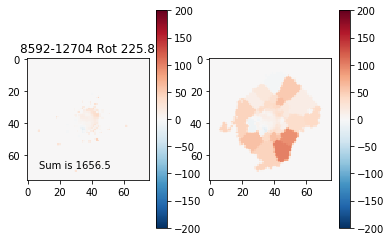

<Figure size 432x288 with 0 Axes>

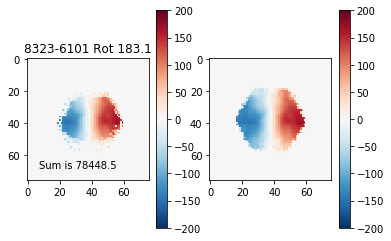

<Figure size 432x288 with 0 Axes>

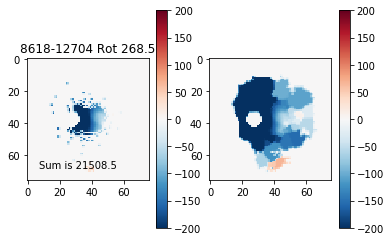

<Figure size 432x288 with 0 Axes>

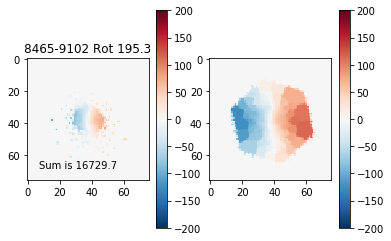

<Figure size 432x288 with 0 Axes>

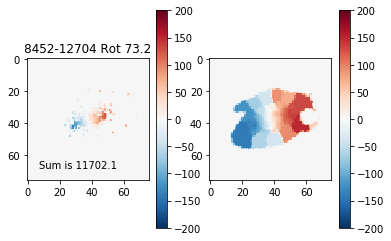

<Figure size 432x288 with 0 Axes>

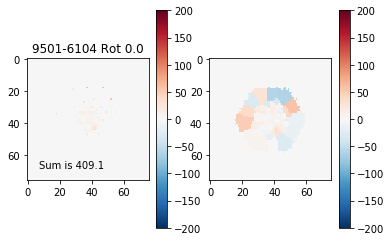

<Figure size 432x288 with 0 Axes>

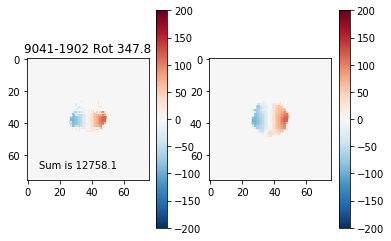

<Figure size 432x288 with 0 Axes>

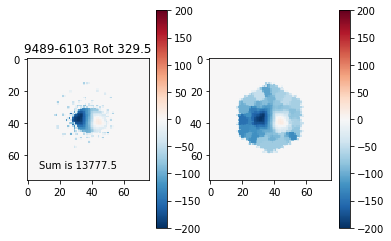

<Figure size 432x288 with 0 Axes>

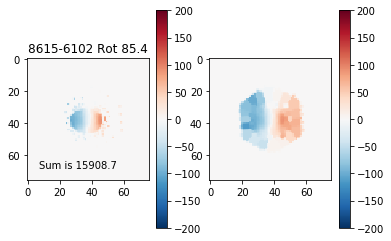

<Figure size 432x288 with 0 Axes>

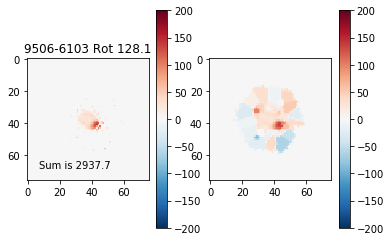

<Figure size 432x288 with 0 Axes>

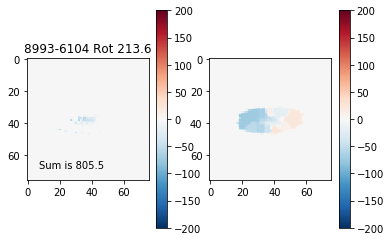

<Figure size 432x288 with 0 Axes>

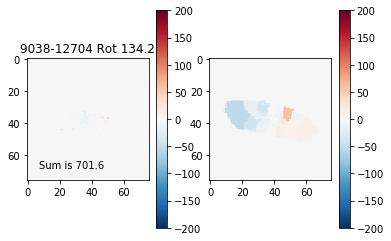

<Figure size 432x288 with 0 Axes>

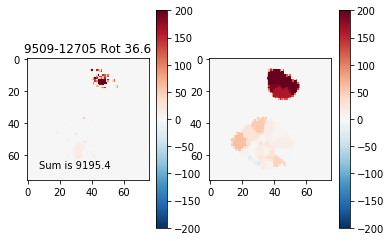

<Figure size 432x288 with 0 Axes>

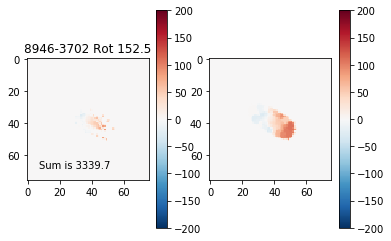

<Figure size 432x288 with 0 Axes>

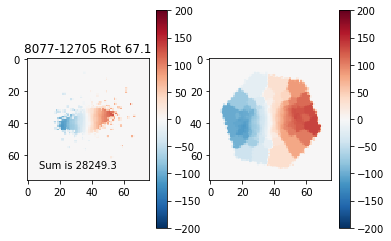

<Figure size 432x288 with 0 Axes>

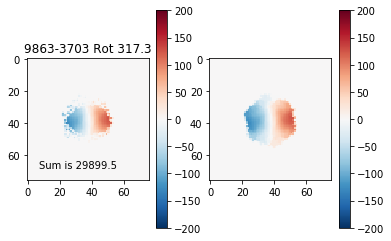

<Figure size 432x288 with 0 Axes>

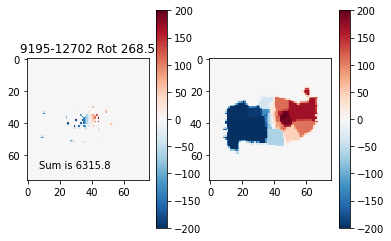

<Figure size 432x288 with 0 Axes>

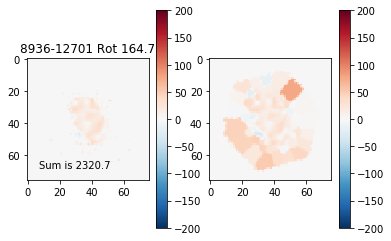

<Figure size 432x288 with 0 Axes>

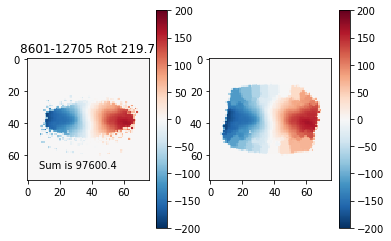

<Figure size 432x288 with 0 Axes>

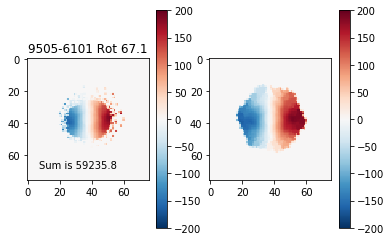

<Figure size 432x288 with 0 Axes>

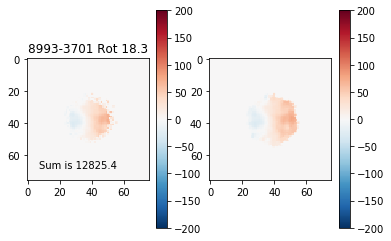

<Figure size 432x288 with 0 Axes>

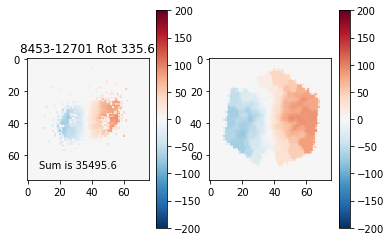

<Figure size 432x288 with 0 Axes>

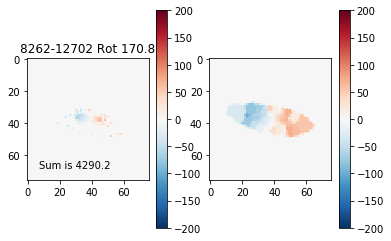

<Figure size 432x288 with 0 Axes>

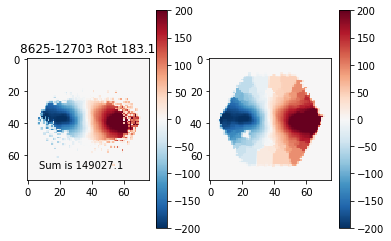

<Figure size 432x288 with 0 Axes>

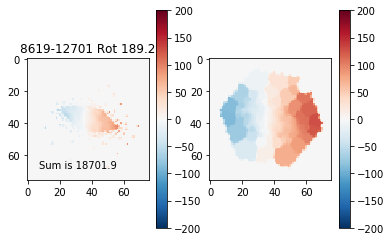

<Figure size 432x288 with 0 Axes>

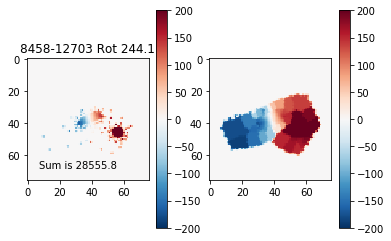

<Figure size 432x288 with 0 Axes>

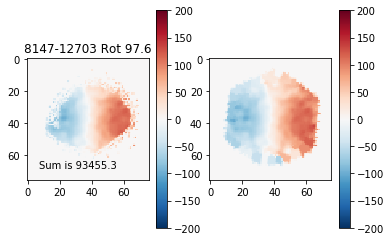

<Figure size 432x288 with 0 Axes>

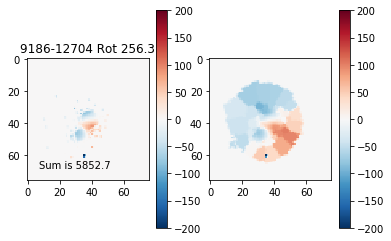

<Figure size 432x288 with 0 Axes>

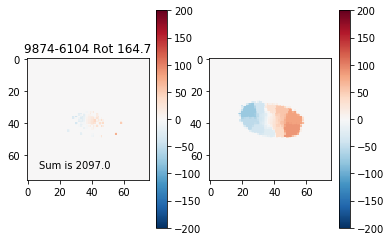

<Figure size 432x288 with 0 Axes>

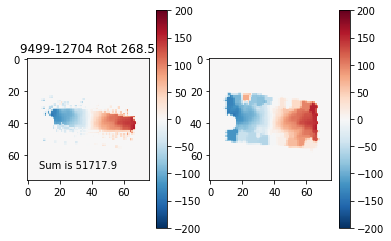

<Figure size 432x288 with 0 Axes>

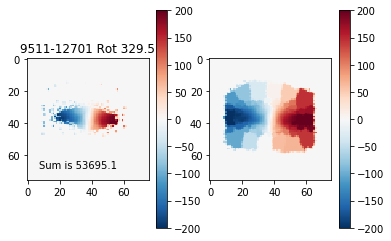

<Figure size 432x288 with 0 Axes>

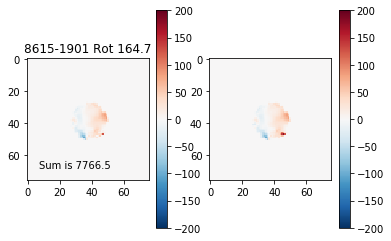

<Figure size 432x288 with 0 Axes>

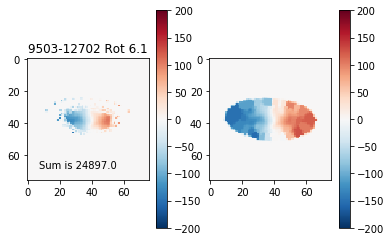

<Figure size 432x288 with 0 Axes>

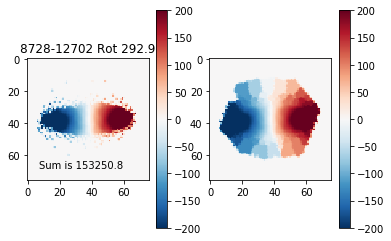

<Figure size 432x288 with 0 Axes>

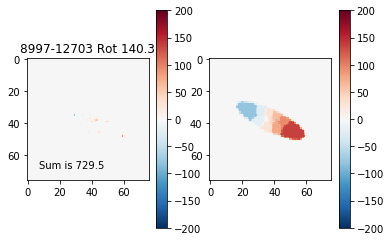

<Figure size 432x288 with 0 Axes>

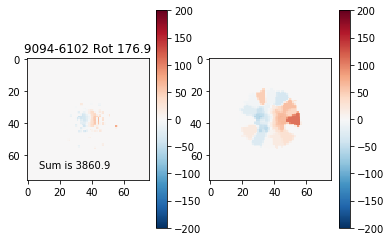

<Figure size 432x288 with 0 Axes>

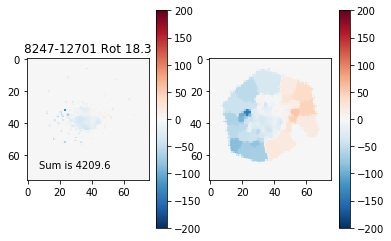

<Figure size 432x288 with 0 Axes>

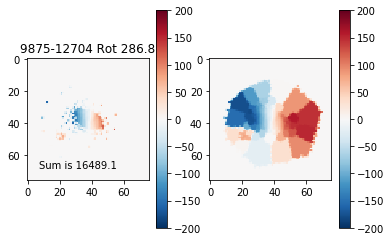

<Figure size 432x288 with 0 Axes>

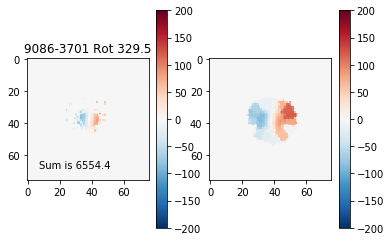

<Figure size 432x288 with 0 Axes>

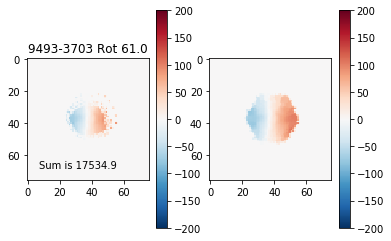

<Figure size 432x288 with 0 Axes>

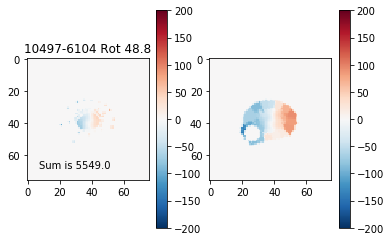

<Figure size 432x288 with 0 Axes>

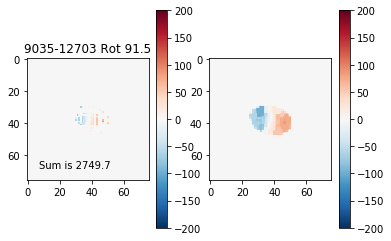

<Figure size 432x288 with 0 Axes>

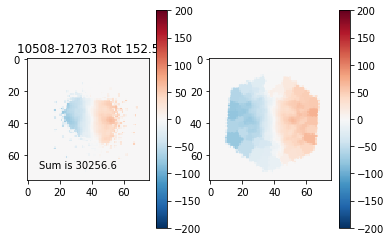

<Figure size 432x288 with 0 Axes>

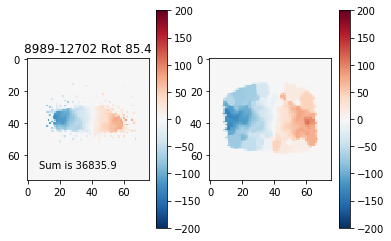

<Figure size 432x288 with 0 Axes>

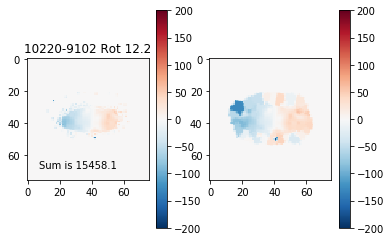

<Figure size 432x288 with 0 Axes>

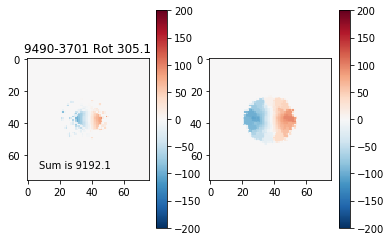

<Figure size 432x288 with 0 Axes>

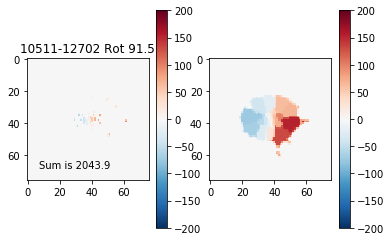

<Figure size 432x288 with 0 Axes>

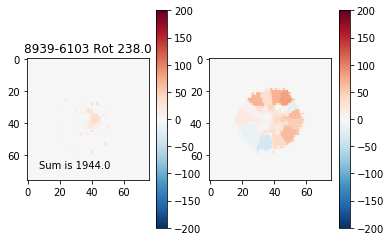

<Figure size 432x288 with 0 Axes>

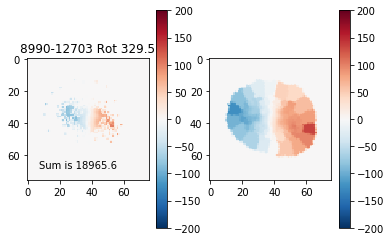

<Figure size 432x288 with 0 Axes>

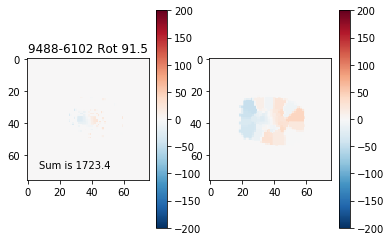

<Figure size 432x288 with 0 Axes>

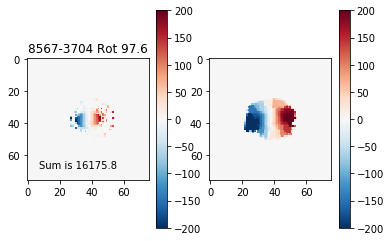

<Figure size 432x288 with 0 Axes>

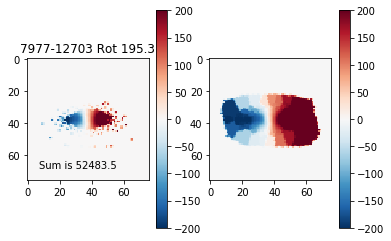

<Figure size 432x288 with 0 Axes>

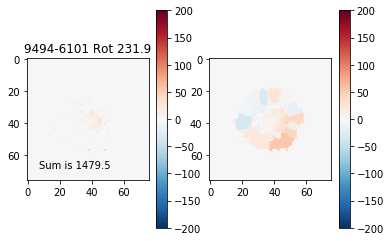

<Figure size 432x288 with 0 Axes>

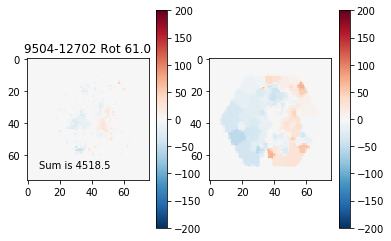

<Figure size 432x288 with 0 Axes>

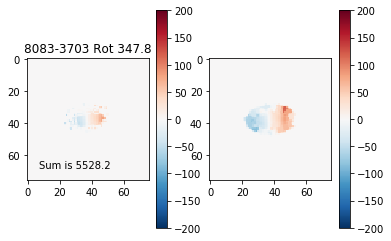

<Figure size 432x288 with 0 Axes>

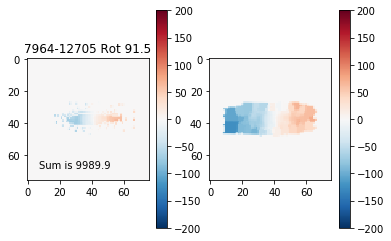

<Figure size 432x288 with 0 Axes>

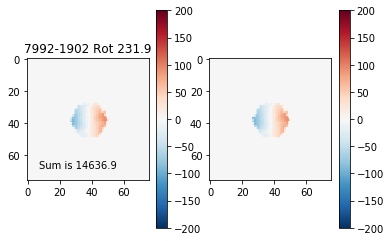

<Figure size 432x288 with 0 Axes>

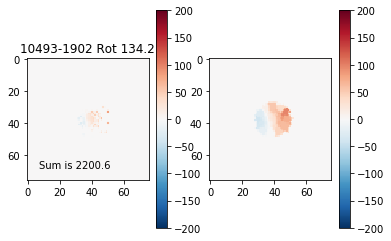

<Figure size 432x288 with 0 Axes>

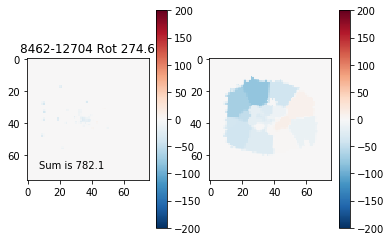

<Figure size 432x288 with 0 Axes>

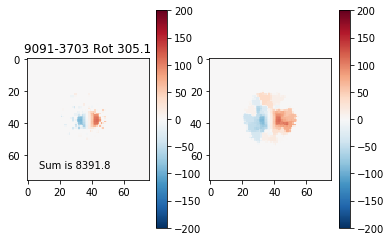

<Figure size 432x288 with 0 Axes>

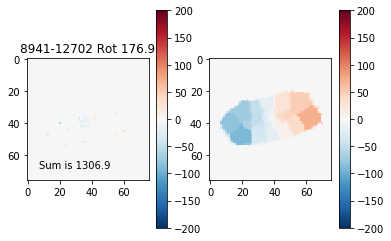

<Figure size 432x288 with 0 Axes>

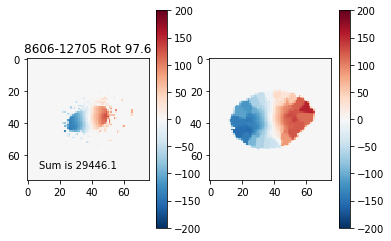

<Figure size 432x288 with 0 Axes>

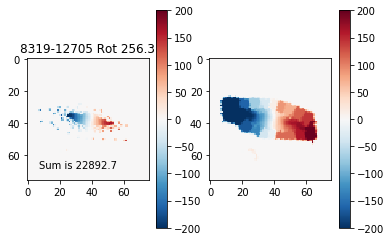

<Figure size 432x288 with 0 Axes>

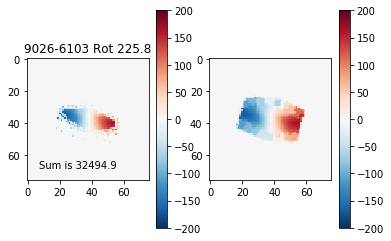

<Figure size 432x288 with 0 Axes>

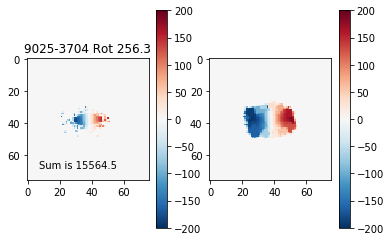

<Figure size 432x288 with 0 Axes>

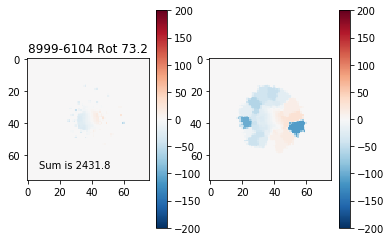

<Figure size 432x288 with 0 Axes>

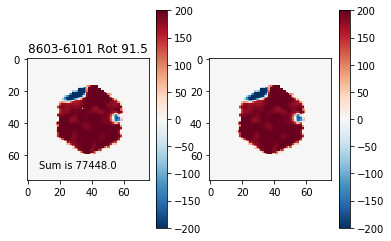

<Figure size 432x288 with 0 Axes>

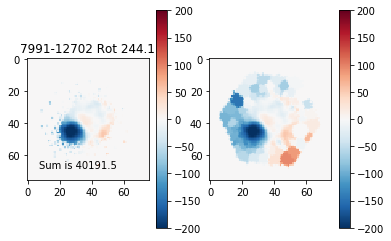

<Figure size 432x288 with 0 Axes>

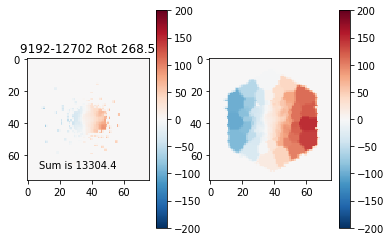

<Figure size 432x288 with 0 Axes>

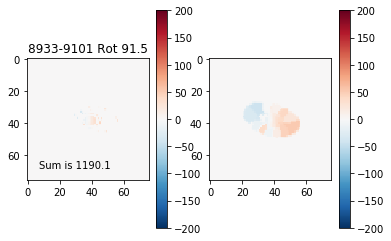

<Figure size 432x288 with 0 Axes>

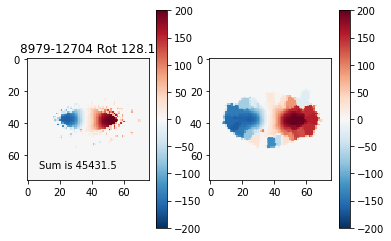

<Figure size 432x288 with 0 Axes>

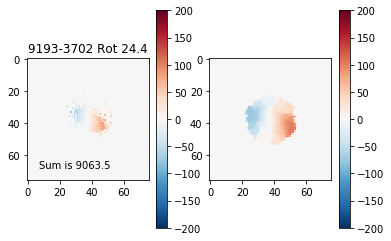

<Figure size 432x288 with 0 Axes>

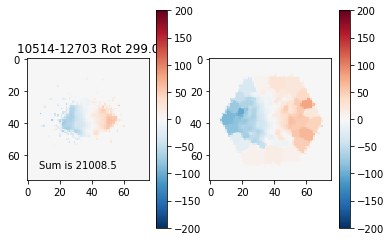

<Figure size 432x288 with 0 Axes>

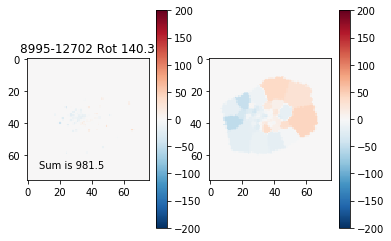

<Figure size 432x288 with 0 Axes>

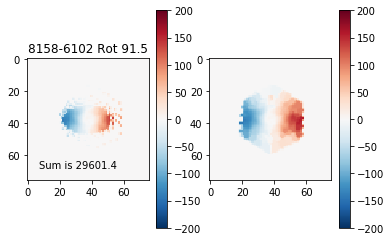

<Figure size 432x288 with 0 Axes>

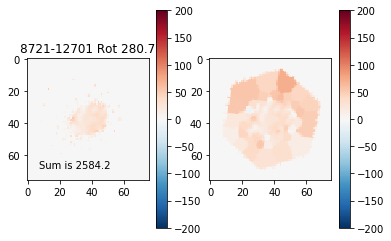

<Figure size 432x288 with 0 Axes>

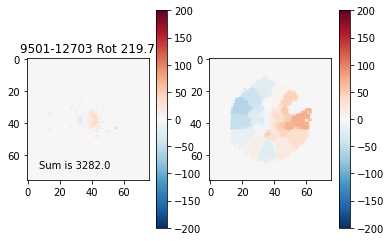

<Figure size 432x288 with 0 Axes>

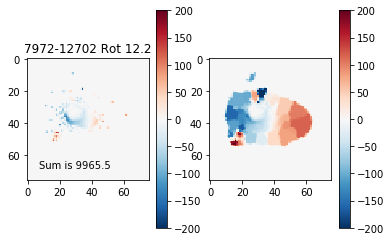

<Figure size 432x288 with 0 Axes>

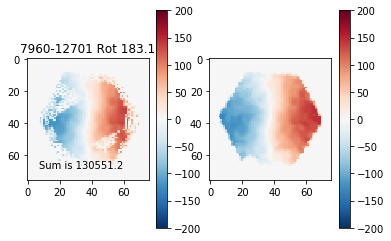

<Figure size 432x288 with 0 Axes>

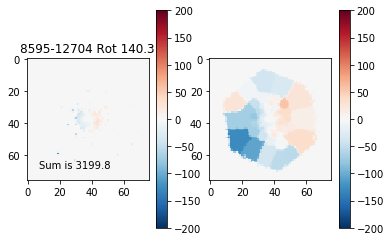

<Figure size 432x288 with 0 Axes>

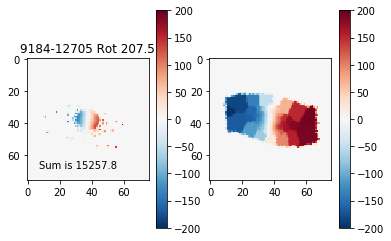

<Figure size 432x288 with 0 Axes>

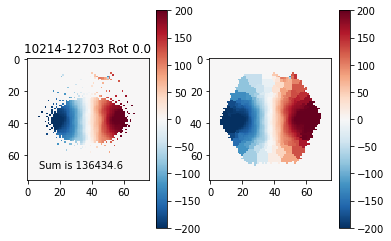

<Figure size 432x288 with 0 Axes>

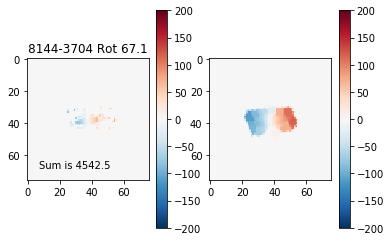

<Figure size 432x288 with 0 Axes>

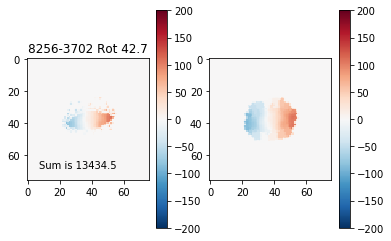

<Figure size 432x288 with 0 Axes>

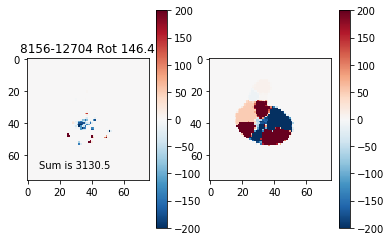

<Figure size 432x288 with 0 Axes>

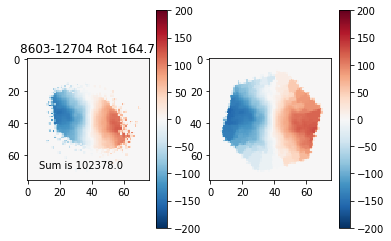

<Figure size 432x288 with 0 Axes>

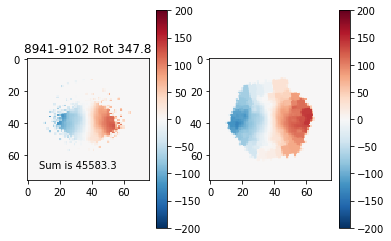

<Figure size 432x288 with 0 Axes>

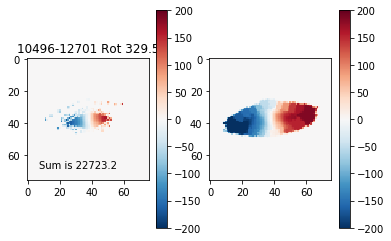

<Figure size 432x288 with 0 Axes>

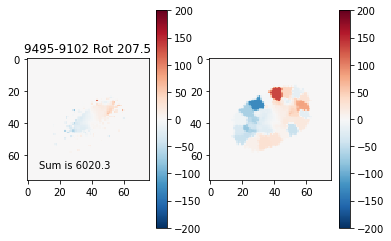

<Figure size 432x288 with 0 Axes>

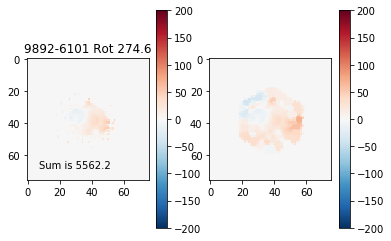

<Figure size 432x288 with 0 Axes>

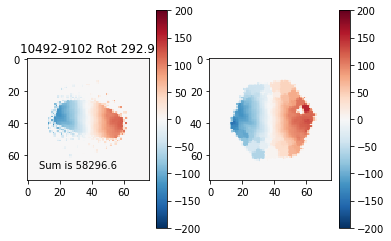

<Figure size 432x288 with 0 Axes>

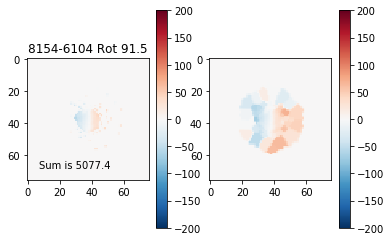

<Figure size 432x288 with 0 Axes>

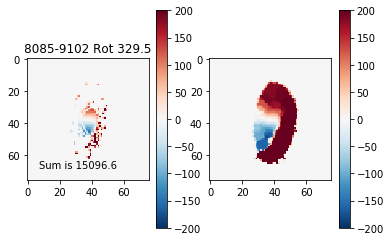

<Figure size 432x288 with 0 Axes>

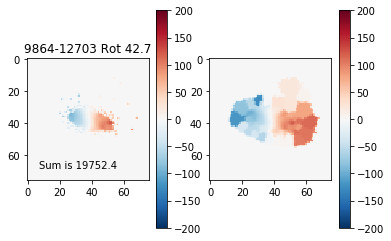

<Figure size 432x288 with 0 Axes>

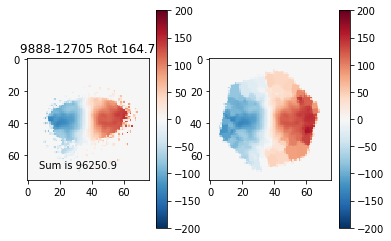

<Figure size 432x288 with 0 Axes>

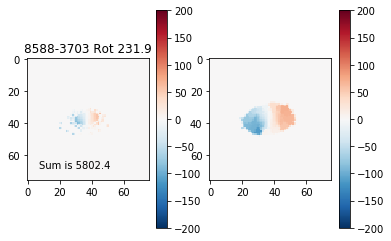

<Figure size 432x288 with 0 Axes>

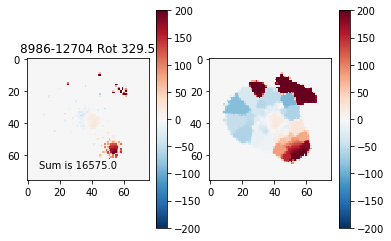

<Figure size 432x288 with 0 Axes>

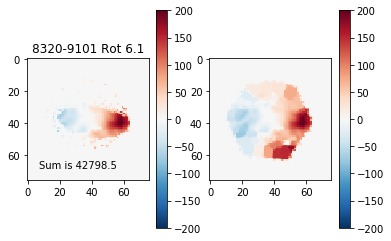

<Figure size 432x288 with 0 Axes>

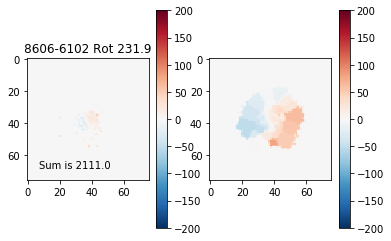

<Figure size 432x288 with 0 Axes>

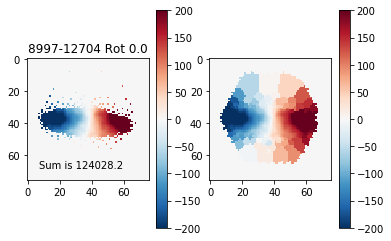

<Figure size 432x288 with 0 Axes>

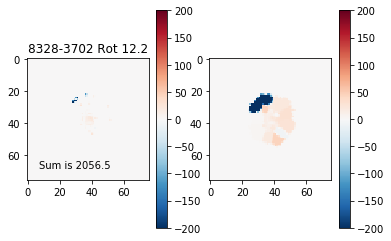

<Figure size 432x288 with 0 Axes>

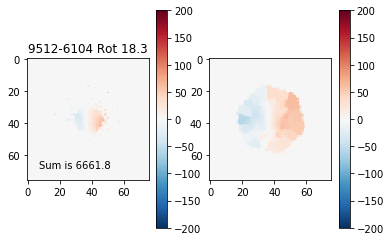

<Figure size 432x288 with 0 Axes>

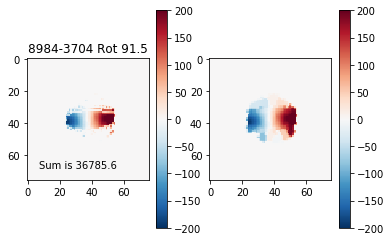

<Figure size 432x288 with 0 Axes>

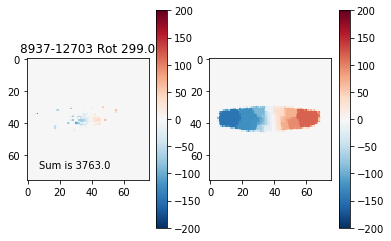

<Figure size 432x288 with 0 Axes>

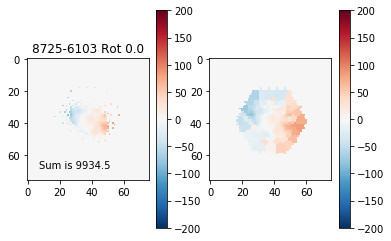

<Figure size 432x288 with 0 Axes>

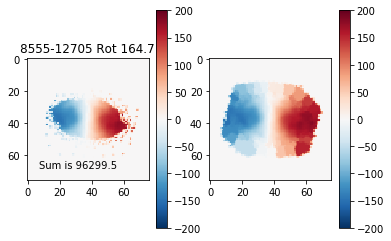

<Figure size 432x288 with 0 Axes>

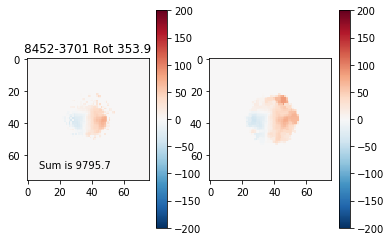

<Figure size 432x288 with 0 Axes>

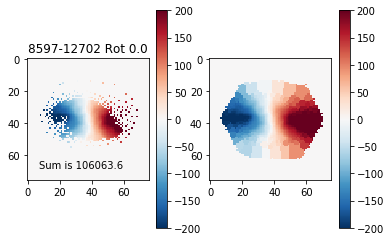

<Figure size 432x288 with 0 Axes>

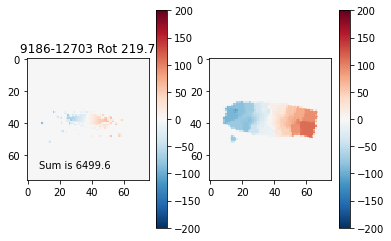

<Figure size 432x288 with 0 Axes>

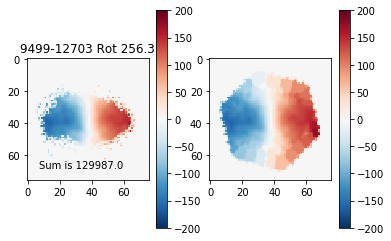

<Figure size 432x288 with 0 Axes>

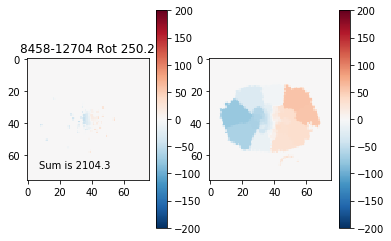

<Figure size 432x288 with 0 Axes>

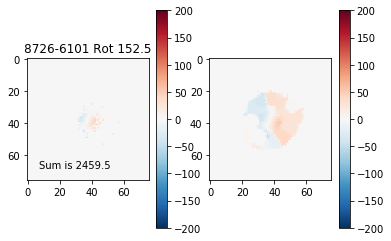

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

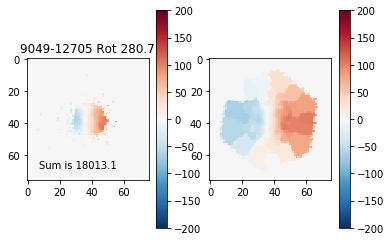

<Figure size 432x288 with 0 Axes>

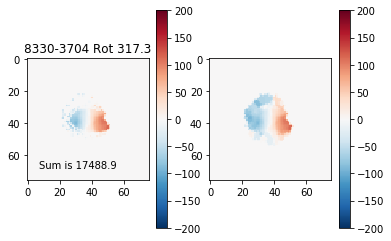

<Figure size 432x288 with 0 Axes>

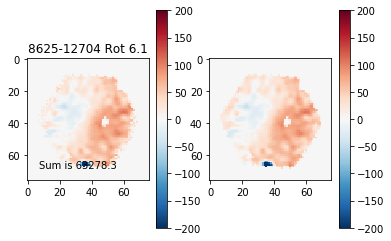

<Figure size 432x288 with 0 Axes>

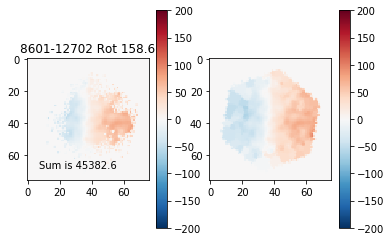

<Figure size 432x288 with 0 Axes>

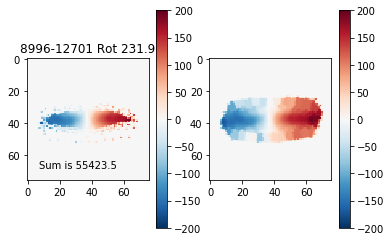

<Figure size 432x288 with 0 Axes>

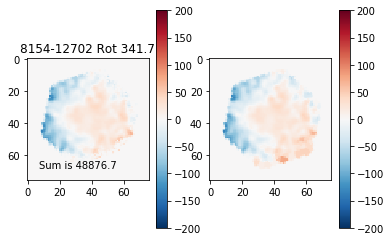

<Figure size 432x288 with 0 Axes>

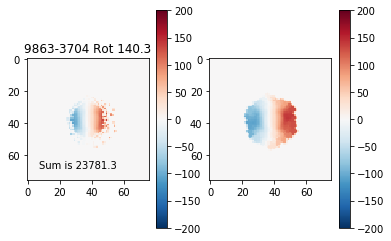

<Figure size 432x288 with 0 Axes>

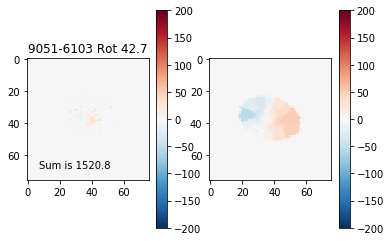

<Figure size 432x288 with 0 Axes>

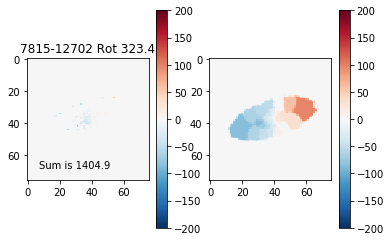

<Figure size 432x288 with 0 Axes>

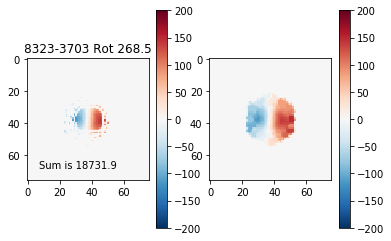

<Figure size 432x288 with 0 Axes>

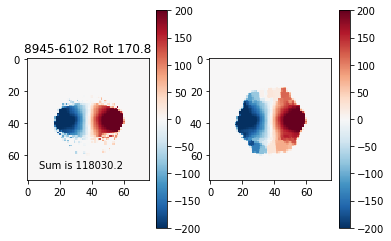

<Figure size 432x288 with 0 Axes>

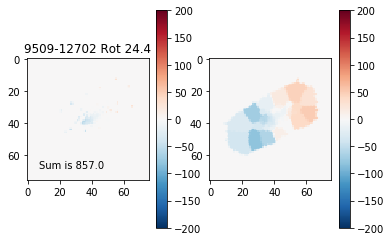

<Figure size 432x288 with 0 Axes>

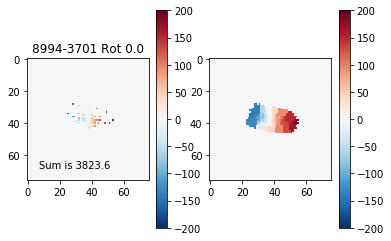

<Figure size 432x288 with 0 Axes>

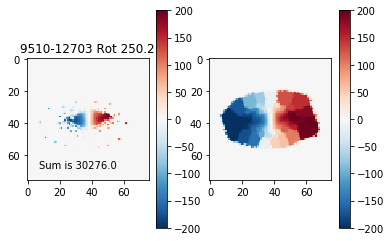

<Figure size 432x288 with 0 Axes>

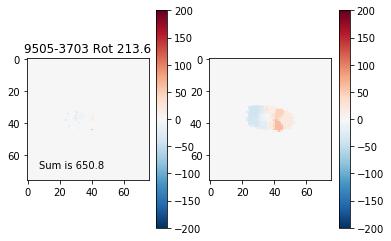

<Figure size 432x288 with 0 Axes>

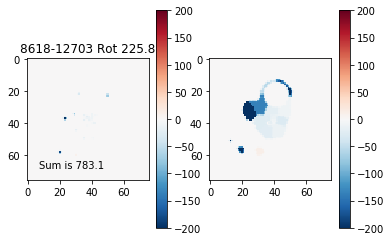

<Figure size 432x288 with 0 Axes>

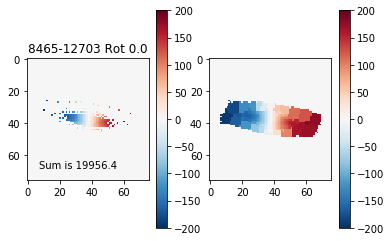

<Figure size 432x288 with 0 Axes>

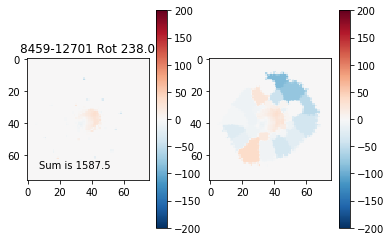

<Figure size 432x288 with 0 Axes>

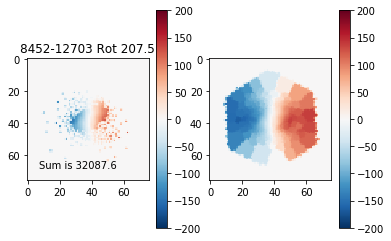

<Figure size 432x288 with 0 Axes>

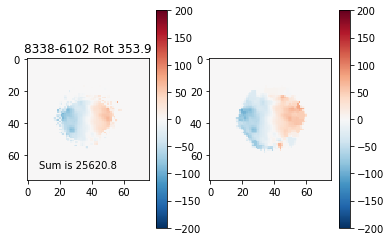

<Figure size 432x288 with 0 Axes>

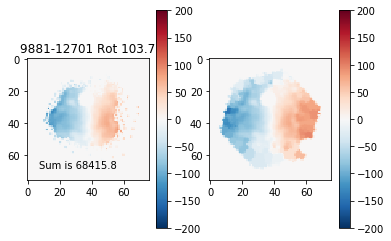

<Figure size 432x288 with 0 Axes>

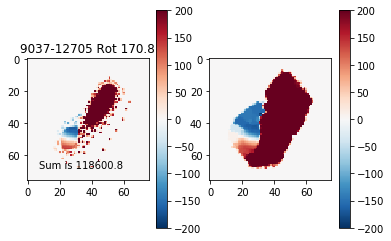

<Figure size 432x288 with 0 Axes>

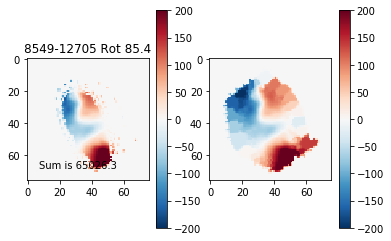

<Figure size 432x288 with 0 Axes>

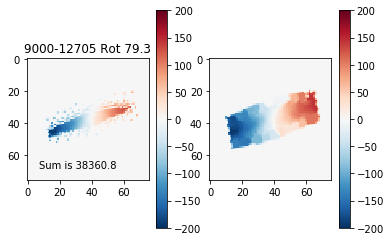

<Figure size 432x288 with 0 Axes>

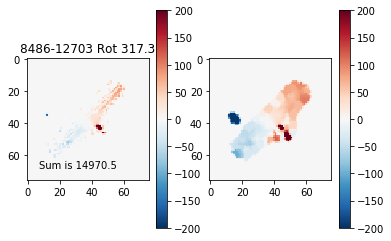

<Figure size 432x288 with 0 Axes>

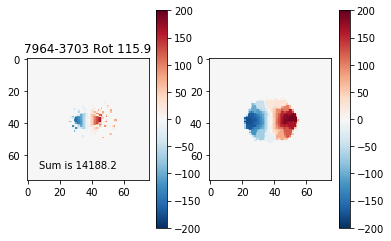

<Figure size 432x288 with 0 Axes>

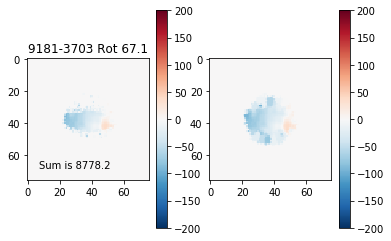

<Figure size 432x288 with 0 Axes>

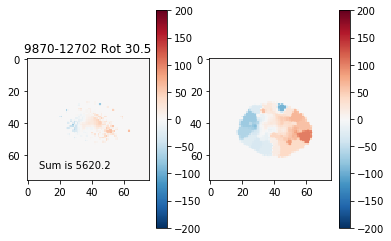

<Figure size 432x288 with 0 Axes>

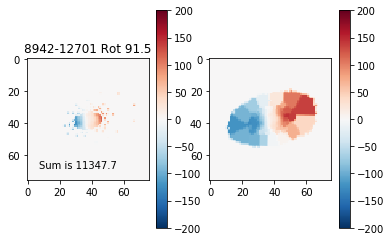

<Figure size 432x288 with 0 Axes>

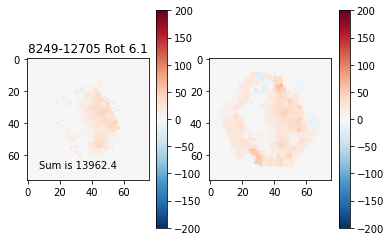

<Figure size 432x288 with 0 Axes>

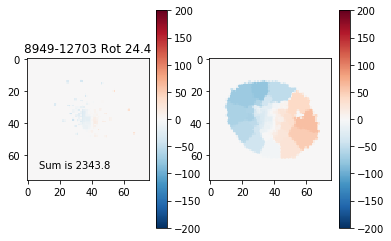

<Figure size 432x288 with 0 Axes>

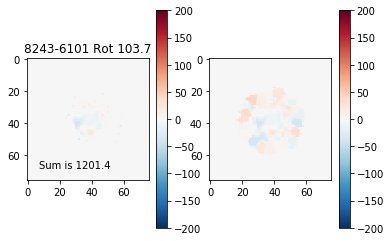

<Figure size 432x288 with 0 Axes>

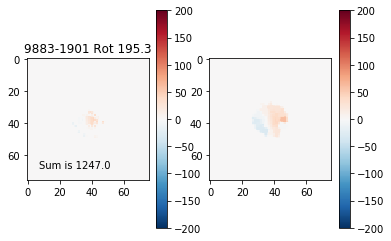

<Figure size 432x288 with 0 Axes>

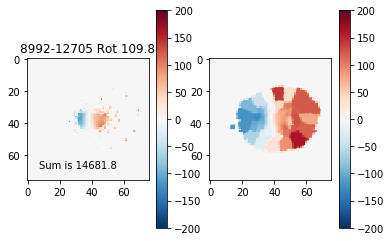

<Figure size 432x288 with 0 Axes>

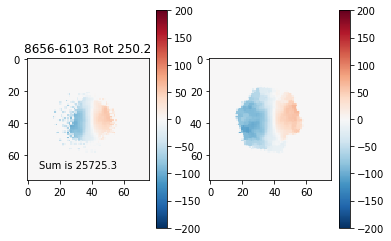

<Figure size 432x288 with 0 Axes>

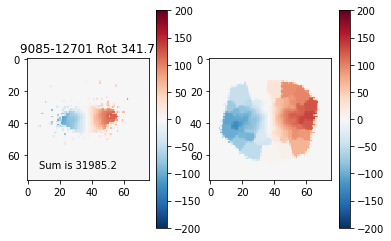

<Figure size 432x288 with 0 Axes>

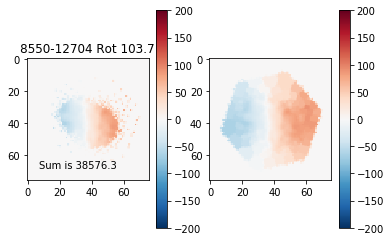

<Figure size 432x288 with 0 Axes>

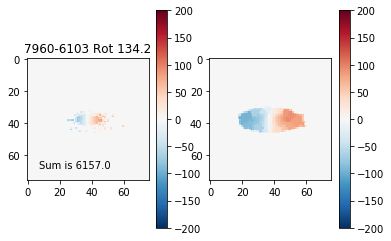

<Figure size 432x288 with 0 Axes>

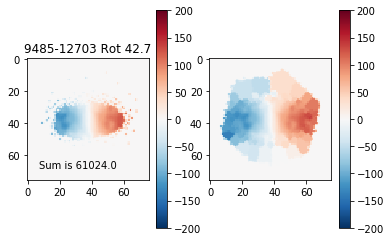

<Figure size 432x288 with 0 Axes>

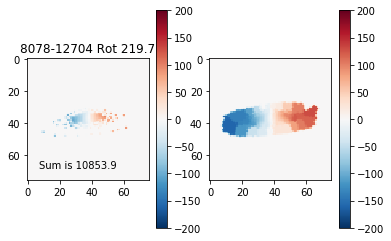

<Figure size 432x288 with 0 Axes>

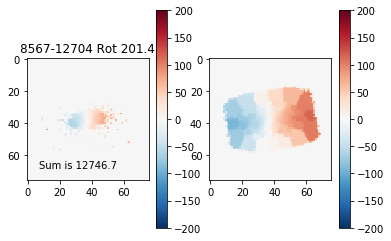

<Figure size 432x288 with 0 Axes>

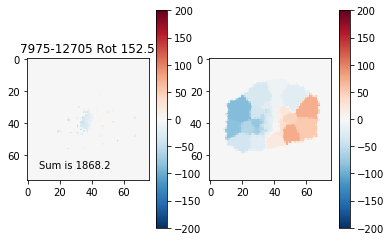

<Figure size 432x288 with 0 Axes>

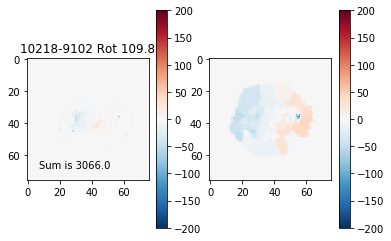

<Figure size 432x288 with 0 Axes>

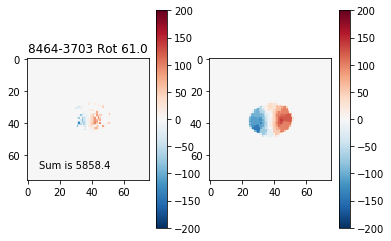

<Figure size 432x288 with 0 Axes>

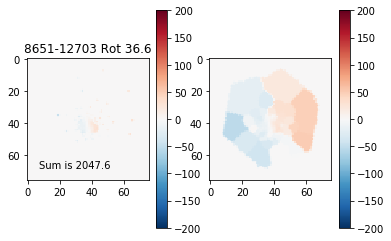

<Figure size 432x288 with 0 Axes>

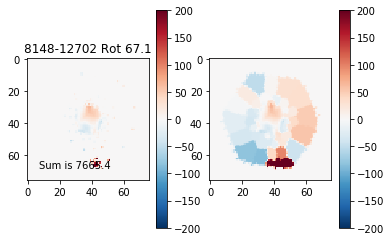

<Figure size 432x288 with 0 Axes>

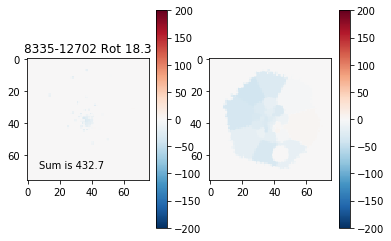

<Figure size 432x288 with 0 Axes>

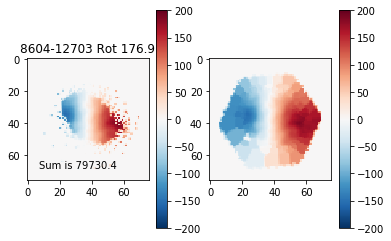

<Figure size 432x288 with 0 Axes>

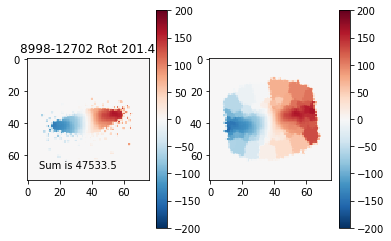

<Figure size 432x288 with 0 Axes>

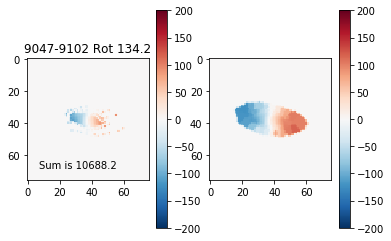

<Figure size 432x288 with 0 Axes>

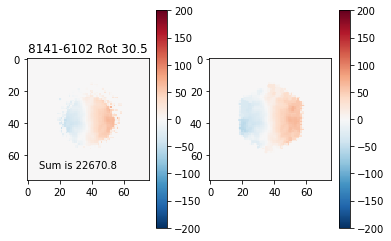

<Figure size 432x288 with 0 Axes>

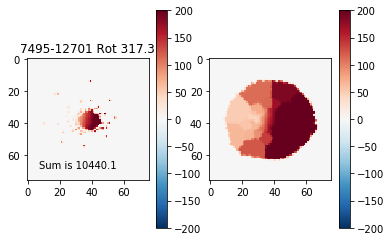

<Figure size 432x288 with 0 Axes>

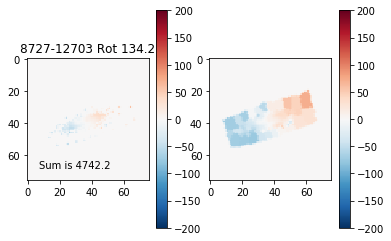

<Figure size 432x288 with 0 Axes>

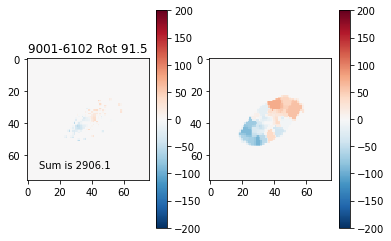

<Figure size 432x288 with 0 Axes>

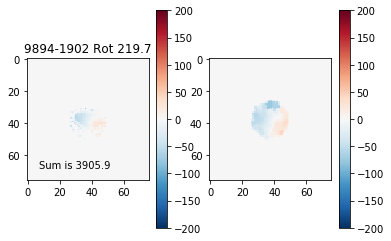

<Figure size 432x288 with 0 Axes>

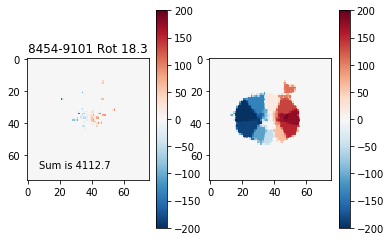

<Figure size 432x288 with 0 Axes>

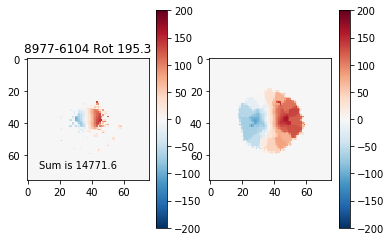

<Figure size 432x288 with 0 Axes>

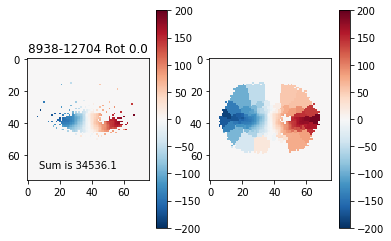

<Figure size 432x288 with 0 Axes>

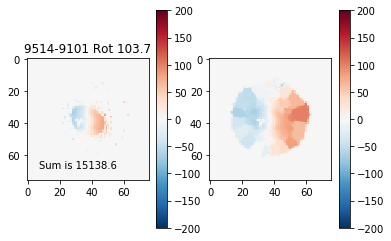

<Figure size 432x288 with 0 Axes>

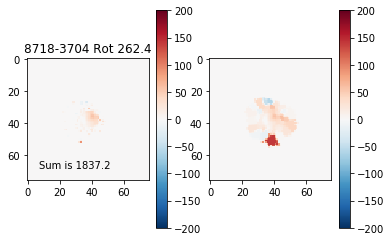

<Figure size 432x288 with 0 Axes>

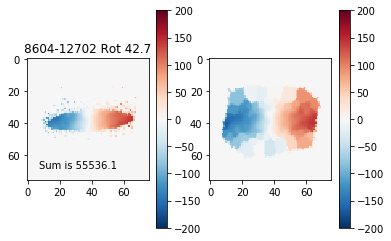

<Figure size 432x288 with 0 Axes>

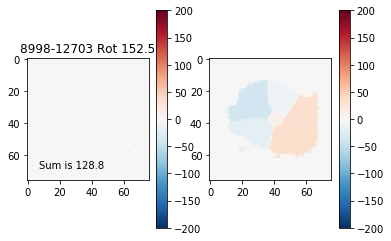

<Figure size 432x288 with 0 Axes>

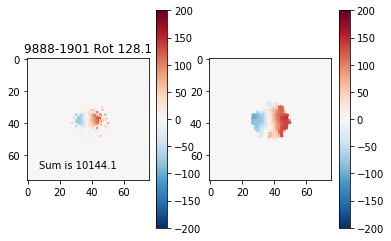

<Figure size 432x288 with 0 Axes>

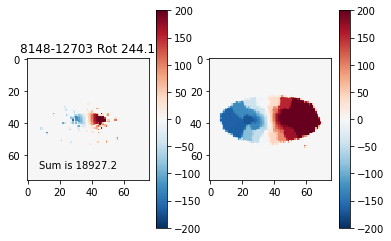

<Figure size 432x288 with 0 Axes>

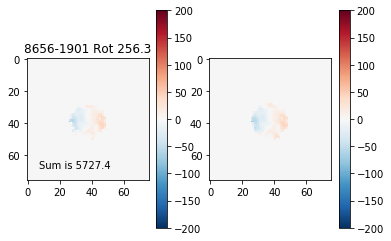

<Figure size 432x288 with 0 Axes>

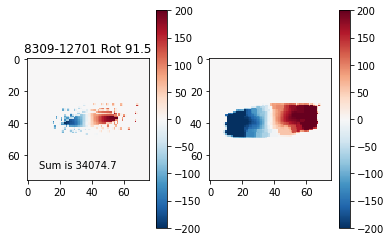

<Figure size 432x288 with 0 Axes>

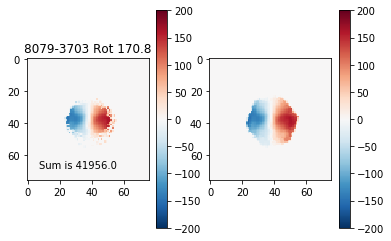

<Figure size 432x288 with 0 Axes>

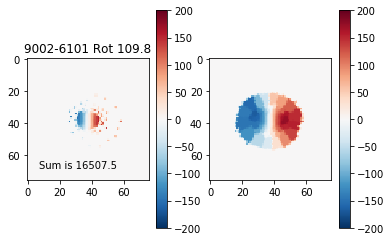

<Figure size 432x288 with 0 Axes>

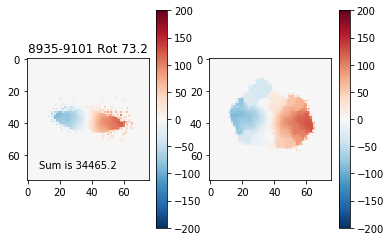

<Figure size 432x288 with 0 Axes>

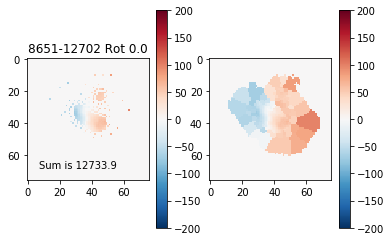

<Figure size 432x288 with 0 Axes>

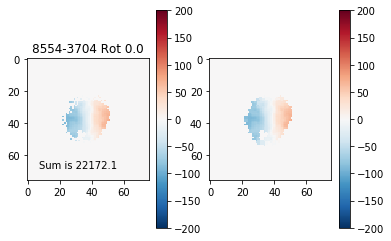

<Figure size 432x288 with 0 Axes>

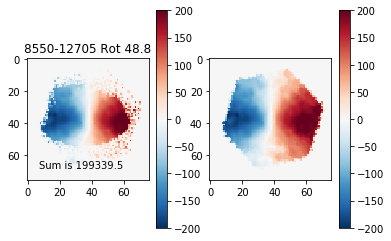

<Figure size 432x288 with 0 Axes>

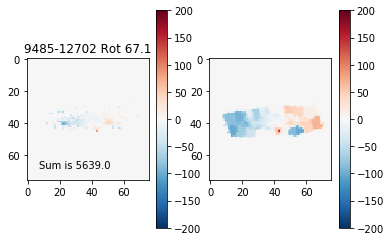

<Figure size 432x288 with 0 Axes>

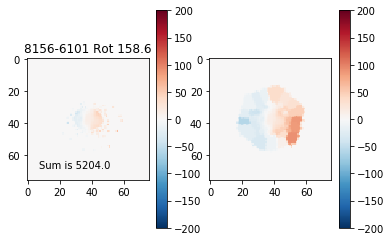

<Figure size 432x288 with 0 Axes>

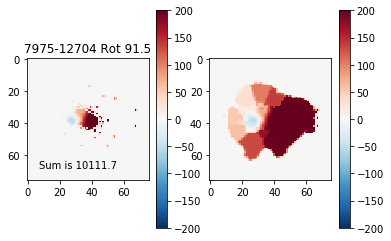

<Figure size 432x288 with 0 Axes>

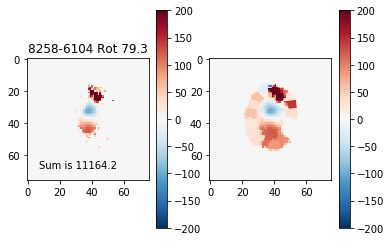

<Figure size 432x288 with 0 Axes>

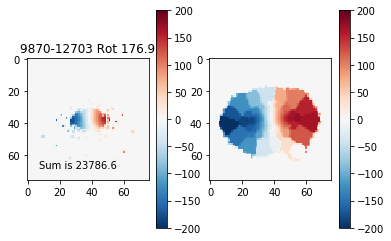

<Figure size 432x288 with 0 Axes>

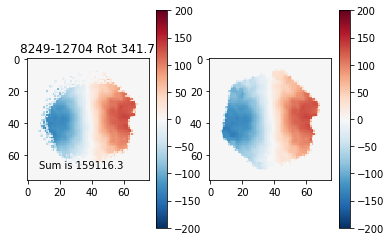

<Figure size 432x288 with 0 Axes>

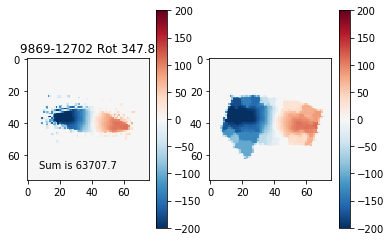

<Figure size 432x288 with 0 Axes>

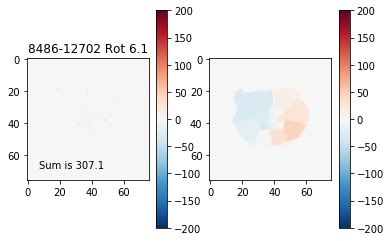

<Figure size 432x288 with 0 Axes>

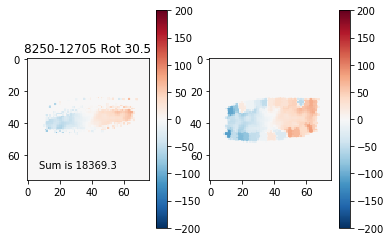

<Figure size 432x288 with 0 Axes>

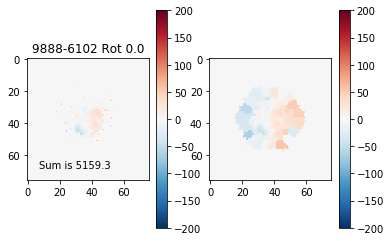

<Figure size 432x288 with 0 Axes>

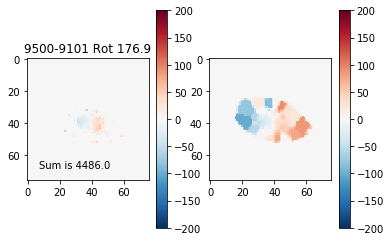

<Figure size 432x288 with 0 Axes>

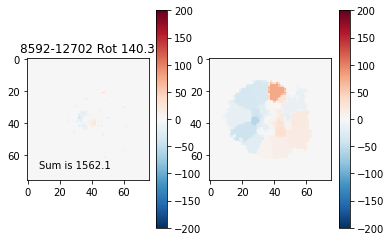

<Figure size 432x288 with 0 Axes>

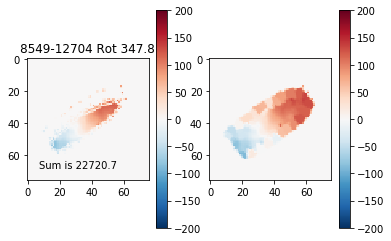

<Figure size 432x288 with 0 Axes>

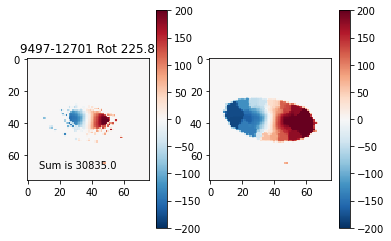

<Figure size 432x288 with 0 Axes>

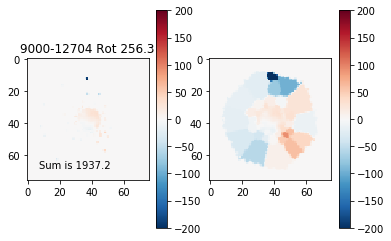

<Figure size 432x288 with 0 Axes>

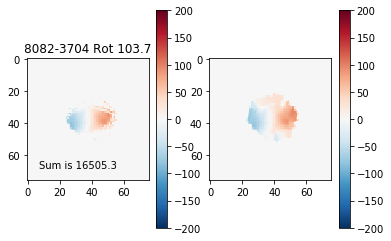

<Figure size 432x288 with 0 Axes>

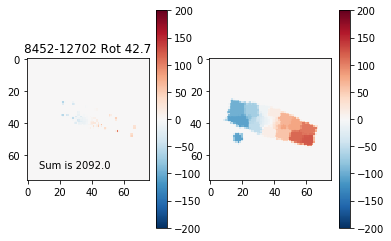

<Figure size 432x288 with 0 Axes>

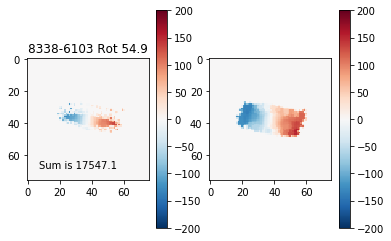

<Figure size 432x288 with 0 Axes>

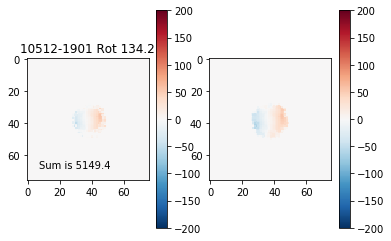

<Figure size 432x288 with 0 Axes>

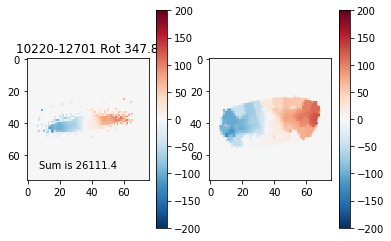

<Figure size 432x288 with 0 Axes>

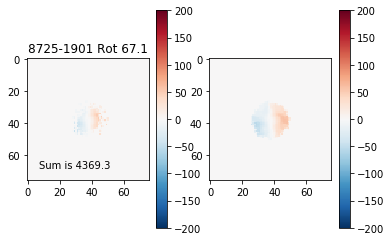

<Figure size 432x288 with 0 Axes>

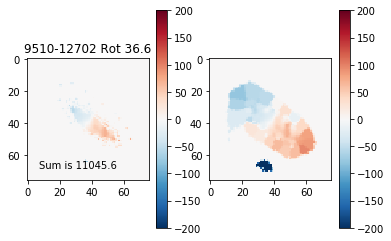

<Figure size 432x288 with 0 Axes>

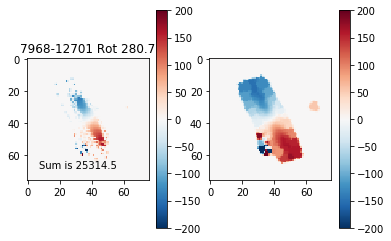

<Figure size 432x288 with 0 Axes>

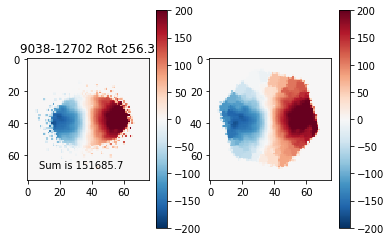

<Figure size 432x288 with 0 Axes>

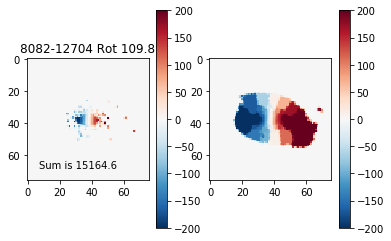

<Figure size 432x288 with 0 Axes>

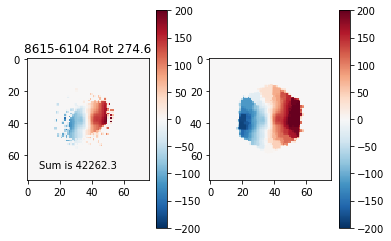

<Figure size 432x288 with 0 Axes>

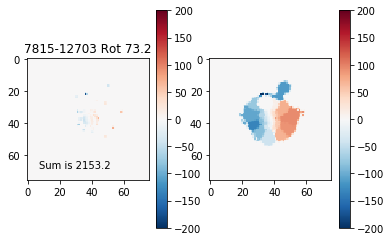

<Figure size 432x288 with 0 Axes>

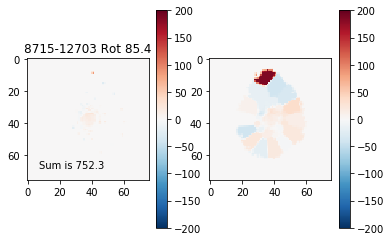

<Figure size 432x288 with 0 Axes>

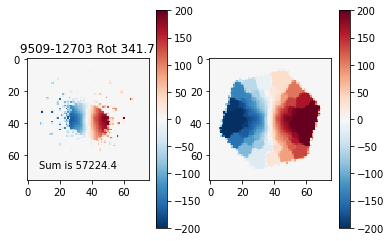

<Figure size 432x288 with 0 Axes>

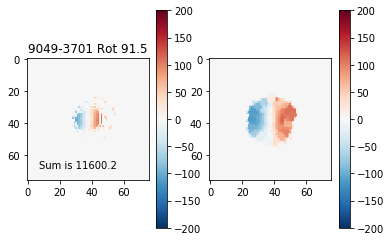

<Figure size 432x288 with 0 Axes>

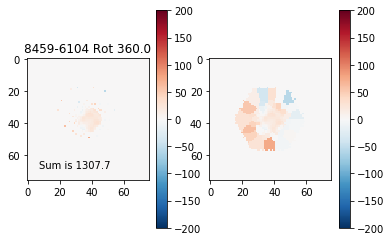

<Figure size 432x288 with 0 Axes>

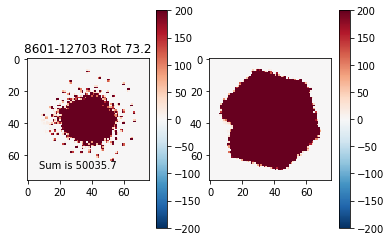

<Figure size 432x288 with 0 Axes>

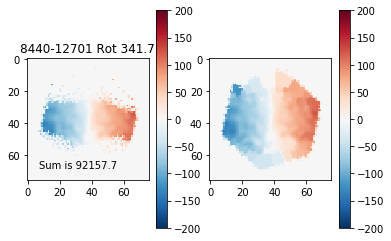

<Figure size 432x288 with 0 Axes>

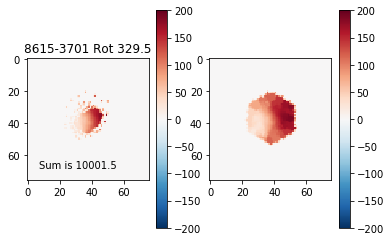

<Figure size 432x288 with 0 Axes>

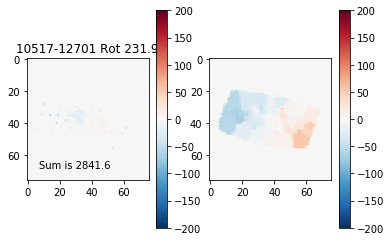

<Figure size 432x288 with 0 Axes>

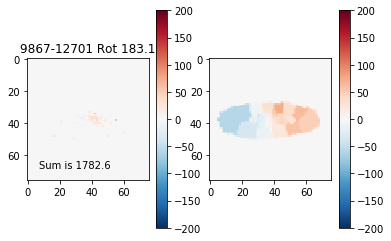

<Figure size 432x288 with 0 Axes>

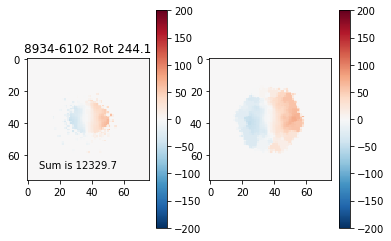

<Figure size 432x288 with 0 Axes>

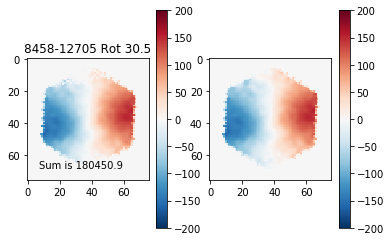

<Figure size 432x288 with 0 Axes>

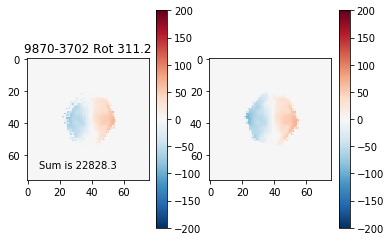

<Figure size 432x288 with 0 Axes>

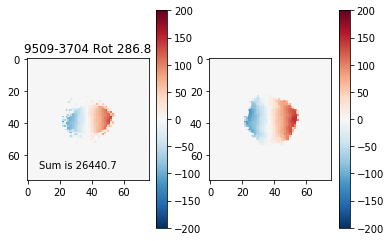

<Figure size 432x288 with 0 Axes>

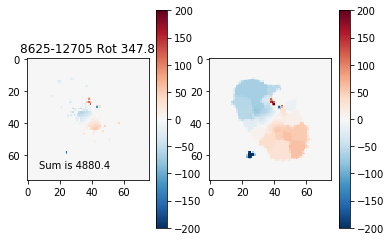

<Figure size 432x288 with 0 Axes>

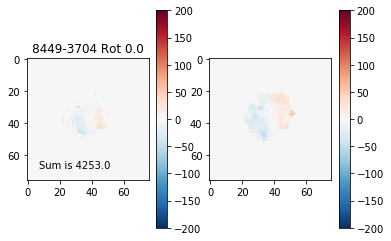

<Figure size 432x288 with 0 Axes>

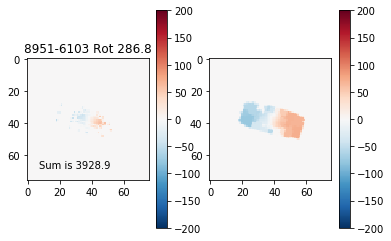

<Figure size 432x288 with 0 Axes>

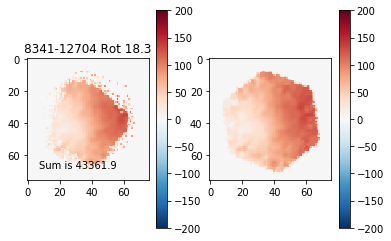

<Figure size 432x288 with 0 Axes>

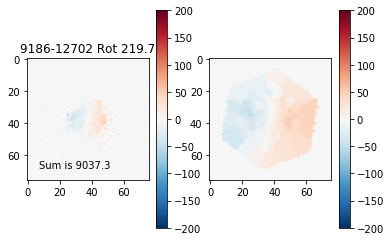

<Figure size 432x288 with 0 Axes>

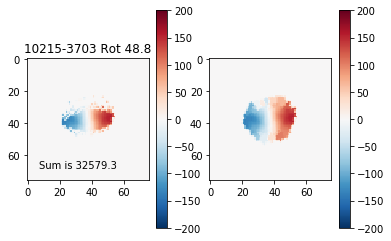

<Figure size 432x288 with 0 Axes>

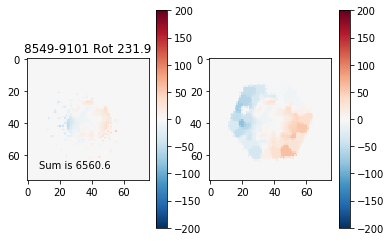

<Figure size 432x288 with 0 Axes>

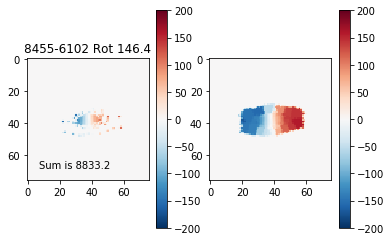

<Figure size 432x288 with 0 Axes>

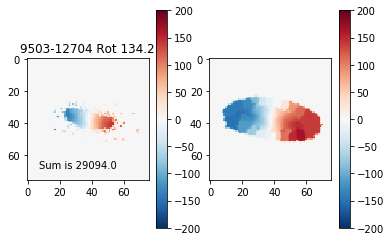

<Figure size 432x288 with 0 Axes>

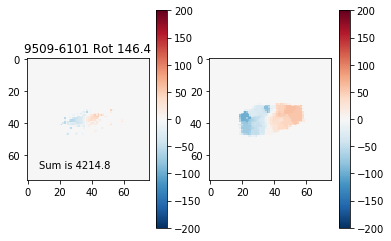

<Figure size 432x288 with 0 Axes>

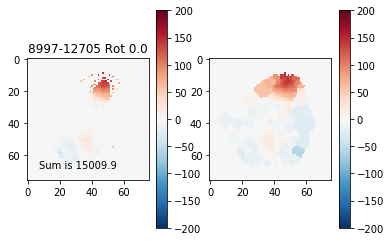

<Figure size 432x288 with 0 Axes>

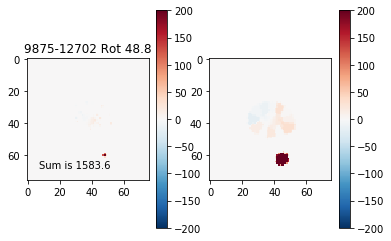

<Figure size 432x288 with 0 Axes>

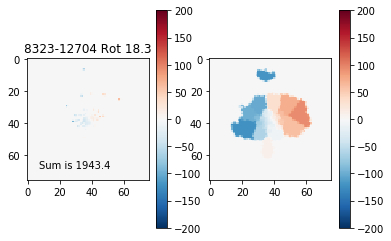

<Figure size 432x288 with 0 Axes>

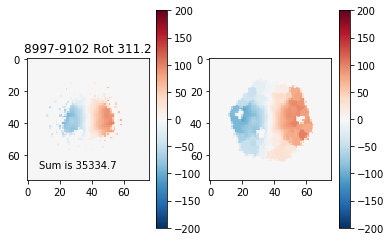

<Figure size 432x288 with 0 Axes>

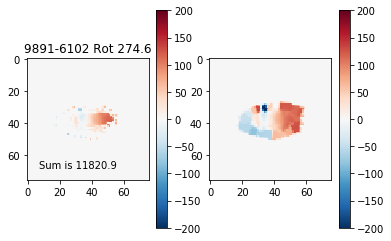

<Figure size 432x288 with 0 Axes>

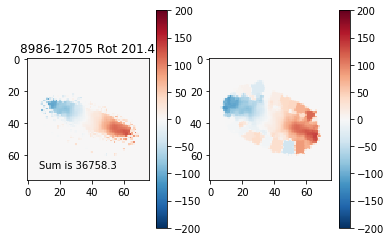

<Figure size 432x288 with 0 Axes>

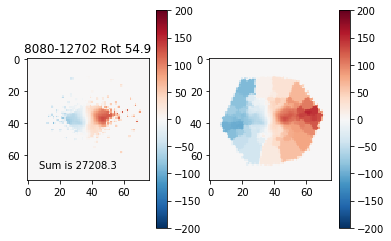

<Figure size 432x288 with 0 Axes>

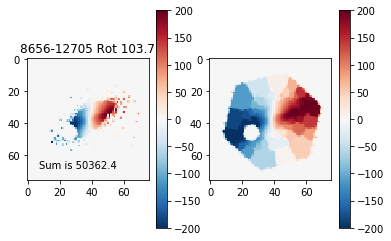

<Figure size 432x288 with 0 Axes>

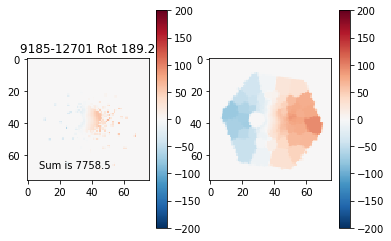

<Figure size 432x288 with 0 Axes>

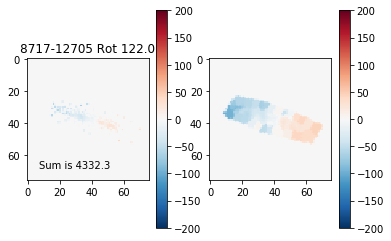

<Figure size 432x288 with 0 Axes>

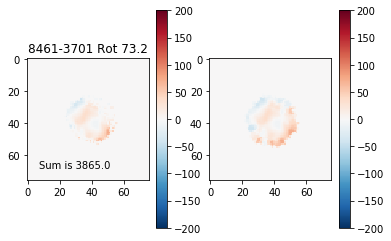

<Figure size 432x288 with 0 Axes>

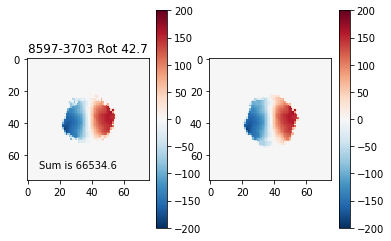

<Figure size 432x288 with 0 Axes>

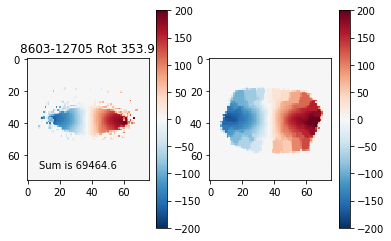

<Figure size 432x288 with 0 Axes>

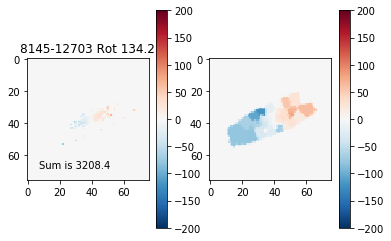

<Figure size 432x288 with 0 Axes>

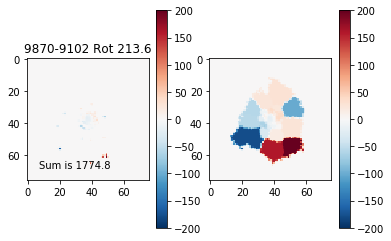

<Figure size 432x288 with 0 Axes>

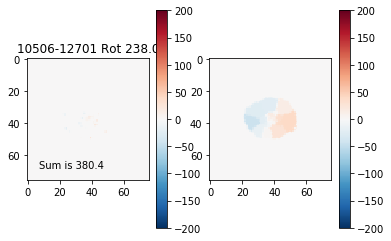

<Figure size 432x288 with 0 Axes>

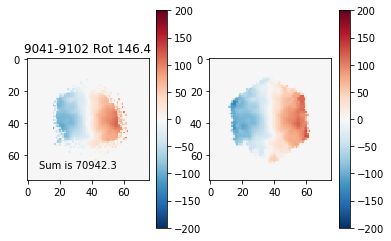

<Figure size 432x288 with 0 Axes>

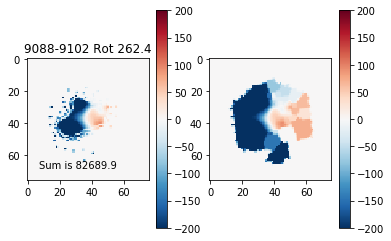

<Figure size 432x288 with 0 Axes>

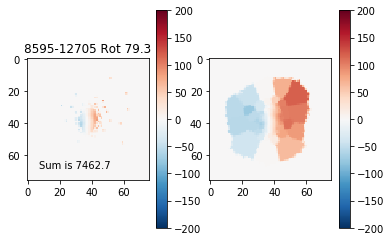

<Figure size 432x288 with 0 Axes>

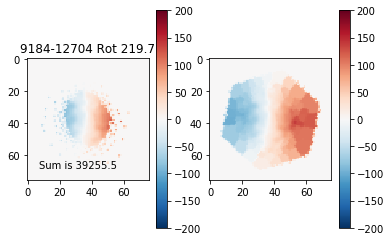

<Figure size 432x288 with 0 Axes>

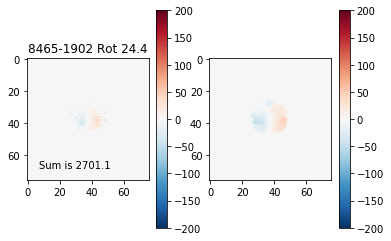

<Figure size 432x288 with 0 Axes>

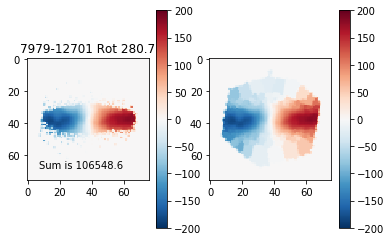

<Figure size 432x288 with 0 Axes>

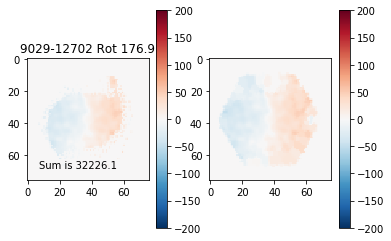

<Figure size 432x288 with 0 Axes>

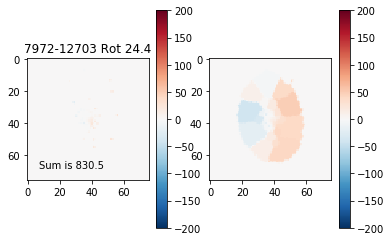

<Figure size 432x288 with 0 Axes>

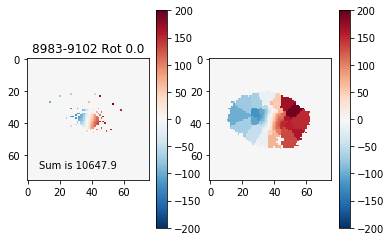

<Figure size 432x288 with 0 Axes>

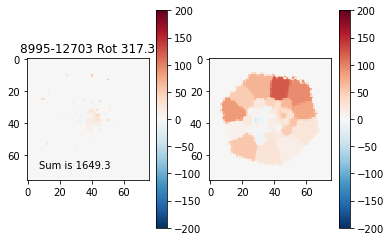

<Figure size 432x288 with 0 Axes>

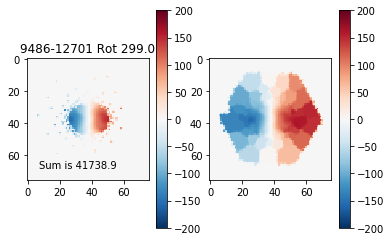

<Figure size 432x288 with 0 Axes>

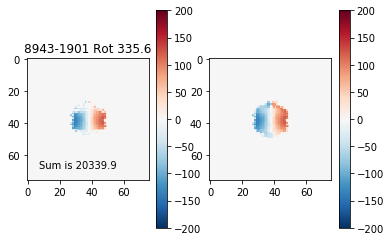

<Figure size 432x288 with 0 Axes>

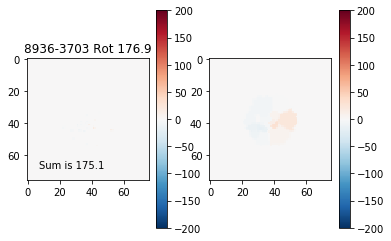

<Figure size 432x288 with 0 Axes>

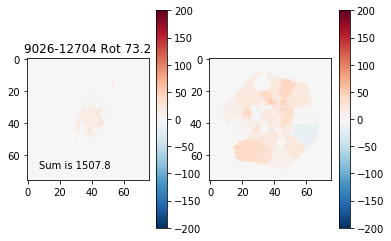

<Figure size 432x288 with 0 Axes>

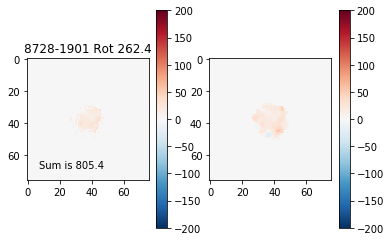

<Figure size 432x288 with 0 Axes>

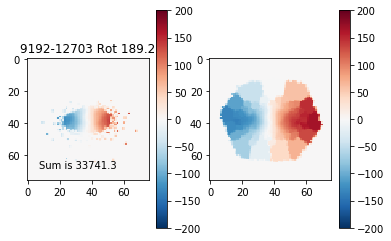

<Figure size 432x288 with 0 Axes>

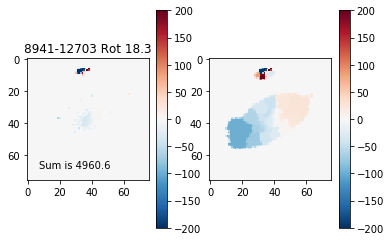

<Figure size 432x288 with 0 Axes>

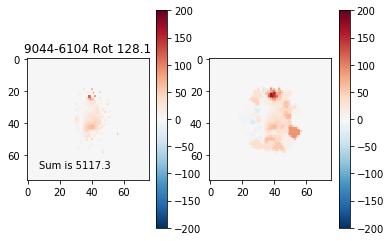

<Figure size 432x288 with 0 Axes>

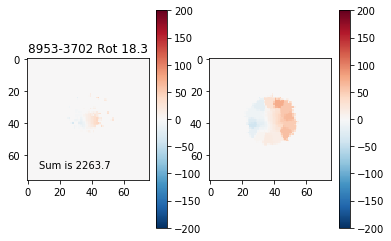

<Figure size 432x288 with 0 Axes>

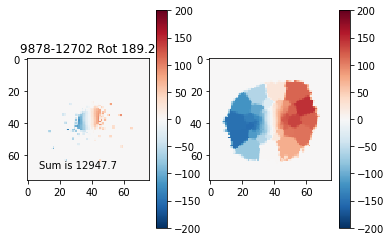

<Figure size 432x288 with 0 Axes>

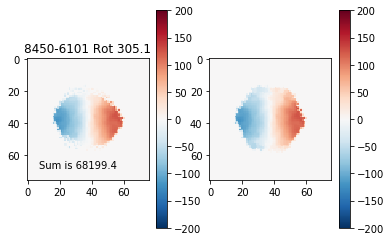

<Figure size 432x288 with 0 Axes>

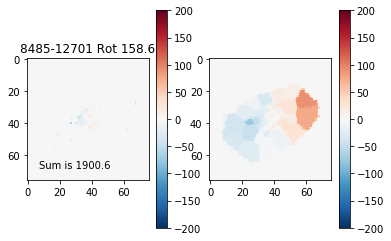

<Figure size 432x288 with 0 Axes>

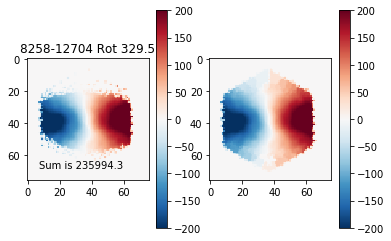

<Figure size 432x288 with 0 Axes>

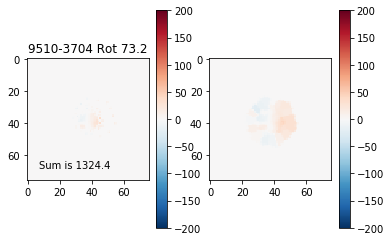

<Figure size 432x288 with 0 Axes>

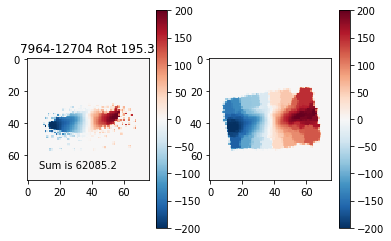

<Figure size 432x288 with 0 Axes>

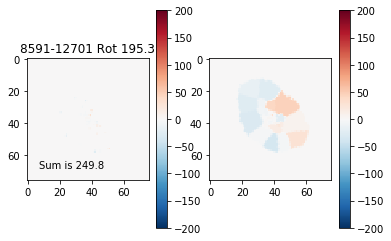

<Figure size 432x288 with 0 Axes>

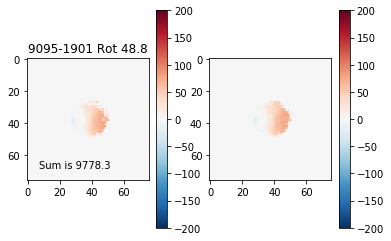

<Figure size 432x288 with 0 Axes>

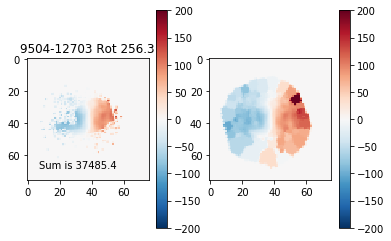

<Figure size 432x288 with 0 Axes>

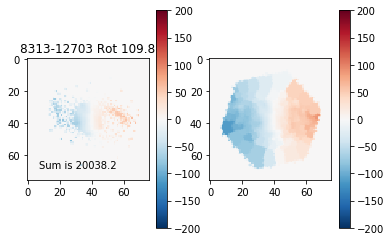

<Figure size 432x288 with 0 Axes>

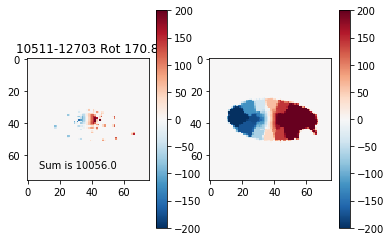

<Figure size 432x288 with 0 Axes>

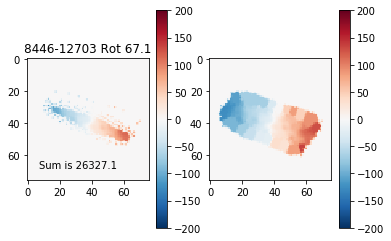

In [9]:
data_ml = map_array_ml[~np.all(map_array_ml == 0, axis=1)]
data_ml_e = map_array_ml_e[~np.all(map_array_ml_e == 0, axis=1)]

import matplotlib
import os

from skimage import transform
from skimage import data
from skimage.feature import corner_harris, corner_subpix, corner_peaks
from skimage.transform import warp, AffineTransform
print(os.getcwd() )
#import radon_python_mod.radon
from radon_python_mod import * # instead of using the below version
print(np.shape(data_ml))

def find_nearest_idx(array,value):
    idx = (np.abs(array-value)).argmin()
    return idx

print(len(r_eff_list))


verbose='no'

data_ml_rot = np.zeros((len(r_eff_list), 76, 76))
data_ml_rot_vor = np.zeros((len(r_eff_list), 76, 76))#len(r_eff_list)

data_ml_rot_e = np.zeros((len(r_eff_list), 76, 76))#len(r_eff_list)

rotate_PA=[]
rotate_PA_e=[]
rotate_ifu=[]
r_eff_rot=[]
for o in range(len(r_eff_list)):
    
    
    tester_gal = np.reshape(data_ml[o,:], (76,76))
    tester_gal_e = np.reshape(data_ml_e[o,:], (76,76))
    
    
    
    # Write a little sub routine where you basically minimize the left and right sum
    PA_kin_by_hand, rotated_by_hand, rotated_by_hand_vor, rotated_by_hand_e, sum_by_hand = minimize_left_right(tester_gal, tester_gal_e, 'no')
    plt.clf()
    fig=plt.figure()
    ax0 = fig.add_subplot(121)
    im0 = ax0.imshow(rotated_by_hand, cmap='RdBu_r', norm=MidpointNormalize(midpoint=0, vmax=200, vmin=-200))
    plt.colorbar(im0)
    ax0.set_title(str(ifu_name[o])+' Rot '+str(round(PA_kin_by_hand,1)))
    try:
        ax0.annotate('Sum is '+str(round(sum_by_hand,1)), xy=(0.1,0.1), xycoords='axes fraction')
    except:
        
        continue
    ax1 = fig.add_subplot(122)
    im1 = ax1.imshow(rotated_by_hand_vor, cmap='RdBu_r', norm=MidpointNormalize(midpoint=0, vmax=200, vmin=-200))
    plt.colorbar(im1)
    
    plt.show()
    
    
    data_ml_rot[o,:,:] = rotated_by_hand
    data_ml_rot_vor[o,:,:] = rotated_by_hand_vor
    data_ml_rot_e[o,:,:] = rotated_by_hand_e
    rotate_PA.append(PA_kin_by_hand)
    #rotate_PA_e.append(std_avg)
    rotate_ifu.append(ifu_name[o])
    r_eff_rot.append(r_eff_list[o])
    
    

### Implement a PCA to play with how reducing the data might help you (in dimensions)
It's important to first standardize data in PCA

In [10]:
# Maybe unflatten it first?
data = data_ml_rot_vor

full_data = data#np.reshape(map_array_ml,(np.shape(map_array_ml)[0],shape,shape))
n_galaxies = np.shape(data)[0]#np.shape(map_array_ml)[0]


MB_matrix = np.zeros(( np.shape(data)[0],full_data[0,:,:].size))
for i in range(np.shape(data)[0]):
    MB_array = full_data[i,:,:].flatten()
    MB_arrayStd = (MB_array - MB_array.mean())/MB_array.std()
    MB_matrix[i,:] = MB_arrayStd

[WARNING]: invalid value encountered in true_divide (RuntimeWarning)


[-0.29013813 -0.29013813 -0.29013813 ... -0.29013813 -0.29013813
 -0.29013813]


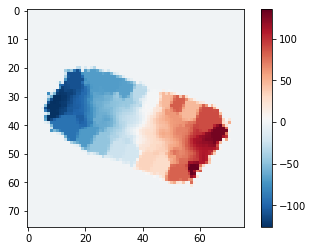

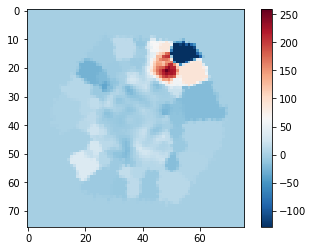

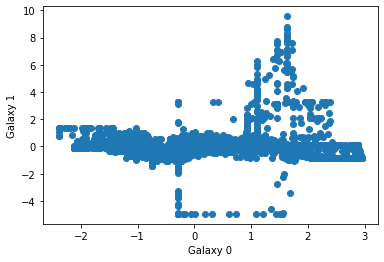

In [11]:
for j in range(np.shape(full_data)[0]):
    
    if np.isnan(full_data[j,:,:].any()) or np.isinf(full_data[j,:,:].any()):
        plt.clf()
        plt.imshow(full_data[j,:,:], cmap='RdBu_r')
        plt.show()
        STOP

print(MB_matrix[0,:])

plt.imshow(full_data[502,:,:], cmap='RdBu_r')
plt.colorbar()
plt.show()

plt.imshow(full_data[1,:,:], cmap='RdBu_r')
plt.colorbar()
plt.show()


plt.scatter(MB_matrix[0,:],MB_matrix[1,:])
plt.xlabel('Galaxy 0')
plt.ylabel('Galaxy 1')
plt.show()

In [12]:
# You need to remove all rows of this matrix where all entries are zeros

'''x,y = np.where(np.isnan(MB_matrix))
print(x, y)
print(MB_matrix[x,y])
plt.clf()
plt.imshow(full_data[x[0],:,:], cmap='RdBu_r')
plt.colorbar()
plt.show()

print(full_data[x[0],:,:])'''

MB_matrix_cleaned = MB_matrix[~np.isnan(MB_matrix).any(axis=1)]
print(np.shape(MB_matrix))


# Covariance
np.set_printoptions(precision=3)
cov = np.cov(MB_matrix_cleaned)#.transpose())
# Eigen Values
EigVal,EigVec = np.linalg.eig(cov)
print("Eigenvalues:\n\n", EigVal,"\n")

(503, 5776)
Eigenvalues:

 [2.384e+02 5.026e+01 2.620e+01 1.475e+01 1.324e+01 1.079e+01 9.726e+00
 6.376e+00 5.556e+00 5.462e+00 4.472e+00 4.402e+00 4.102e+00 3.501e+00
 3.190e+00 2.832e+00 2.714e+00 2.640e+00 2.443e+00 2.413e+00 2.196e+00
 2.123e+00 2.007e+00 1.910e+00 1.789e+00 1.728e+00 1.679e+00 1.600e+00
 1.566e+00 1.486e+00 1.431e+00 1.401e+00 1.365e+00 1.335e+00 1.281e+00
 1.232e+00 1.198e+00 1.181e+00 1.129e+00 1.094e+00 1.014e+00 9.952e-01
 9.827e-01 9.516e-01 9.236e-01 9.078e-01 8.789e-01 8.403e-01 8.163e-01
 8.096e-01 7.800e-01 7.582e-01 7.400e-01 7.174e-01 6.935e-01 6.842e-01
 6.650e-01 6.628e-01 6.419e-01 6.269e-01 6.110e-01 5.951e-01 5.822e-01
 5.653e-01 5.507e-01 5.468e-01 5.334e-01 5.022e-01 4.997e-01 4.941e-01
 4.856e-01 4.716e-01 4.602e-01 4.575e-01 4.420e-01 4.335e-01 4.286e-01
 4.229e-01 4.181e-01 4.141e-01 3.990e-01 3.978e-01 3.866e-01 3.743e-01
 3.652e-01 3.540e-01 3.473e-01 3.412e-01 3.387e-01 3.257e-01 3.204e-01
 3.110e-01 3.037e-01 3.062e-01 2.982e-01 2.927e-01

In [13]:
# Ordering Eigen values and vectors
n_PCAs = 10
order = EigVal.argsort()[::-1][:n_PCAs]
EigVal = EigVal[order]
EigVec = EigVec[:,order]
#Projecting data on Eigen vector directions resulting to Principal Components 
PC = np.matmul(MB_matrix_cleaned.transpose(),EigVec)   #cross product

print(order)
print('eigval', EigVal)

[0 1 2 3 4 5 6 7 8 9]
eigval [238.389  50.263  26.197  14.747  13.242  10.786   9.726   6.376   5.556
   5.462]


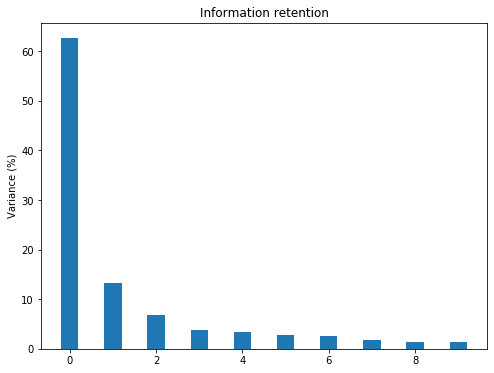

In [14]:
#Information Retained by Principal Components
plt.figure(figsize=(8,6))
plt.bar(range(n_PCAs),EigVal/sum(EigVal)*100,align='center',width=0.4)
plt.ylabel('Variance (%)')
plt.title('Information retention');

[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)


Text(0.5, 0.98, 'Pair plot of PCs')

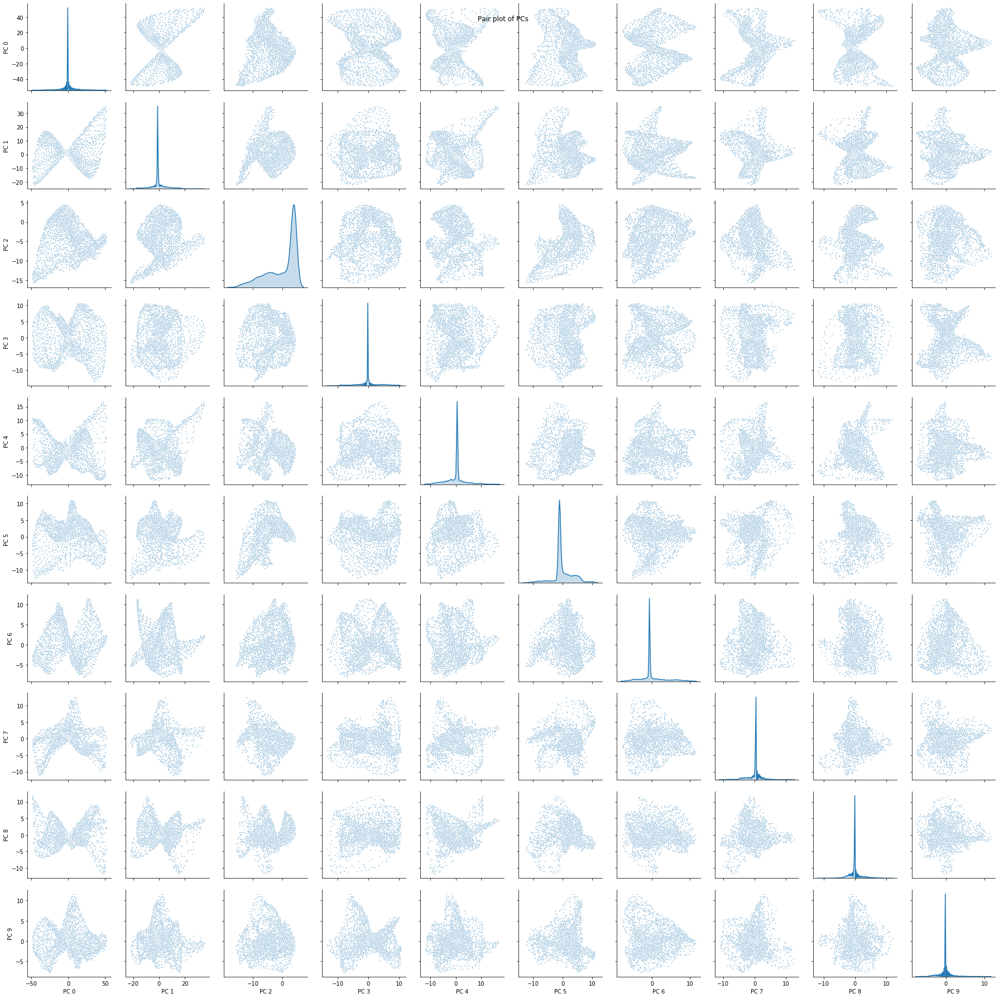

In [15]:
import seaborn as sns
import pandas as pd
# Generate Paiplot for original data and transformed PCs
'''Bandnames = ['Band 1','Band 2','Band 3','Band 4','Band 5','Band 6','Band 7']
a = sns.pairplot(pd.DataFrame(MB_matrix.transpose(),
                columns = Bandnames),
                 diag_kind='kde',plot_kws={"s": 3})
a.fig.suptitle("Pair plot of Band images")'''
PCnames = ['PC '+str(i) for i in range(n_PCAs)]
b = sns.pairplot(pd.DataFrame(PC,
                columns = PCnames),
                 diag_kind='kde',plot_kws={"s": 3})
b.fig.suptitle("Pair plot of PCs")

### Now try converting back into the images to visualize what each of the principal components are

In [16]:
# Rearranging 1-d arrays to 2-d arrays of image size
print(np.shape(PC))
PC_2d = np.zeros((n_galaxies, shape, shape))
for i in range(n_PCAs):
    PC_2d[i,:,:] = PC[:,i].reshape(-1,shape)
# normalizing between 0 to 255
'''PC_2d_Norm = np.zeros((n_galaxies, shape, shape))
for i in range(n_bands):
    PC_2d_Norm[i,:,:] = cv2.normalize(PC_2d[i,:,:],
                    np.zeros((shape,shape)),0,255 ,cv2.NORM_MINMAX)'''



(5776, 10)


'PC_2d_Norm = np.zeros((n_galaxies, shape, shape))\nfor i in range(n_bands):\n    PC_2d_Norm[i,:,:] = cv2.normalize(PC_2d[i,:,:],\n                    np.zeros((shape,shape)),0,255 ,cv2.NORM_MINMAX)'

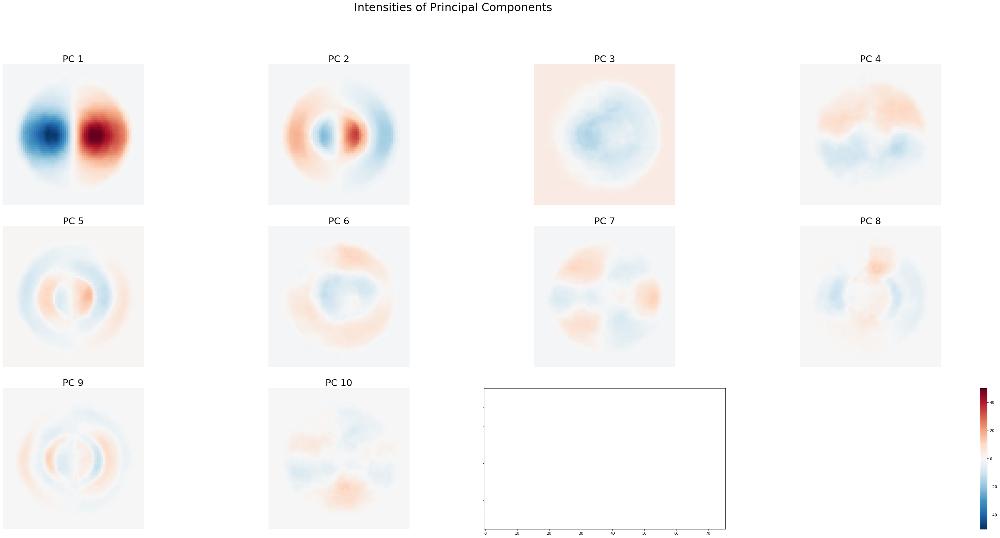

In [17]:
fig,axes = plt.subplots(3,4,figsize=(50,23),sharex='all',
                        sharey='all')
fig.subplots_adjust(wspace=0.1, hspace=0.15)
fig.suptitle('Intensities of Principal Components ', fontsize=30)
axes = axes.ravel()
for i in range(n_PCAs):
    
    im = axes[i].imshow(PC_2d[i,:,:],cmap='RdBu_r', vmin=-50, vmax=50)
    axes[i].set_title('PC '+str(i+1),fontsize=25)
    axes[i].axis('off')
    
plt.colorbar(im, fraction=0.046)
fig.delaxes(axes[-1])

### How to reconstruct a given galaxy?

In [18]:
from sklearn.decomposition import PCA as RandomizedPCA
# Compute the components and projected faces
n_comps = 40
pca = RandomizedPCA(n_comps).fit(MB_matrix_cleaned)
components = pca.transform(MB_matrix_cleaned)
projected = pca.inverse_transform(components)

[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)
[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)
[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)


In [19]:
from sklearn.decomposition import FastICA
ica = FastICA(n_components=n_comps,random_state=0)
ICA_components = ica.fit_transform(MB_matrix_cleaned)
ICA_projected = ica.inverse_transform(ICA_components)

<Figure size 432x288 with 0 Axes>

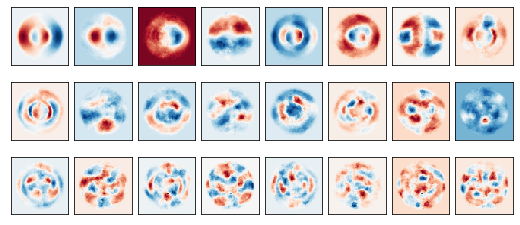

<Figure size 432x288 with 0 Axes>

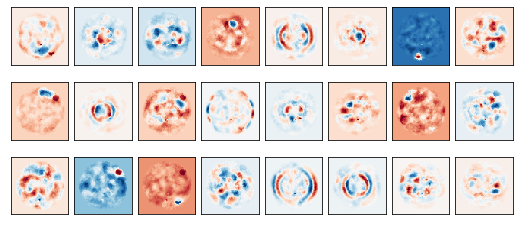

In [20]:
plt.clf()

fig, axes = plt.subplots(3, 8, figsize=(9, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    try:
        ax.imshow(pca.components_[i].reshape(shape,shape), cmap='RdBu_r')
    except IndexError:
        break
plt.show()
plt.clf()
fig, axes = plt.subplots(3, 8, figsize=(9, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    try:
        ax.imshow(ica.components_[i].reshape(shape,shape), cmap='RdBu_r')
    except IndexError:
        break
plt.show()

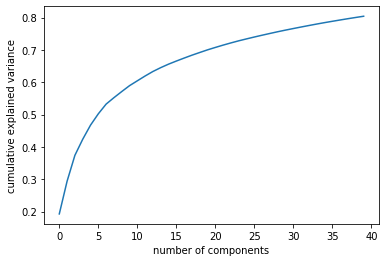

In [21]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');


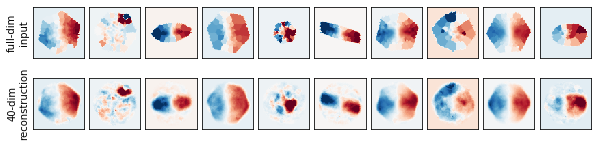

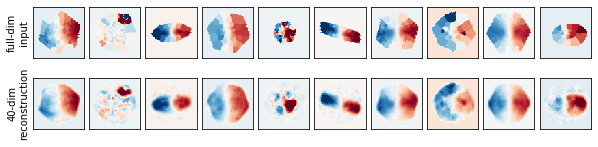

In [22]:
# Plot the results
fig, ax = plt.subplots(2, 10, figsize=(10, 2.5),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(10):
    ax[0, i].imshow(MB_matrix_cleaned[i].reshape(shape,shape), cmap='RdBu_r',norm=MidpointNormalize(midpoint=0, vmin=-3, vmax=3))
    ax[1, i].imshow(projected[i].reshape(shape,shape), cmap='RdBu_r',norm=MidpointNormalize(midpoint=0, vmin=-3, vmax=3))
    
ax[0, 0].set_ylabel('full-dim\ninput')
ax[1, 0].set_ylabel(str(n_comps)+'-dim\nreconstruction');

fig, ax = plt.subplots(2, 10, figsize=(10, 2.5),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i in range(10):
    ax[0, i].imshow(MB_matrix_cleaned[i].reshape(shape,shape), cmap='RdBu_r',norm=MidpointNormalize(midpoint=0, vmin=-3, vmax=3))
    ax[1, i].imshow(ICA_projected[i].reshape(shape,shape), cmap='RdBu_r',norm=MidpointNormalize(midpoint=0, vmin=-3, vmax=3))
    
ax[0, 0].set_ylabel('full-dim\ninput')
ax[1, 0].set_ylabel(str(n_comps)+'-dim\nreconstruction');

### Time to do another UMAP 

[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)
[WARNING]: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject (RuntimeWarning)


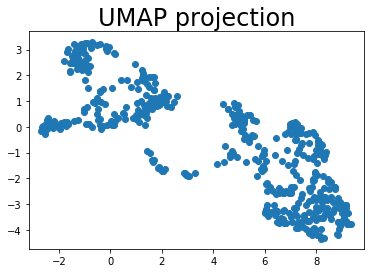

(502, 2)


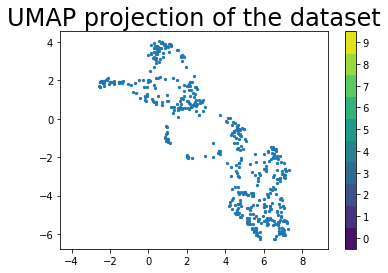

In [23]:
import umap.umap_ as umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(projected)

embedding.shape
plt.clf()
plt.scatter(embedding[:,0], embedding[:,1])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection', fontsize=24)
plt.show()
plt.clf()
# So now you can try to run a t-SNE or a UMAP on the reconstructed maps?
reducer = umap.UMAP(random_state=24)
reducer.fit(projected)
embedding = reducer.transform(projected)
# Verify that the result of calling transform is
# idenitical to accessing the embedding_ attribute
assert(np.all(embedding == reducer.embedding_))
print(embedding.shape)
plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the dataset', fontsize=24)
plt.show()

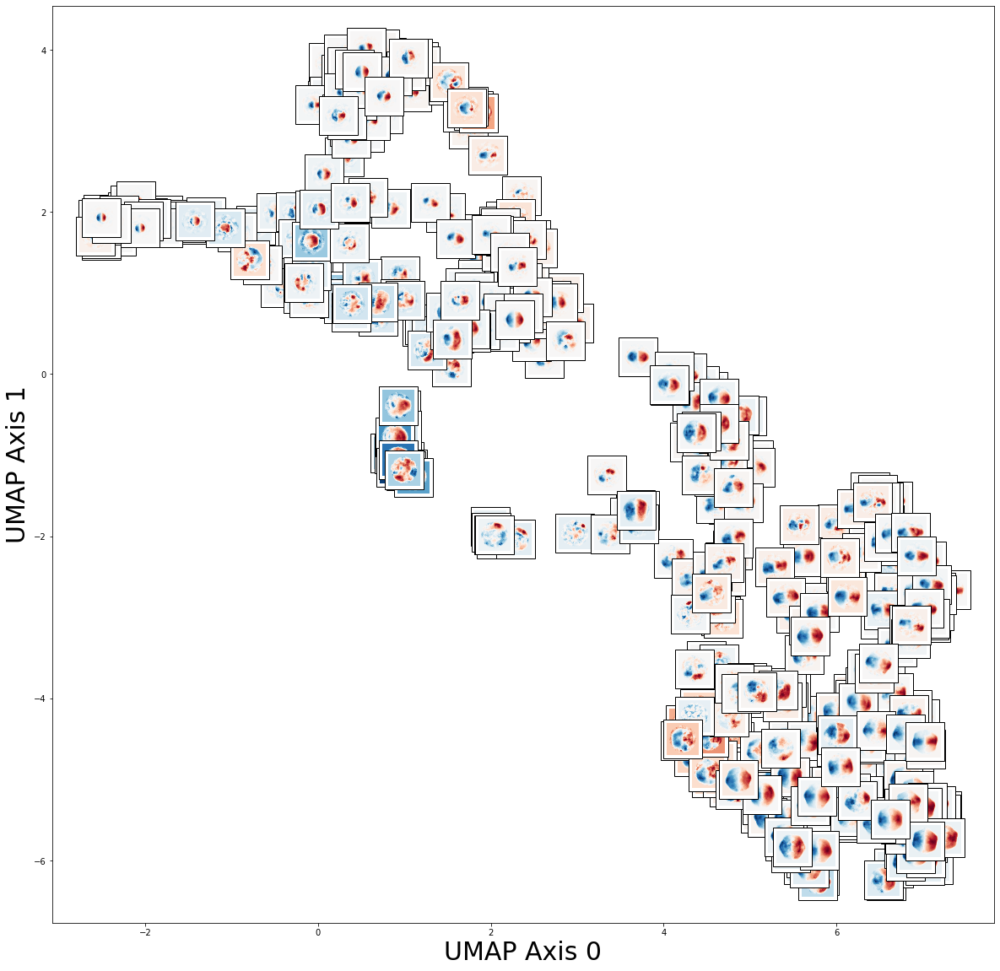

In [24]:
import matplotlib
from matplotlib.offsetbox import OffsetImage, AnnotationBbox 
from matplotlib import pyplot as plt


class MidpointNormalize(matplotlib.colors.Normalize):
    """
    Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

    e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
    """
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        matplotlib.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))
    #elev_min=-150
    #elev_max=3000
    


# Imscatter is a cool tool that allows you to overplot
# the velocity maps as the points.
def imscatter(x, y, images, mid_val, ax=None, zoom=0.01):     
        if ax is None:         
                ax = plt.gca()           
        x, y = np.atleast_1d(x, y)     
        artists = []     
        for x0, y0, image0 in zip(x, y, images):
                ima = image0
                im = OffsetImage(ima, zoom=zoom, cmap='RdBu_r', norm=MidpointNormalize(midpoint=0))#mid_val))   
                ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=True)         
                artists.append(ax.add_artist(ab))     
        ax.update_datalim(np.column_stack([x, y]))     
        ax.autoscale()     
        return artists
#np.reshape(map_array_ml[j,:],(shape,shape))
twod = np.reshape(projected, (np.shape(projected)[0],shape, shape))

fig = plt.figure(figsize=(20,20))
ax1 = plt.gca()
imscatter(embedding[:,0], embedding[:,1], np.ma.masked_where(twod==0, twod),0, 
          ax=ax1, zoom=0.5)
ax1.set_xlabel('UMAP Axis 0', size=30)
ax1.set_ylabel('UMAP Axis 1', size=30)
#plt.show()
plt.savefig('umap_PCA_'+str(n_comps)+'.png')#, dpi=1000)

# It is clear that UMAP is mostly findig an orientation
# effect, AKA the biggest defining feature of this dataset
# is the orientation of the large-scale axis of rotation.
# This is unsurprising, but we'll have to remove it
# if we want to get at other trends.



### SOM (Self-organizing Map)
Are also a nice way to display data - 
It is an artificial neural network that learns similarities in data
It does this by constructing a grid of mock galaxies

In [25]:
from minisom import MiniSom

# Okay well what if I want to run the MB_matrix_cleaned but I want to identify the background in each map
# and set it equal to zero

import itertools
import operator

def most_common(L):
    # get an iterable of (item, iterable) pairs
    SL = sorted((x, i) for i, x in enumerate(L))
    # print 'SL:', SL
    groups = itertools.groupby(SL, key=operator.itemgetter(0))
    # auxiliary function to get "quality" for an item
    def _auxfun(g):
        item, iterable = g
        count = 0
        min_index = len(L)
        for _, where in iterable:
              count += 1
              min_index = min(min_index, where)
            # print 'item %r, count %r, minind %r' % (item, count, min_index)
        return count, -min_index
    # pick the highest-count/earliest item
    return max(groups, key=_auxfun)[0]

def replace(inarray, bg_value):
    outarray = np.where(inarray ==bg_value, 0, inarray)
    return outarray

# Okay now go through and replace
MB_matrix_zeros = np.zeros(np.shape(MB_matrix_cleaned))
for j in range(np.shape(MB_matrix_cleaned)[0]):
    bg = most_common(MB_matrix_cleaned[j])
    
    MB_matrix_zeros[j] = np.array(replace(MB_matrix_cleaned[j],bg))

#print(np.shape(map_array_ml))
dim_som = 10
som = MiniSom(dim_som, dim_som, 5776, sigma=4,
              learning_rate=0.5, neighborhood_function='triangle')

#som.pca_weights_init(map_array_ml)
print("Training...")

print(np.shape(MB_matrix_zeros))

som.train_random(MB_matrix_zeros, 5000, verbose=True)  # random training
print("\n...ready!")

Training...
(502, 5776)
 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 36.542578044568366
 topographic error: 0.900398406374502

...ready!


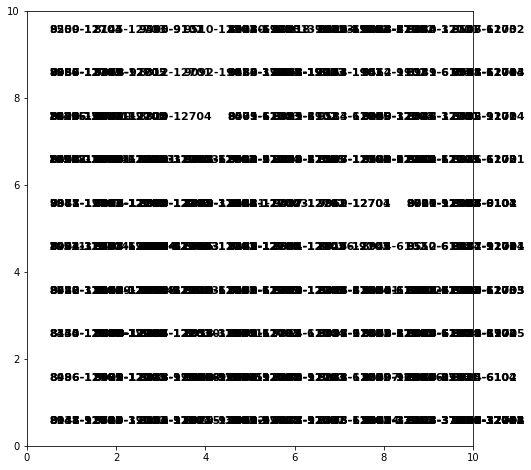

<Figure size 432x288 with 0 Axes>

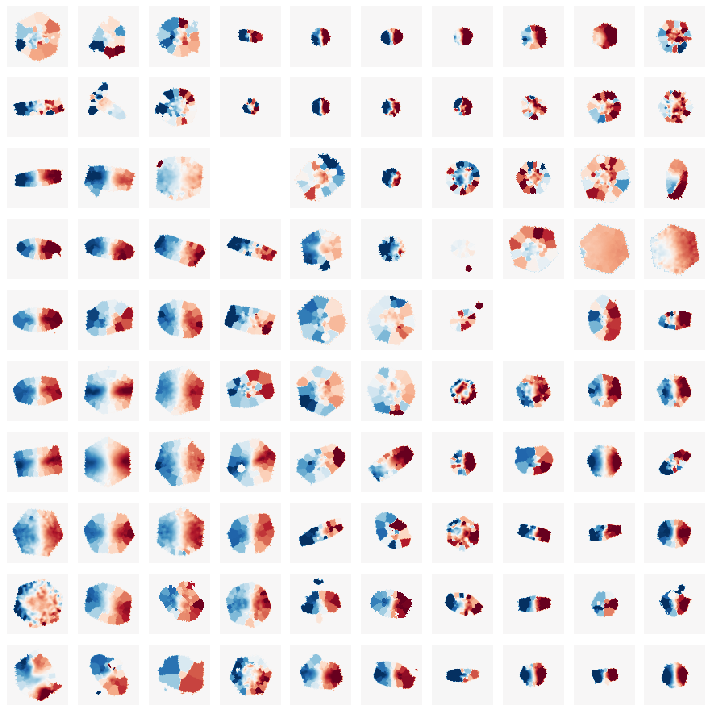

In [26]:
# This will plot the kinematic maps on the SOM space

num = ifu_name
fig = plt.figure(figsize=(8, 8))
ax1 = fig.add_subplot(111)
wmap = {}
im = 0
for x, t in zip(MB_matrix_zeros, num):  # scatterplot
    w = som.winner(x)
    wmap[w] = im
    #imscatter(w[0]+.5,w[1]+.5, np.ma.masked_where(im==0, im), ax=ax1, zoom=0.4)

    ax1.text(w[0]+.5,  w[1]+.5,  str(t), fontdict={'weight': 'bold',  'size': 11})
    im = im + 1
ax1.axis([0, som.get_weights().shape[0], 0,  som.get_weights().shape[1]])
plt.savefig('som.png')

plt.show()

plt.clf()
plt.figure(figsize=(dim_som,dim_som), facecolor='white')
cnt = 0
for j in reversed(range(dim_som)):  # images mosaic
    for i in range(dim_som):
        plt.subplot(dim_som, dim_som, cnt+1, frameon=False,  xticks=[],  yticks=[])
        if (i, j) in wmap:
            plt.imshow(np.reshape(MB_matrix_zeros[wmap[(i, j)]],(shape, shape)),
                       cmap='RdBu_r', norm=MidpointNormalize(midpoint=0, vmin=-3, vmax=3))
        else:
            #continue
            plt.imshow(np.zeros((8, 8)),  cmap='Greys')
        cnt = cnt + 1

plt.tight_layout()
plt.savefig('som_imgs_derot_zeros_'+str(dim_som)+'.pdf')
plt.show()

# Interesting result here

### Now, implement a k-menas clustering on this
The point is to see if you can pull useful information out of 500 galaxies worth of k-means

check 1 False
check 2 True
(502, 5776)
[1 0 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 1 1 1 1
 0 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 1 0 1 1 0
 1 0 1 1 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 1 0 0 1 1 1 1 1
 0 0 1 0 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 1
 0 1 0 1 0 1 1 1 1 0 0 0 1 0 1 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0
 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0
 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 1 1 1 1 1 0 1 1 0 1 1 0 0 1 1
 0 0 0 0 1 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 0
 0 1 1 1 1 1 1 0 0 0 1 1 1 0 0 1 0 0 1 1 0 1 1 0 1 0 0 0 1 0 1 0 1 1 1 1 0
 1 0 0 1 1 1 0 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 1 1
 0 1 1 1 1 1 0 1 1 1 1 1 0 0 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 0
 0 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 0
 0 0 0 0 0 1 0 1 0 1 0 0 0 1 1 0 1 1 1 1 1 0 0 1 1 0 0 1 1 1 

<Figure size 432x288 with 0 Axes>

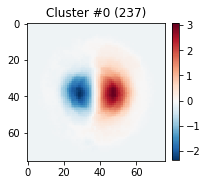

This is the number of galaxies in this cluster 237


<Figure size 432x288 with 0 Axes>

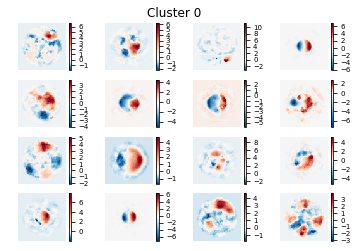

<Figure size 432x288 with 0 Axes>

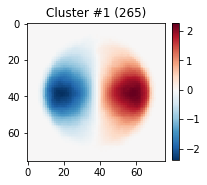

This is the number of galaxies in this cluster 265


<Figure size 432x288 with 0 Axes>

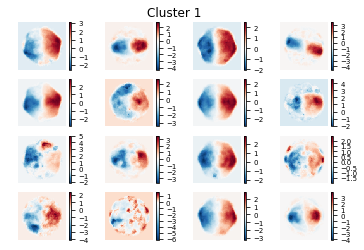

{0: ['9036-12703', '7990-12702', '7964-12704', '7964-12705', '9499-12703', '9499-12704', '9499-6103', '8325-12703', '8325-12705', '9031-12703', '9497-12704', '9497-12701', '9497-1901', '8313-12703', '8313-6102', '9038-12702', '9000-12701', '9868-1901', '8723-3702', '8949-12705', '8940-12704', '8940-12702', '8940-3703', '8143-1902', '8143-3704', '8143-1901', '8715-12703', '8715-6103', '8947-12703', '8947-12702', '8712-6103', '8712-12701', '8144-12702', '8144-3704', '8315-6103', '8315-3702', '9001-12704', '8588-12704', '8588-6104', '8588-3703', '9496-12702', '8312-12702', '8312-12701', '9039-3703', '8324-12705', '8323-12704', '8323-6102', '8323-6101', '9037-6102', '9037-12701', '9894-1902', '8946-12703', '8713-12702', '8979-12703', '8979-12701', '8979-6101', '8145-12703', '8145-12704', '8145-12701', '9867-12705', '9867-12701', '8941-12704', '8941-9102', '10001-12701', '10001-3703', '8983-9102', '8977-12703', '8977-12705', '8977-12701', '8722-12704', '8722-1902', '8948-12703', '8948-12705

NameError: name 'STOP' is not defined

In [30]:
# The initial problem with clustering is that when you go from 2 to 3 clusters, there are galaxies
# that occupy clusters by themselves, so I would like to remove them from the sample
# at least so they're not part of the clustering

data_cluster = projected


print('check 1', np.any(np.isnan(data_cluster))) # you want this to be False
print('check 2', np.all(np.isfinite(data_cluster))) # and this to be true


#np.ma.masked_where(np.isnan(map_ml_all_stel), map_ml_all_stel)
#print(data_cluster[len(plates)-1])


from sklearn.cluster import KMeans
nclusters=2
kmeans = KMeans(n_clusters=nclusters, random_state=0)
print(np.shape(data_cluster))
clusters = kmeans.fit_predict(data_cluster)
print(clusters)
print(np.shape(kmeans.cluster_centers_))
centers = kmeans.cluster_centers_.reshape(nclusters, shape, shape)

# These are meant to be repopulated every time you cut the galaxies
bad_galaxies = np.zeros(np.shape(data_cluster))
bad_galaxies_ifus = []
fill_frac_list = {}
vel_list = {}

counter=0

from scipy.stats import mode

for i in range(nclusters):
    
    
    cluster={}
    ifu={}
    #cluster_name=[]
    for n in range(nclusters):

        cluster[n]=[]
        ifu[n]=[]
        #cluster_d[n]=[]
        for j in range(np.shape(data_cluster)[0]):
            if clusters[j]==n:
                cluster[n].append(np.reshape(data_cluster[j,:],(shape,shape)))
                ifu[n].append(existing_plateifus[j])
        #cluster_name.append(str(cluster[n]))
        if len(ifu[n])==1:
            if ifu[n] in bad_galaxies_ifus:
                continue
            bad_galaxies_ifus.append(ifu[n])
            #bad_galaxies_ifus_master.append(ifu[n])
            print(np.shape(cluster[n][0]))
            bad_galaxies[counter,:,:] = cluster[n][0]
            #bad_galaxies_master[counter_master,:,:] = cluster[n][0]
            counter+=1
            #counter_master+=1
    nclusters_list = np.arange(0,nclusters)
    # Now run some statistics of each cluster
    # Like how many spaxels are in the cluster on average
    fill_frac_list[i] = []
    vel_list[i] = []
    full = np.shape(centers[i])[0]**2
    
    
    
    for j in range(np.shape(cluster[i])[0]):
        
        fill = np.count_nonzero(cluster[i][j])/full
        fill_frac_list[i].append(fill)
        
        flat = cluster[i][j].flatten()
        list_vel = flat[np.nonzero(flat)]
        for p in range(len(list_vel)):
            vel_list[i].append(list_vel[p])
    
    plt.clf()
    fig = plt.figure()
    ax0 = fig.add_subplot(121)
    im0 = ax0.imshow(centers[i], cmap='RdBu_r',norm=MidpointNormalize(midpoint=0))#, vmin=-100, vmax=100)
    plt.colorbar(im0, fraction=0.045)
    plt.title('Cluster #'+str(i)+' ('+str(np.shape(cluster[i])[0])+')')
    plt.show()
    
    if np.shape(cluster[i])[0] ==1:
        continue
    plt.clf()
    fig=plt.figure()
    #fig.subplots_adjust(hspace = .5, wspace=.001)
    plt.title('Cluster '+str(i))
    plt.axis('off')
    print('This is the number of galaxies in this cluster '+str(np.shape(cluster[i])[0]))
    
    if np.shape(cluster[i])[0] < 16:
            if np.shape(cluster[i])[0] < 9:
                if np.shape(cluster[i])[0] < 4:
                    for j in range(np.shape(cluster[i])[0]):
                        ax = fig.add_subplot(2,2,j+1)
                        im = ax.imshow(cluster[i][j], cmap='RdBu_r', norm=MidpointNormalize(midpoint=0))#, vmin=-100, vmax=100)
                        plt.colorbar(im)
                        ax.axis('off')
                    plt.show()

                else:
                    for j in range(np.shape(cluster[i])[0]):
                        ax = fig.add_subplot(3,3,j+1)
                        im = ax.imshow(cluster[i][j], cmap='RdBu_r', norm=MidpointNormalize(midpoint=0))#, vmin=-100, vmax=100)
                        plt.colorbar(im)
                        ax.axis('off')
                    plt.show()
            else:
                for j in range(np.shape(cluster[i])[0]):
                    ax = fig.add_subplot(4,4,j+1)
                    im = ax.imshow(cluster[i][j], cmap='RdBu_r', norm=MidpointNormalize(midpoint=0))#, vmin=-100, vmax=100)
                    plt.colorbar(im)
                    ax.axis('off')
                plt.show()
    else:
        for j in range(16):
            ax = fig.add_subplot(4,4,j+1)
            im = ax.imshow(cluster[i][j], cmap='RdBu_r', norm=MidpointNormalize(midpoint=0))#, vmin=-100, vmax=100)
            cbar = plt.colorbar(im)
            cbar.ax.tick_params(labelsize=7) 
            ax.axis('off')
        plt.show()
        
print(ifu)
STOP

    # Okay so if there's only one object in a cluster delete that object and add it to 'bad list'
    
# plot fill fraction
plt.clf()
for j in range(len(fill_frac_list)):
    print('fill frac cluster '+str(j))
    print(fill_frac_list[j])
    plt.hist(fill_frac_list[j], label='Cluster #'+str(j), alpha=0.25, normed=True)
plt.legend()
plt.xlim([0,1])
plt.xlabel('Fill Fraction')
plt.show()

# plot velocities
binwidth = 50

for j in range(len(fill_frac_list)):
    #print(vel_list[j])
    plt.clf()
    
    plt.hist(vel_list[j], label='Cluster #'+str(j), alpha=0.25, bins=np.linspace(-200, 200, binwidth), normed=True)
    plt.legend()
    plt.xlabel('Velocities')
    plt.axvline(x = np.mean(vel_list[j]))
    plt.annotate('Mean Velocity = '+str(round(np.mean(vel_list[j]),1)), xy = (0.02, 0.9), xycoords='axes fraction')
    #plt.xlim([0,1])
    plt.show()
    
    
